# Linear Classifier and Correlation Analysis for 500 Cities CDC and Census Data

Titil: Linear Classifier and Correlation Analysis for 500 Cities CDC and Census Data
Authors:

    Soumyendu Sarkar
    

History:
    07/16/17: SS: Data Import, Structuring and Preparation of 500 Cities Data
 
    07/17/17: SS: Data Cleaning and Normalizing data with Zero Mean and Scaling
    07/18/17: SS: Data Analysis, Pearson Correlation and Variance Computation
    07/19/17: SS: Merged Extended Data from "500 Cities DataSet by TractFIPS with Unemployment Education Poverty Gender Race.xlsx""
    07/19/17: SS: Filtered Urban Characteristic, Poverty, Income, Education and Demographic Data for Census Tracts and added them to the City Data
    07/20/17: SS: Use filter to include only features which are highly correlated to obesity for the input data
    07/21/17: SS: Analyze sequntial city data in data set to identify bias. Implemented shuffling to create Training and Test  data.
    07/22/17: SS: Implemented Linear Classifier for Obesity
    07/23/17: SS: Merged code with modified version # 2 data set
    07/24/17: SS: Structured code to have clear seperation between modules. Added different utility methods.
    07/25/17: SS: Computed the Perfoemnce Measures for Linear Classifier
    07/26/17: SS: Use Non-Linear elements like squares to enhance performance of Linear Classifier for Obesity



In [ ]:
import plotly.plotly as py
import pandas as pd

import plotly 
plotly.tools.set_credentials_file(username='shoumo', api_key='srJPHscTzZLNRPgMDXdL')

df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2011_us_ag_exports.csv')

for col in df.columns:
    df[col] = df[col].astype(str)

scl = [[0.0, 'rgb(242,240,0)'],[0.2, 'rgb(194,218,48)'],[0.4, 'rgb(146,189,96)'],\
            [0.6, 'rgb(98,154,144)'],[0.8, 'rgb(40,107,192)'],[1.0, 'rgb(0,39,240)']]

scl = [[0.0, 'rgb(130,100,255)'],[0.2, 'rgb(135,110,220)'],[0.4, 'rgb(165,120,190)'],\
            [0.6, 'rgb(195,130,170)'],[0.8, 'rgb(225,140,150)'],[1.0, 'rgb(255,150,130)']]

df['text'] = df['state'] + '<br>' +\
    'Beef '+df['beef']+' Dairy '+df['dairy']+'<br>'+\
    'Fruits '+df['total fruits']+' Veggies ' + df['total veggies']+'<br>'+\
    'Wheat '+df['wheat']+' Corn '+df['corn']

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = df['code'],
        z = df['total exports'].astype(float),
        locationmode = 'USA-states',
        text = df['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "Millions USD")
        ) ]

layout = dict(
        title = '2011 US Agriculture Exports by State<br>(Hover for breakdown)',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )
    
fig = dict( data=data, layout=layout )
py.iplot( fig, filename='d3-cloropleth-map' )

In [53]:
import plotly.plotly as py
import pandas as pd

import plotly 
plotly.tools.set_credentials_file(username='shoumo', api_key='srJPHscTzZLNRPgMDXdL')

df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2011_us_ag_exports.csv')

for col in df.columns:
    df[col] = df[col].astype(str)

scl = [[0.0, 'rgb(242,0,240)'],[0.2, 'rgb(194,48,218)'],[0.4, 'rgb(146,96,189)'],\
            [0.6, 'rgb(98,144,154)'],[0.8, 'rgb(40,192,107)'],[1.0, 'rgb(0,240,39)']]

scl = [[0.0, 'rgb(125,255,150)'],[0.2, 'rgb(135,220,140)'],[0.4, 'rgb(145,185,130)'],\
            [0.6, 'rgb(185,145,120)'],[0.8, 'rgb(220,135,110)'],[1.0, 'rgb(255,125,100)']]

df['text'] = df['state'] + '<br>' +\
    'Beef '+df['beef']+' Dairy '+df['dairy']+'<br>'+\
    'Fruits '+df['total fruits']+' Veggies ' + df['total veggies']+'<br>'+\
    'Wheat '+df['wheat']+' Corn '+df['corn']

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = df['code'],
        z = df['total exports'].astype(float),
        locationmode = 'USA-states',
        text = df['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "Millions USD")
        ) ]

layout = dict(
        title = '2011 US Agriculture Exports by State<br>(Hover for breakdown)',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )
    
fig = dict( data=data, layout=layout )
py.iplot( fig, filename='d3-cloropleth-map' )

High five! You successfuly sent some data to your account on plotly. View your plot in your browser at https://plot.ly/~shoumo/0 or inside your plot.ly account where it is named 'd3-cloropleth-map'


In [114]:
from os.path import join, dirname, abspath
import xlrd
import math
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.metrics import confusion_matrix
import pandas as pd
import openpyxl as pxl
import numpy.linalg as LA
import matplotlib.pyplot as plt
import openpyxl as pxl

# Excel Data Files

In [115]:
excelfile500cities=r"500 Cities Health DataSet by CityFIPS_v2.xlsx"
excelfileTractFIPS=r"500 Cities Health DataSet by TractFIPS_v2.xlsx"

In [116]:
excelOutFile=r"ShowData.xlsx"

In [117]:
def writeExcelData(x, excelfile, sheetname, startrow, startcol):
    from pandas import DataFrame, ExcelWriter
    from openpyxl import load_workbook
    df=DataFrame(x)
    book = load_workbook(excelfile)
    writer = ExcelWriter(excelfile, engine='openpyxl')
    writer.book = book
    writer.sheets = dict((ws.title, ws) for ws in book.worksheets)
    df.to_excel(writer, sheet_name=sheetname, startrow=startrow-1, startcol=startcol-1, header=False, index=False)
    writer.save()
    writer.close()



In [118]:
def writex(num,row,col):
    arr=np.array([[num]])
    writeExcelData(arr[0:1,:], excelOutFile, 'States', row, col)

# Globals used for Integration 

In [119]:
COL_AUG_DATA=35
NUM_COLS_IN_AUG_XLS=64
NUM_COLS_IN_CITY_XLS=38
CITY_XLS_STATEAB_NAME_COL=2
CITY_XLS_STATE_NAME_COL=3
CITY_XLS_CITY_NAME_COL=7
CITY_XLS_OBESITY_COL=31
CITY_XLS_DATA_START_COL=11
TRACT_XLS_CITY_NAME_COL=7
TRACT_XLS_OBESITY_COL=31
TRACT_XLS_DATA_START_COL=45

TRACT_XLS_COL_AUG_DATA=45

# Plotting Functions

In [120]:
def running_mean(x, N):
    cumsum = np.cumsum(np.insert(x, 0, 0)) 
    return (cumsum[N:] - cumsum[:-N]) / N 

In [121]:
def runningMeanFast(x, N):
    return np.convolve(x, np.ones((N,))/N)[(N-1):]

In [122]:
import matplotlib.pyplot as plt

MAspan = 50
def plottt(arr1, arr2, label1, label2):
    x = np.linspace(0, 1, 500-MAspan+1)
    arr1ma = running_mean(arr1, MAspan)
    arr2ma = running_mean(arr2, MAspan)
    dashes = [10, 5, 100, 5]  # 10 points on, 5 off, 100 on, 5 off
    fig, ax = plt.subplots()
    line1, = ax.plot(x, arr1ma, '--', linewidth=2,label=label1)
    line1.set_dashes(dashes)

    line2, = ax.plot(x, arr2ma, dashes=[30, 5, 10, 5], label=label2)
    ax.legend(loc='lower right')
    plt.show()

In [123]:
def plott(arr):
    plt.plot(arr)
    plt.show()

In [124]:
import itertools

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Ground Truth')
    plt.xlabel('Classification')
    plt.show()

# Keslerization Utility Functions

In [125]:
def kesler(a):
    tempa=MultiLabelBinarizer().fit_transform(a)
    for i in range(tempa.shape[0]):
        for j in range(tempa.shape[1]):
            if (tempa[i][j]==0):
                tempa[i][j]=-1
    return tempa

In [126]:
def OneHot1D(a):
    tempa=np.zeros((a.shape[0]), dtype=np.int)
    print(tempa.shape)
    for i in range(a.shape[0]):
        if (a[i]< 0):
            tempa[i]=-1
        else:
            tempa[i]=1
    return tempa

In [127]:
def OneHot2D(a):
    t=np.full((a.shape[0],a.shape[1]), -1, dtype=int)
    maxindex=np.argmax(a, axis=1)
    for i in range(a.shape[0]):
        t[i][maxindex[i]]=1
    return t

# Project Data Import

In [128]:
xl = pd.ExcelFile(excelfile500cities)
df = xl.parse(xl.sheet_names[0])
# dforder =  = xl.parse(xl.sheet_names[0])

In [129]:
statesxl = pd.ExcelFile(excelOutFile,)
dfstate = statesxl.parse(xl.sheet_names[0])
dfstate.head()



,State
0,AL
1,AK
2,AZ
3,AR
4,CA


In [130]:
#STATENAME_ALL = dfstate.reset_index().values
STATENAME_ALL = dfstate.reset_index().values
STATENAME = STATENAME_ALL[:,1]
print(STATENAME)
print(STATENAME.shape)


['AL' 'AK' 'AZ' 'AR' 'CA' 'CO' 'CT' 'DE' 'FL' 'GA' 'HI' 'ID' 'IL' 'IN' 'IA'
 'KS' 'KY' 'LA' 'ME' 'MD' 'MA' 'MI' 'MN' 'MS' 'MO' 'MT' 'NE' 'NV' 'NH' 'NJ'
 'NM' 'NY' 'NC' 'ND' 'OH' 'OK' 'OR' 'PA' 'RI' 'SC' 'SD' 'TN' 'TX' 'UT' 'VT'
 'VA' 'WA' 'WV' 'WI' 'WY']
(50,)


Extract Labels

In [131]:
AL=list(df)
print (AL)
L1=AL[CITY_XLS_OBESITY_COL-1:CITY_XLS_OBESITY_COL]+AL[CITY_XLS_DATA_START_COL-1:CITY_XLS_OBESITY_COL-1]+AL[CITY_XLS_OBESITY_COL:]
print(len(AL))
print(len(L1))
print(L1)

['Year', 'StateAbbr', 'StateName', 'StateFIPS', 'Division', 'Region', 'CityName', 'CityFIPS', 'GeographicLevel', 'PopulationCount', 'Annual Checkup', 'Arthritis', 'Binge Drinking', 'Cancer (except skin)', 'Cholesterol Screening', 'Chronic Kidney Disease', 'Colorectal Cancer Screening', 'COPD', 'Core preventive services for older men', 'Core preventive services for older women', 'Coronary Heart Disease', 'Asthma', 'Smoking', 'Dental Visit', 'Diabetes', 'No Health Insurance', 'High Blood Pressure', 'High Cholesterol', 'Mammography', 'Poor Mental Health', 'Obesity', 'Pap Smear Test', 'Low Physical Activity', 'Poor Physical Health', 'Less Sleep', 'Stroke', 'Taking BP Medication', 'Teeth Loss']
38
28
['Obesity', 'Annual Checkup', 'Arthritis', 'Binge Drinking', 'Cancer (except skin)', 'Cholesterol Screening', 'Chronic Kidney Disease', 'Colorectal Cancer Screening', 'COPD', 'Core preventive services for older men', 'Core preventive services for older women', 'Coronary Heart Disease', 'Asthma'

# Data Sorted by Obesity

In [132]:
dforder = df.sort_values(['Obesity', 'CityName'], ascending=[1, 1])
dforder.head()

,Year,StateAbbr,StateName,StateFIPS,Division,Region,CityName,CityFIPS,GeographicLevel,PopulationCount,...,Mammography,Poor Mental Health,Obesity,Pap Smear Test,Low Physical Activity,Poor Physical Health,Less Sleep,Stroke,Taking BP Medication,Teeth Loss
79,2014,CA,California,6,Pacific,WEST,Milpitas,647766,City,66790,...,77.0,8.8,12.2,76.3,20.8,8.7,36.3,1.8,66.4,7.6
56,2014,CA,California,6,Pacific,WEST,Fremont,626000,City,214089,...,77.4,8.6,12.9,80.5,18.7,8.6,33.1,1.9,67.8,6.9
68,2014,CA,California,6,Pacific,WEST,Irvine,636770,City,212375,...,82.2,8.9,13.4,80.0,16.5,7.8,31.0,1.6,66.1,5.9
135,2014,CA,California,6,Pacific,WEST,Union City,681204,City,69516,...,76.0,9.7,13.6,77.2,22.9,10.2,35.2,2.2,69.4,8.8
47,2014,CA,California,6,Pacific,WEST,Daly City,617918,City,101123,...,76.9,9.3,13.9,75.1,23.3,9.9,35.0,2.2,71.6,8.6


In [133]:

A1 = dforder.reset_index().values
CITY = A1[:,CITY_XLS_CITY_NAME_COL]
STATE = A1[:,CITY_XLS_STATE_NAME_COL]
STATEAB = A1[:,CITY_XLS_STATEAB_NAME_COL]

# Data Augmentation

In [134]:
xl2 = pd.ExcelFile(excelfileTractFIPS)
df2 = xl2.parse(xl2.sheet_names[0])
print('Done')

Done


In [135]:
df2.head()

,Year,StateAbbr,StateName,StateFIPS,Division,Region,CityName,CityFIPS,CountyName,CountyFIPS,...,White male population,White female population,Black or African American male population,Black or African American female population,American Indian and Alaska Native Male population,American Indian and Alaska Native Female population,Asian male population,Asian female population,Native Hawaiian and Pacific Islander Male population,Native Hawaiian and Pacific Islander Female population
0,2014,AK,Alaska,2,Pacific,WEST,Anchorage,203000,Anchorage Borough,2020,...,102141,93658,9646,8273,12105,13382,12941,15011,3623,3703
1,2014,AK,Alaska,2,Pacific,WEST,Anchorage,203000,Anchorage Borough,2020,...,102141,93658,9646,8273,12105,13382,12941,15011,3623,3703
2,2014,AK,Alaska,2,Pacific,WEST,Anchorage,203000,Anchorage Borough,2020,...,102141,93658,9646,8273,12105,13382,12941,15011,3623,3703
3,2014,AK,Alaska,2,Pacific,WEST,Anchorage,203000,Anchorage Borough,2020,...,102141,93658,9646,8273,12105,13382,12941,15011,3623,3703
4,2014,AK,Alaska,2,Pacific,WEST,Anchorage,203000,Anchorage Borough,2020,...,102141,93658,9646,8273,12105,13382,12941,15011,3623,3703


In [136]:
G1 = df2.reset_index().values


In [137]:
print(G1.shape)

(28004, 66)


In [138]:
AL2=list(df2)

In [139]:
#TRACT_XLS_COL_AUG_DATA=45
NUM_COLS_IN_AUG_XLS=68
CITY2=np.array([G1[0][TRACT_XLS_CITY_NAME_COL]])
AugData=np.array([G1[0][TRACT_XLS_COL_AUG_DATA:]])
print(AugData)
#AUg_Data=np.zeros(CITY2.shape[0],NUM_COLS_IN_AUG_XLS)
j=1
for i in range(G1.shape[0]):
    if (G1[i][TRACT_XLS_CITY_NAME_COL] != CITY2[j-1]):
        CITY2=np.concatenate((CITY2, np.array([G1[i][TRACT_XLS_CITY_NAME_COL]])), axis=0)
        AugData=np.concatenate((AugData, np.array([G1[i][TRACT_XLS_COL_AUG_DATA:]])), axis=0)
        j +=1
print(i)
print(AugData.shape)
print(CITY2.shape)
print(CITY2)

[[5.2 77791 25305 8.7 7.0 24.1 35.6 33.2 298312 152236 146076 102141 93658
  9646 8273 12105 13382 12941 15011 3623 3703]]
28003
(500, 21)
(500,)
['Anchorage' 'Birmingham' 'Hoover' 'Huntsville' 'Mobile' 'Montgomery'
 'Tuscaloosa' 'Fayetteville' 'Fort Smith' 'Jonesboro' 'Little Rock'
 'Springdale' 'Avondale' 'Chandler' 'Gilbert' 'Glendale' 'Mesa' 'Peoria'
 'Phoenix' 'Scottsdale' 'Surprise' 'Tempe' 'Tucson' 'Yuma' 'Alameda'
 'Alhambra' 'Anaheim' 'Antioch' 'Apple Valley' 'Bakersfield' 'Baldwin Park'
 'Bellflower' 'Berkeley' 'Buena Park' 'Burbank' 'Carlsbad' 'Carson' 'Chico'
 'Chino' 'Chino Hills' 'Chula Vista' 'Citrus Heights' 'Clovis' 'Compton'
 'Concord' 'Corona' 'Costa Mesa' 'Daly City' 'Downey' 'El Cajon' 'El Monte'
 'Elk Grove' 'Escondido' 'Fairfield' 'Folsom' 'Fontana' 'Fremont' 'Fresno'
 'Fullerton' 'Garden Grove' 'Glendale' 'Hawthorne' 'Hayward' 'Hemet'
 'Hesperia' 'Huntington Beach' 'Indio' 'Inglewood' 'Irvine' 'Lake Forest'
 'Lakewood' 'Lancaster' 'Livermore' 'Long Beach' 'Los A

In [140]:
for i in range(CITY.shape[0]):
    for j in range(CITY.shape[0]):
        if (CITY[i] == CITY2[j]):
            if (i==0):
                AugD = np.array([AugData[j]])
            else:
                AugD = np.concatenate((AugD, np.array([AugData[j]])), axis=0)
            j+=1
            break
print(AugD.shape)

(500, 21)


In [141]:
print(A1.shape)
print(AugD.shape)

A1=np.concatenate((A1, AugD), axis=1)
print(A1.shape)

(500, 39)
(500, 21)
(500, 60)


Normalize Population

In [142]:
TOT_POP=47
TOT_M_POP=48
TOT_F_POP=49
POP_END_COL=60
for i in range(A1.shape[0]):
    for j in range(5):
        A1[i][TOT_M_POP+2+j*2]=A1[i][TOT_M_POP+2+j*2]/A1[i][TOT_M_POP]
        A1[i][TOT_F_POP+2+j*2]=A1[i][TOT_F_POP+2+j*2]/A1[i][TOT_F_POP]

for i in range(A1.shape[0]):
    A1[i][TOT_M_POP]=A1[i][TOT_M_POP]/A1[i][TOT_POP]
    A1[i][TOT_F_POP]=A1[i][TOT_F_POP]/A1[i][TOT_POP]
    

In [143]:
AL2=list(df2)
L2=AL2[TRACT_XLS_COL_AUG_DATA-1:]
L=L1+L2

In [144]:
#print(len(L1))
#print(len(L2))
#print(len(L))
#print(L1)
#print(L2)

In [145]:
#X=np.concatenate((A1[:,27:28],A1[:,7:27],A1[:,28:]), axis=1)
X=np.concatenate((A1[:,CITY_XLS_OBESITY_COL:CITY_XLS_OBESITY_COL+1],A1[:,CITY_XLS_DATA_START_COL:CITY_XLS_OBESITY_COL],A1[:,CITY_XLS_OBESITY_COL+1:]), axis=1)
print(X.shape)
print(X[0])

(500, 49)
[12.2 65.2 14.7 12.6 4.1 74.7 2.0 59.9 3.4 25.0 30.7 3.6 6.8 10.9 69.7 8.6
 12.9 24.2 34.1 77.0 8.8 76.3 20.8 8.7 36.3 1.8 66.4 7.6 5.2 102191 156430
 8.3 13.0 15.2 23.9 47.9 1910105 0.5041764719740538 0.4958235280259462
 0.56251518644279 0.5499891772034949 0.029549442904167056
 0.027306179552833727 0.012755573554302567 0.012496370403611118
 0.34951455302534706 0.365222395269646 0.004628100889899588
 0.004749359871182325]


In [146]:
print(A1[:,CITY_XLS_CITY_NAME_COL:CITY_XLS_CITY_NAME_COL+1].shape)

print(A1[:,CITY_XLS_CITY_NAME_COL:CITY_XLS_CITY_NAME_COL+1].shape)
print(A1[:,CITY_XLS_STATEAB_NAME_COL:CITY_XLS_STATEAB_NAME_COL+1].shape)
print(A1[:,CITY_XLS_OBESITY_COL:CITY_XLS_OBESITY_COL+1].shape)
print(A1[:,CITY_XLS_DATA_START_COL:CITY_XLS_OBESITY_COL].shape)
print(A1[:,CITY_XLS_OBESITY_COL+1:].shape)


SHOW1=np.concatenate((A1[:,CITY_XLS_CITY_NAME_COL:CITY_XLS_CITY_NAME_COL+1],A1[:,CITY_XLS_STATEAB_NAME_COL:CITY_XLS_STATEAB_NAME_COL+1],A1[:,CITY_XLS_OBESITY_COL:CITY_XLS_OBESITY_COL+1],A1[:,CITY_XLS_DATA_START_COL:CITY_XLS_OBESITY_COL],A1[:,CITY_XLS_OBESITY_COL+1:]), axis=1)
SHOWL1=np.concatenate((AL[CITY_XLS_CITY_NAME_COL-1:CITY_XLS_CITY_NAME_COL],AL[CITY_XLS_STATEAB_NAME_COL-1:CITY_XLS_STATEAB_NAME_COL],AL[CITY_XLS_OBESITY_COL-1:CITY_XLS_OBESITY_COL],AL[CITY_XLS_DATA_START_COL-1:CITY_XLS_OBESITY_COL-1],AL[CITY_XLS_OBESITY_COL:]), axis=0)
SHOW2=np.concatenate((A1[:,CITY_XLS_CITY_NAME_COL:CITY_XLS_CITY_NAME_COL+1],A1[:,CITY_XLS_STATEAB_NAME_COL:CITY_XLS_STATEAB_NAME_COL+1],A1[:,CITY_XLS_OBESITY_COL:CITY_XLS_OBESITY_COL+1]), axis=1)
SHOWL2=np.concatenate((AL[CITY_XLS_CITY_NAME_COL-1:CITY_XLS_CITY_NAME_COL],AL[CITY_XLS_STATEAB_NAME_COL-1:CITY_XLS_STATEAB_NAME_COL],AL[CITY_XLS_OBESITY_COL-1:CITY_XLS_OBESITY_COL]), axis=0)
print(X.shape)
print(SHOW1[0])
print(SHOW2[0])
print(SHOWL1)
print(SHOWL2)

SHOWL1=np.array([SHOWL1])
SHOWL2=np.array([SHOWL2])
#SHOWL2 = np.transpose(SHOWL2)
#SHOWL1 = np.transpose(SHOWL1)
print(SHOWL1.shape)
print(SHOWL2.shape)
print(SHOW2)

    
writeExcelData(SHOWL2[0:1,:], excelOutFile, 'Brief', 1, 1)
writeExcelData(SHOW2[:,:], excelOutFile, 'Brief', 2, 1)
writeExcelData(SHOWL1[0:1,:], excelOutFile, 'Details', 1, 1)
writeExcelData(SHOW1[:,:], excelOutFile, 'Details', 2, 1)


(500, 1)
(500, 1)
(500, 1)
(500, 1)
(500, 20)
(500, 28)
(500, 49)
['Milpitas' 'CA' 12.2 65.2 14.7 12.6 4.1 74.7 2.0 59.9 3.4 25.0 30.7 3.6
 6.8 10.9 69.7 8.6 12.9 24.2 34.1 77.0 8.8 76.3 20.8 8.7 36.3 1.8 66.4 7.6
 5.2 102191 156430 8.3 13.0 15.2 23.9 47.9 1910105 0.5041764719740538
 0.4958235280259462 0.56251518644279 0.5499891772034949
 0.029549442904167056 0.027306179552833727 0.012755573554302567
 0.012496370403611118 0.34951455302534706 0.365222395269646
 0.004628100889899588 0.004749359871182325]
['Milpitas' 'CA' 12.2]
['CityName' 'StateAbbr' 'Obesity' 'Annual Checkup' 'Arthritis'
 'Binge Drinking' 'Cancer (except skin)' 'Cholesterol Screening'
 'Chronic Kidney Disease' 'Colorectal Cancer Screening' 'COPD'
 'Core preventive services for older men'
 'Core preventive services for older women' 'Coronary Heart Disease'
 'Asthma' 'Smoking' 'Dental Visit' 'Diabetes' 'No Health Insurance'
 'High Blood Pressure' 'High Cholesterol' 'Mammography'
 'Poor Mental Health' 'Pap Smear Test' 'Low

In [147]:
CITY_XLS_POP_COL=10
print(STATENAME.shape[0])
bmishow=np.zeros((STATENAME.shape[0],1), dtype=np.float)
for i in range(0,STATENAME.shape[0]):
    acc=0.0
    pop=0.0
    for j in range(0,A1.shape[0]):
        if (STATENAME[i]==SHOW2[j,1]):
#            print(SHOW2[j,1])
            pop += float(A1[j,CITY_XLS_POP_COL])
            acc += SHOW2[j,2]*float(A1[j,CITY_XLS_POP_COL])
    if (pop != 0):
        bmishow[i,0]=acc/pop
#bmishow=np.transpose(bmishow)
writeExcelData(bmishow[:,0:1], excelOutFile, 'States', 2,3)
print("Done")

50
Done


In [148]:
tshow=SHOWL1[:,2:]
print(tshow.shape)
writeExcelData(tshow[:,:], excelOutFile, 'States', 1,3)
print("Done")

(1, 28)
Done


In [149]:
CITY_XLS_POP_COL=10
#pop=np.zeros((SHOW1.shape[1]), dtype=np.int)
acc=np.zeros((SHOW1.shape[1]), dtype=np.float)
vals=np.zeros((STATENAME.shape[0],SHOW1.shape[1]), dtype=np.float)

print(vals.shape)
bmishow=np.zeros((STATENAME.shape[0],1), dtype=np.float)
for i in range(0,STATENAME.shape[0]):
#    acc=0.0
    pop=0.0
    for j in range(0,A1.shape[0]):
        if (STATENAME[i]==SHOW2[j,1]):
            pop += float(A1[j,CITY_XLS_POP_COL])
            for k in range(2, SHOW1.shape[1]):
                t2 = SHOW1[j,k]*float(A1[j,CITY_XLS_POP_COL])
                acc[k] += t2
    for k in range(2, SHOW1.shape[1]):
        if (pop != 0):
            vals[i,k]=acc[k]/pop
            acc[k]=0
#bmishow=np.transpose(bmishow)
#writeExcelData(SHOWL1[0,2:], excelOutFile, 'States', 1,3)
writeExcelData(vals[:,2:], excelOutFile, 'States', 2,3)
print("Done")

(50, 51)
Done


In [202]:
import plotly.plotly as py
import pandas as pd

import plotly 
plotly.tools.set_credentials_file(username='shoumo', api_key='srJPHscTzZLNRPgMDXdL')

df = pd.read_csv('ShowData.csv')

for col in df.columns:
    df[col] = df[col].astype(str)

scl = [[0.0, 'rgb(125,255,150)'],[0.2, 'rgb(135,220,140)'],[0.4, 'rgb(145,185,130)'],\
            [0.6, 'rgb(185,145,120)'],[0.8, 'rgb(220,135,110)'],[1.0, 'rgb(255,125,100)']]

df['text'] = df['state'] 

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = df['code'],
        z = df['Obesity'].astype(float),
        locationmode = 'USA-states',
        text = df['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "Obesity BMI")
        ) ]

layout = dict(
        title = 'Obesity in Urban population by US States in BMI<br>(Hover for breakdown)',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )
    
fig = dict( data=data, layout=layout )
py.iplot( fig, filename='obesity-map' )

In [151]:
import plotly.plotly as py
import pandas as pd

import plotly 
plotly.tools.set_credentials_file(username='shoumo', api_key='srJPHscTzZLNRPgMDXdL')

df = pd.read_csv('ShowData.csv')

for col in df.columns:
    df[col] = df[col].astype(str)

scl = [[0.0, 'rgb(125,255,150)'],[0.2, 'rgb(135,220,140)'],[0.4, 'rgb(145,185,130)'],\
            [0.6, 'rgb(185,145,120)'],[0.8, 'rgb(220,135,110)'],[1.0, 'rgb(255,125,100)']]

df['text'] = df['state'] 

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = df['code'],
        z = df['Obesity'].astype(float),
        locationmode = 'USA-states',
        text = df['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "Obesity BMI")
        ) ]

layout = dict(
        title = '2014 US Urban Obesity by State in BMI<br>(Hover for breakdown)',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )
    
fig = dict( data=data, layout=layout )
py.iplot( fig, filename='d3-cloropleth-map' )

High five! You successfuly sent some data to your account on plotly. View your plot in your browser at https://plot.ly/~shoumo/0 or inside your plot.ly account where it is named 'd3-cloropleth-map'


In [178]:
scl = [[0.0, 'rgb(125,255,150)'],[0.2, 'rgb(135,220,140)'],[0.4, 'rgb(145,185,130)'],\
            [0.6, 'rgb(185,145,120)'],[0.8, 'rgb(220,135,110)'],[1.0, 'rgb(255,125,100)']]

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = df['code'],
        z = df['Smoking'].astype(float),
        locationmode = 'USA-states',
        text = df['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "Smoking %")
        ) ]

layout = dict(
        title = '2014 US Smoking in Urban population by State in %<br>(Hover for breakdown)',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )
    
fig = dict( data=data, layout=layout )
py.iplot( fig, filename='smoking-map' )

In [180]:
scl = [[0.0, 'rgb(125,255,150)'],[0.2, 'rgb(135,220,140)'],[0.4, 'rgb(145,185,130)'],\
            [0.6, 'rgb(185,145,120)'],[0.8, 'rgb(220,135,110)'],[1.0, 'rgb(255,125,100)']]

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = df['code'],
        z = df['Cancer (except skin)'].astype(float),
        locationmode = 'USA-states',
        text = df['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "Cancer (except skin) %")
        ) ]

layout = dict(
        title = '2014 US Cancer in Urban population by State in %<br>(Hover for breakdown)',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )
    
fig = dict( data=data, layout=layout )
py.iplot( fig, filename='cancer-map' )

In [181]:
scl = [[0.0, 'rgb(125,255,150)'],[0.2, 'rgb(135,220,140)'],[0.4, 'rgb(145,185,130)'],\
            [0.6, 'rgb(185,145,120)'],[0.8, 'rgb(220,135,110)'],[1.0, 'rgb(255,125,100)']]

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = df['code'],
        z = df['Low Physical Activity'].astype(float),
        locationmode = 'USA-states',
        text = df['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "Low Physical Activity")
        ) ]

layout = dict(
        title = '2014 US Low Physical Activity in Urban population by State<br>(Hover for breakdown)',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )
    
fig = dict( data=data, layout=layout )
py.iplot( fig, filename='low-physical-activity-map' )

In [203]:
scl = [[0.0, 'rgb(125,255,150)'],[0.2, 'rgb(135,220,140)'],[0.4, 'rgb(145,185,130)'],\
            [0.6, 'rgb(185,145,120)'],[0.8, 'rgb(220,135,110)'],[1.0, 'rgb(255,125,100)']]

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = df['code'],
        z = df['Teeth Loss'].astype(float),
        locationmode = 'USA-states',
        text = df['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "65+ Adults All Teeth Lost %")
        ) ]

layout = dict(
        title = '2014 US 65+ Adult Total Teeth Lost % in Urban population by State<br>(Hover for breakdown)',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )
    
fig = dict( data=data, layout=layout )
py.iplot( fig, filename='teeth-loss-map' )

In [183]:
scl = [[0.0, 'rgb(125,255,150)'],[0.2, 'rgb(135,220,140)'],[0.4, 'rgb(145,185,130)'],\
            [0.6, 'rgb(185,145,120)'],[0.8, 'rgb(220,135,110)'],[1.0, 'rgb(255,125,100)']]

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = df['code'],
        z = df['Less Sleep'].astype(float),
        locationmode = 'USA-states',
        text = df['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "Less than 7 hr Sleep %")
        ) ]

layout = dict(
        title = '2014 US Less Sleep % in Urban population by State<br>(Hover for breakdown)',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )
    
fig = dict( data=data, layout=layout )
py.iplot( fig, filename='less-sleep-map' )

In [184]:
scl = [[0.0, 'rgb(125,255,150)'],[0.2, 'rgb(135,220,140)'],[0.4, 'rgb(145,185,130)'],\
            [0.6, 'rgb(185,145,120)'],[0.8, 'rgb(220,135,110)'],[1.0, 'rgb(255,125,100)']]

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = df['code'],
        z = df['No Health Insurance'].astype(float),
        locationmode = 'USA-states',
        text = df['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "No Health Insuranceg %")
        ) ]

layout = dict(
        title = '2014 US No Health Insurance in Urban population by State<br>(Hover for breakdown)',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )
    
fig = dict( data=data, layout=layout )
py.iplot( fig, filename='No-health-insurance-map' )

In [185]:
scl = [[0.0, 'rgb(125,255,150)'],[0.2, 'rgb(135,220,140)'],[0.4, 'rgb(145,185,130)'],\
            [0.6, 'rgb(185,145,120)'],[0.8, 'rgb(220,135,110)'],[1.0, 'rgb(255,125,100)']]

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = df['code'],
        z = df['Coronary Heart Disease'].astype(float),
        locationmode = 'USA-states',
        text = df['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "Coronary Heart Disease %")
        ) ]

layout = dict(
        title = '2014 US Coronary Heart Disease in Urban population by State<br>(Hover for breakdown)',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )
    
fig = dict( data=data, layout=layout )
py.iplot( fig, filename='coronary-heart-disease-map' )

In [187]:
scl = [[0.0, 'rgb(125,255,150)'],[0.2, 'rgb(135,220,140)'],[0.4, 'rgb(145,185,130)'],\
            [0.6, 'rgb(185,145,120)'],[0.8, 'rgb(220,135,110)'],[1.0, 'rgb(255,125,100)']]

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = df['code'],
        z = df['COPD'].astype(float),
        locationmode = 'USA-states',
        text = df['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "COPD %")
        ) ]

layout = dict(
        title = '2014 US COPD in Urbanpopulation by State<br>(Hover for breakdown)',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )
    
fig = dict( data=data, layout=layout )
py.iplot( fig, filename='COPD-map' )

In [188]:
scl = [[0.0, 'rgb(125,255,150)'],[0.2, 'rgb(135,220,140)'],[0.4, 'rgb(145,185,130)'],\
            [0.6, 'rgb(185,145,120)'],[0.8, 'rgb(220,135,110)'],[1.0, 'rgb(255,125,100)']]

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = df['code'],
        z = df['High Blood Pressure'].astype(float),
        locationmode = 'USA-states',
        text = df['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "High Blood Pressure %")
        ) ]

layout = dict(
        title = '2014 US High Blood Pressure % in Urban population by State<br>(Hover for breakdown)',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )
    
fig = dict( data=data, layout=layout )
py.iplot( fig, filename='high-blood-pressure-map' )

In [189]:
scl = [[0.0, 'rgb(125,255,150)'],[0.2, 'rgb(135,220,140)'],[0.4, 'rgb(145,185,130)'],\
            [0.6, 'rgb(185,145,120)'],[0.8, 'rgb(220,135,110)'],[1.0, 'rgb(255,125,100)']]

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = df['code'],
        z = df['Diabetes'].astype(float),
        locationmode = 'USA-states',
        text = df['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "Diabetes %")
        ) ]

layout = dict(
        title = '2014 US Diabetes in Urban population by State<br>(Hover for breakdown)',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )
    
fig = dict( data=data, layout=layout )
py.iplot( fig, filename='diabetes-map' )

In [190]:
scl = [[0.0, 'rgb(125,255,150)'],[0.2, 'rgb(135,220,140)'],[0.4, 'rgb(145,185,130)'],\
            [0.6, 'rgb(185,145,120)'],[0.8, 'rgb(220,135,110)'],[1.0, 'rgb(255,125,100)']]

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = df['code'],
        z = df['Asthma'].astype(float),
        locationmode = 'USA-states',
        text = df['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "Asthma %")
        ) ]

layout = dict(
        title = '2014 US Asthma in Urban population by State<br>(Hover for breakdown)',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )
    
fig = dict( data=data, layout=layout )
py.iplot( fig, filename='asthma-map' )

In [191]:
scl = [[0.0, 'rgb(125,255,150)'],[0.2, 'rgb(135,220,140)'],[0.4, 'rgb(145,185,130)'],\
            [0.6, 'rgb(185,145,120)'],[0.8, 'rgb(220,135,110)'],[1.0, 'rgb(255,125,100)']]

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = df['code'],
        z = df['Poor Mental Health'].astype(float),
        locationmode = 'USA-states',
        text = df['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "Poor Mental Health %")
        ) ]

layout = dict(
        title = '2014 US Poor Mental Health in Urban population by State<br>(Hover for breakdown)',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )
    
fig = dict( data=data, layout=layout )
py.iplot( fig, filename='mental-health-map' )

In [192]:
scl = [[0.0, 'rgb(125,255,150)'],[0.2, 'rgb(135,220,140)'],[0.4, 'rgb(145,185,130)'],\
            [0.6, 'rgb(185,145,120)'],[0.8, 'rgb(220,135,110)'],[1.0, 'rgb(255,125,100)']]

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = df['code'],
        z = df['Poor Physical Health'].astype(float),
        locationmode = 'USA-states',
        text = df['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "Sickness > 14 days %")
        ) ]

layout = dict(
        title = '2014 US Poor Physical Health in Urban population by State<br>(Hover for breakdown)',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )
    
fig = dict( data=data, layout=layout )
py.iplot( fig, filename='poor-physical-health-map' )

In [193]:
scl = [[0.0, 'rgb(125,255,150)'],[0.2, 'rgb(135,220,140)'],[0.4, 'rgb(145,185,130)'],\
            [0.6, 'rgb(185,145,120)'],[0.8, 'rgb(220,135,110)'],[1.0, 'rgb(255,125,100)']]

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = df['code'],
        z = df['Chronic Kidney Disease'].astype(float),
        locationmode = 'USA-states',
        text = df['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "Chronic Kidney Disease %")
        ) ]

layout = dict(
        title = '2014 US Chronic Kidney Disease in Urban population by State<br>(Hover for breakdown)',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )
    
fig = dict( data=data, layout=layout )
py.iplot( fig, filename='kidney-disorder-map' )

In [200]:
scl = [[0.0, 'rgb(125,255,150)'],[0.2, 'rgb(135,220,140)'],[0.4, 'rgb(145,185,130)'],\
            [0.6, 'rgb(185,145,120)'],[0.8, 'rgb(220,135,110)'],[1.0, 'rgb(255,125,100)']]

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = df['code'],
        z = df['Cholesterol Screening'].astype(float),
        locationmode = 'USA-states',
        text = df['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "Cholesterol Screening %")
        ) ]

layout = dict(
        title = '2014 US Cholesterol Screening in Urban population by State<br>(Hover for breakdown)',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )
    
fig = dict( data=data, layout=layout )
py.iplot( fig, filename='cholest-map')

In [195]:
scl = [[0.0, 'rgb(125,255,150)'],[0.2, 'rgb(135,220,140)'],[0.4, 'rgb(145,185,130)'],\
            [0.6, 'rgb(185,145,120)'],[0.8, 'rgb(220,135,110)'],[1.0, 'rgb(255,125,100)']]

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = df['code'],
        z = df['Binge Drinking'].astype(float),
        locationmode = 'USA-states',
        text = df['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "Binge Drinking %")
        ) ]

layout = dict(
        title = '2014 US Binge Drinking in Urban population by State<br>(Hover for breakdown)',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )
    
fig = dict( data=data, layout=layout )
py.iplot( fig, filename='binge-drinking-map' )

In [196]:
scl = [[0.0, 'rgb(125,255,150)'],[0.2, 'rgb(135,220,140)'],[0.4, 'rgb(145,185,130)'],\
            [0.6, 'rgb(185,145,120)'],[0.8, 'rgb(220,135,110)'],[1.0, 'rgb(255,125,100)']]

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = df['code'],
        z = df['Arthritis'].astype(float),
        locationmode = 'USA-states',
        text = df['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "Arthritis %")
        ) ]

layout = dict(
        title = '2014 US Arthritis in Urban population by State<br>(Hover for breakdown)',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )
    
fig = dict( data=data, layout=layout )
py.iplot( fig, filename='arthritis-map' )

In [204]:
scl = [[0.0, 'rgb(125,255,150)'],[0.2, 'rgb(135,220,140)'],[0.4, 'rgb(145,185,130)'],\
            [0.6, 'rgb(185,145,120)'],[0.8, 'rgb(220,135,110)'],[1.0, 'rgb(255,125,100)']]

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = df['code'],
        z = df['Chronic Kidney Disease'].astype(float),
        locationmode = 'USA-states',
        text = df['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "Chronic Kidney Disease %")
        ) ]

layout = dict(
        title = '2014 US Chronic Kidney Disease in Urban population by State<br>(Hover for breakdown)',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )
    
fig = dict( data=data, layout=layout )
py.iplot( fig, filename='kidney-disease-map' )

In [201]:
scl = [[0.0, 'rgb(125,255,150)'],[0.2, 'rgb(135,220,140)'],[0.4, 'rgb(145,185,130)'],\
            [0.6, 'rgb(185,145,120)'],[0.8, 'rgb(220,135,110)'],[1.0, 'rgb(255,125,100)']]

data = [ dict(
        type='choropleth',
        colorscale = scl,
        autocolorscale = False,
        locations = df['code'],
        z = df['Stroke'].astype(float),
        locationmode = 'USA-states',
        text = df['text'],
        marker = dict(
            line = dict (
                color = 'rgb(255,255,255)',
                width = 2
            ) ),
        colorbar = dict(
            title = "Stroke %")
        ) ]

layout = dict(
        title = '2014 US Stroke in Urban population by State<br>(Hover for breakdown)',
        geo = dict(
            scope='usa',
            projection=dict( type='albers usa' ),
            showlakes = True,
            lakecolor = 'rgb(255, 255, 255)'),
             )
    
fig = dict( data=data, layout=layout )
py.iplot( fig, filename='stroke-map' )

# Normalize Data

In [737]:
""" Z """
μ=np.mean(X,axis=0);

In [738]:
Z=X-μ
Z=Z.astype(float)
#ZT = np.transpose(Z)
#for i in range(Z.shape[1]):
#    plottt(ZT[i],ZT[0],L[i],L[0])


In [739]:
Zmin=np.amin(Z, axis=0)
Zmax=np.amax(Z, axis=0)
Zrange=Zmax-Zmin
Zrange[Zrange == 0] = 1
print(Zrange.shape)
ZN=Z/Zrange
ZT = np.transpose(ZN)

print("CORRELATION Moving Average GRAPH of Features with Obesity")
#for i in range(Z.shape[1]):
#    plottt(ZT[i],ZT[0],L[i],L[0])


(49,)
CORRELATION Moving Average GRAPH of Features with Obesity


In [740]:
Corr2NP=np.zeros(ZN.shape[1])
Corr2NP[0]=1
for i in range(1,ZN.shape[1]):
    temp=np.corrcoef(ZN[:,i],ZN[:,0])
    Corr2NP[i]=temp[0,1]

Corr2NPAbs=np.absolute(Corr2NP)
IdxSCorr2NP=sorted(range(len(Corr2NPAbs)), key=lambda k: Corr2NPAbs[k], reverse=True)
#print(IdxSCorr2NP)
#print(IdxSCorr2NP[0])
print('FEATURE CORRELATION with OBESITY from NUMPY Pearsons Correlation\n')
print("{0:6} {1:54} : {2:20}\n".format('Rank','FEATURE','CORRELATION'))
for i in range(1,ZN.shape[1]):
    print("{0:5}. {1:54} : {2:20}".format(i,L[IdxSCorr2NP[i]],Corr2NP[IdxSCorr2NP[i]]))
    


FEATURE CORRELATION with OBESITY from NUMPY Pearsons Correlation

Rank   FEATURE                                                : CORRELATION         

    1. Teeth Loss                                             :   0.8136687437263442
    2. Current Smoking                                        :   0.7782953004281681
    3. Physical Activity                                      :   0.7088155129076699
    4. Stroke                                                 :   0.6884054217581411
    5. COPD                                                   :   0.6520786256266082
    6. Dental Visit                                           :   -0.651864343360142
    7. High Blood Pressure                                    :   0.6514067957254205
    8. Current Asthma                                         :   0.6476837471816237
    9. Diabetes                                               :   0.6450348353789633
   10. Mental Health                                          :   0.634190756460865

In [741]:
import matplotlib.pyplot as plt

MAspan = 50
def plotCorr(arr0, arr1, arr2, arr3, arr4, arr5, arr6, label0, label1, label2, label3, label4, label5, label6, title):
    x = np.linspace(0, 1, 500-MAspan+1)
    arr0ma = running_mean(arr0, MAspan)
    arr1ma = running_mean(arr1, MAspan)
    arr2ma = running_mean(arr2, MAspan)
    arr3ma = running_mean(arr3, MAspan)
    arr4ma = running_mean(arr4, MAspan)
    arr5ma = running_mean(arr5, MAspan)
    arr6ma = running_mean(arr6, MAspan)
    dashes = [10, 5, 100, 5]  # 10 points on, 5 off, 100 on, 5 off
    fig, ax = plt.subplots()
    line0, = ax.plot(x, arr0ma, '--', linewidth=3,label=label0)
    line0.set_dashes(dashes)

    line1, = ax.plot(x, arr1ma, dashes=[30, 5, 10, 5], label=label1)
    line2, = ax.plot(x, arr2ma, dashes=[30, 5, 10, 5], label=label2)
    line3, = ax.plot(x, arr3ma, dashes=[30, 5, 10, 5], label=label3)
    line4, = ax.plot(x, arr4ma, dashes=[30, 5, 10, 5], label=label4)
    line5, = ax.plot(x, arr5ma, dashes=[30, 5, 10, 5], label=label5)
    line6, = ax.plot(x, arr6ma, dashes=[30, 5, 10, 5], label=label6)
    ax.legend(loc='lower right')
    plt.show()

In [742]:
import pylab as plb

MAspan = 50
def plotCorr(arr0, arr1, arr2, arr3, arr4, arr5, arr6, label0, label1, label2, label3, label4, label5, label6, title):
    # 10. Create a figure, give it a 4tle and specify your own size and dpi
    plb.figure(figsize=(10,7), dpi=600)

    # 11. Plot the sin of D, in the (2,1,1) loca4on of the figure
    x = np.linspace(0, 1, 500-MAspan+1)
    arr0ma = running_mean(arr0, MAspan)
    arr1ma = running_mean(arr1, MAspan)
    arr2ma = running_mean(arr2, MAspan)
    arr3ma = running_mean(arr3, MAspan)
    arr4ma = running_mean(arr4, MAspan)
    arr5ma = running_mean(arr5, MAspan)
    arr6ma = running_mean(arr6, MAspan)

    plb.subplot(2,2,1)
    plb.plot(x, arr0ma, color="gray", linewidth=2.0)
    plb.subplot(2,2,1)
    plb.plot(x, arr1ma, color="red", linewidth=1.0, linestyle="--")

    # 12. Overlay a plot of cos using D, with different color, thickness and type of line
    plb.subplot(2,2,1)
    plb.plot(x, arr2ma, color="blue", linewidth=1.0, linestyle="--")
    plb.subplot(2,2,1)
    plb.plot(x, arr3ma, color="green", linewidth=1.0)
    plb.subplot(2,2,1)
    plb.plot(x, arr4ma, color="yellow", linewidth=1.0)
    plb.subplot(2,2,1)
    plb.plot(x, arr5ma, color="pink", linewidth=1.0)
    plb.subplot(2,2,1)
    plb.plot(x, arr6ma, color="brown", linewidth=1.0)
    # 13. Create some space on top and bottom of the plot (on the y axis) and show the grid
#    plb.xlim(-2,500)
    plb.ylim(-0.45, 0.35)
    plb.xticks(fontsize = 5)
    plb.yticks(fontsize = 5)
#    plb.xticks([-plb.pi*3, -5*plb.pi/2, -plb.pi*2, -3*plb.pi/2, -plb.pi, -plb.pi/2, 0, plb.pi/2, plb.pi, 3*plb.pi/2, plb.pi*2], \
#        ['$-3\pi$', '$-5\pi/2$', '$-2\pi$', '$-3\pi/2$',  '$-\pi$', '$-\pi/2$', '$0$', '$1\pi/2$',  '$\pi$', '$3\pi/2$',  '$2\pi$'])                                                     
#    plb.yticks([-1, 0, 1], \
#        ['$-1$', '$0$', '$+1$'])
    plb.grid()

    # 14. Specify the following: title, Y-axis label and legend to fit in the best way
    #fig = plb.gcf()
    #fig.canvas.set_window_title('Sin and Cos')
    plb.title(title, fontsize = 10)
    plb.xlabel('Cities in Ascending Order of Obesity', fontsize = 8, position=(0.4,0), color='black', alpha=0.75)
    plb.ylabel('value', fontsize = 8, position=(0, 0.3), color='black', alpha=0.75)
    plb.legend([label0, label1, label2, label3, label4, label5, label6], fontsize = 6, loc='lower right')
    #fig.canvas.draw()

    plb.show()


#for i in range(1,36,6):
    plotCorr(ZT[0],ZT[IdxSCorr2NP[i]],ZT[IdxSCorr2NP[i+1]],ZT[IdxSCorr2NP[i+2]],ZT[IdxSCorr2NP[i+3]],ZT[IdxSCorr2NP[i+4]], \
             ZT[IdxSCorr2NP[i+5]],L[0],L[IdxSCorr2NP[i]],L[IdxSCorr2NP[i+1]],L[IdxSCorr2NP[i+2]],
             L[IdxSCorr2NP[i+3]],L[IdxSCorr2NP[i+4]],L[IdxSCorr2NP[i+5]],"Correlation")


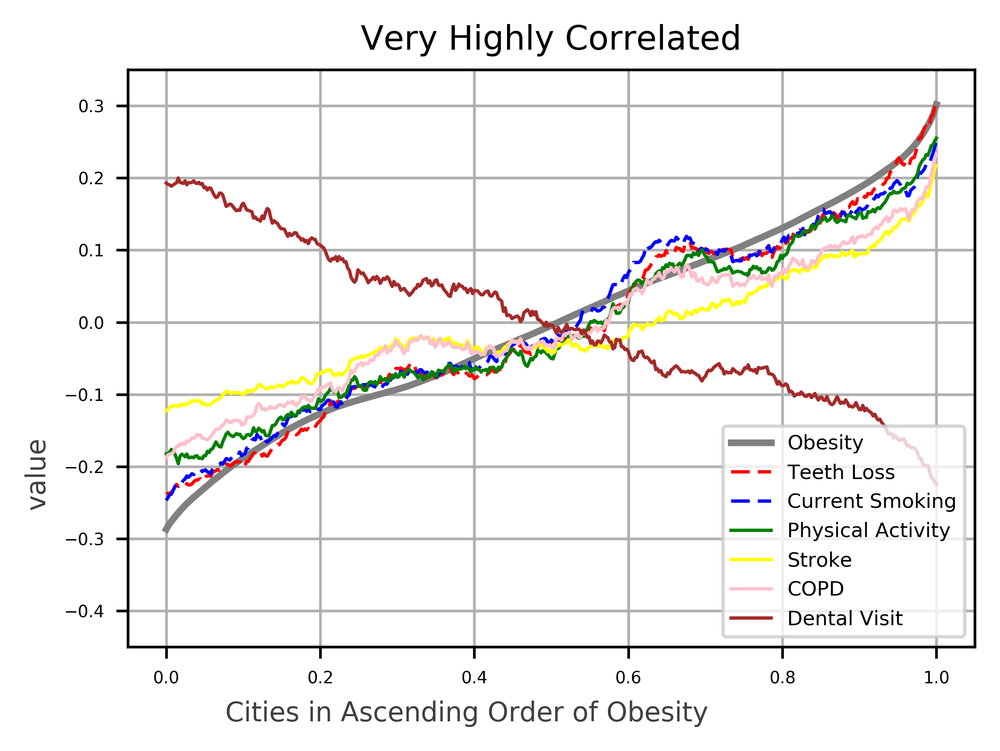

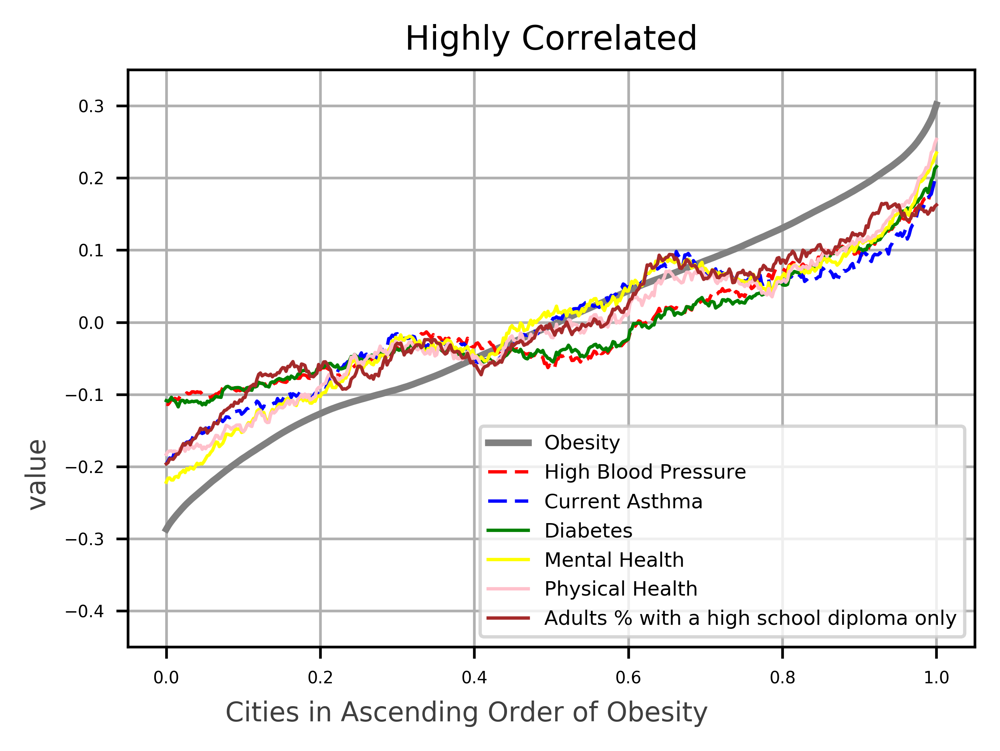

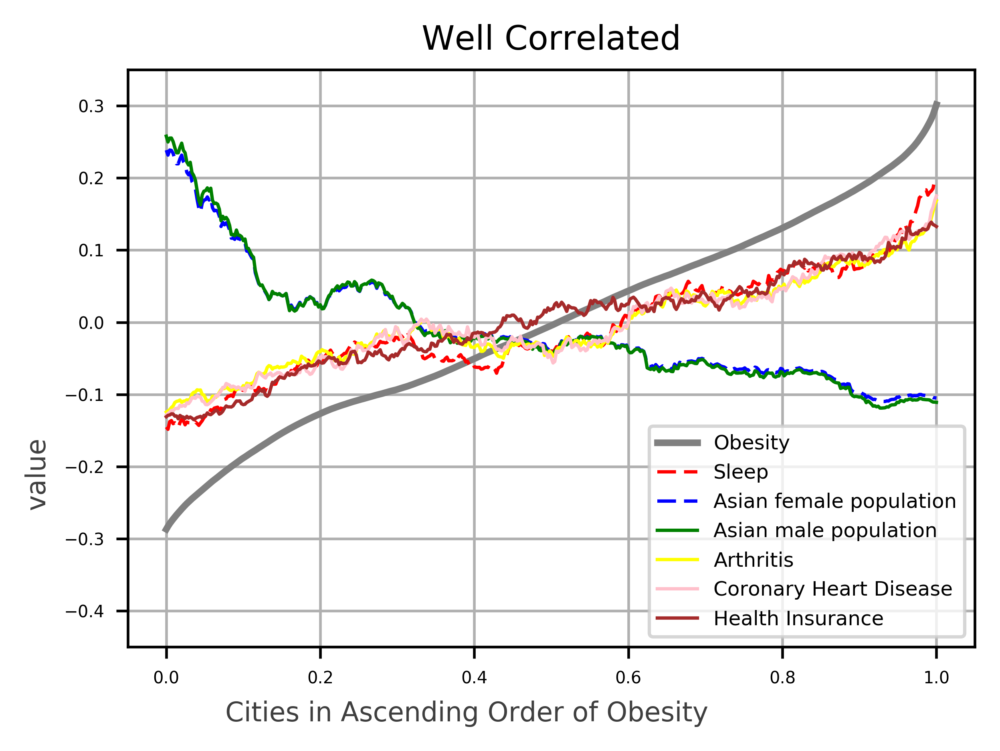

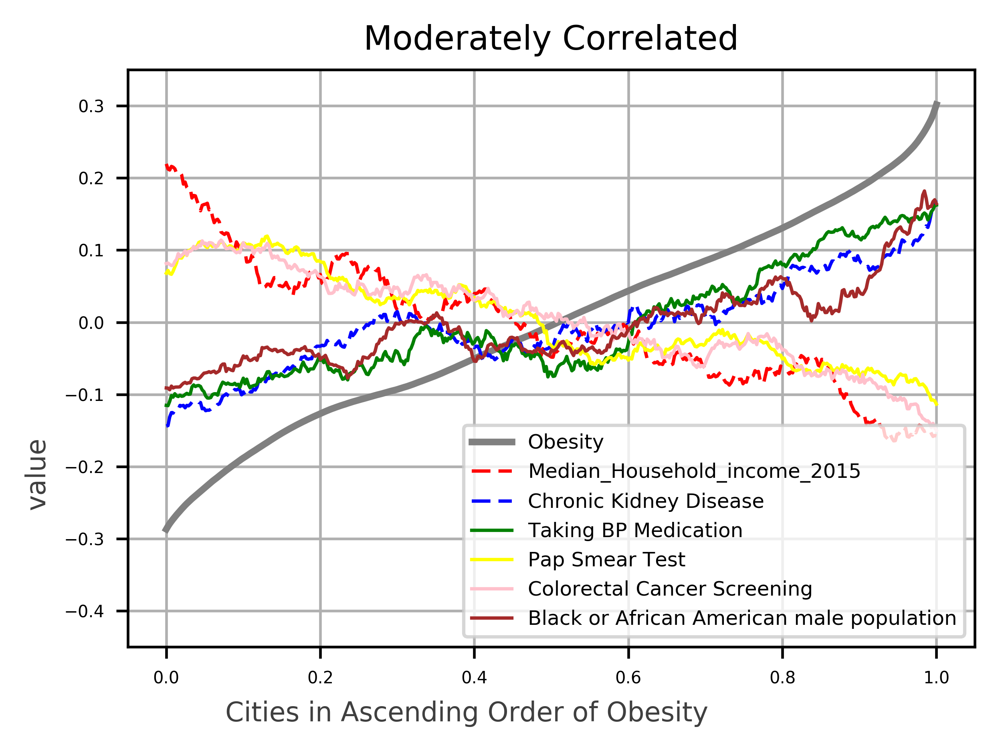

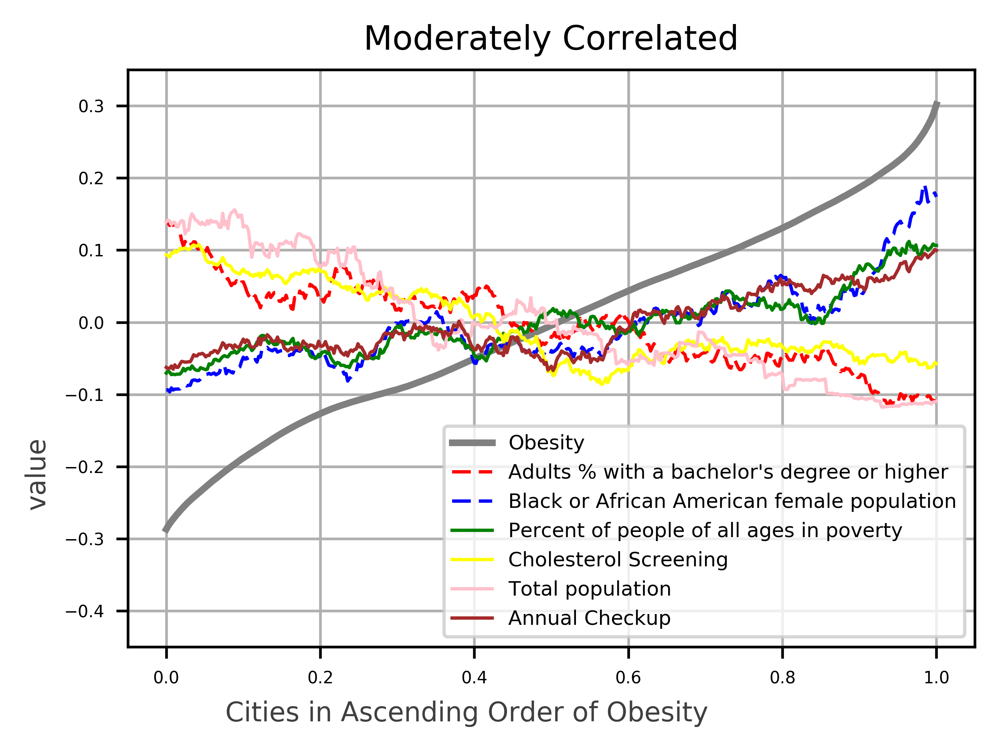

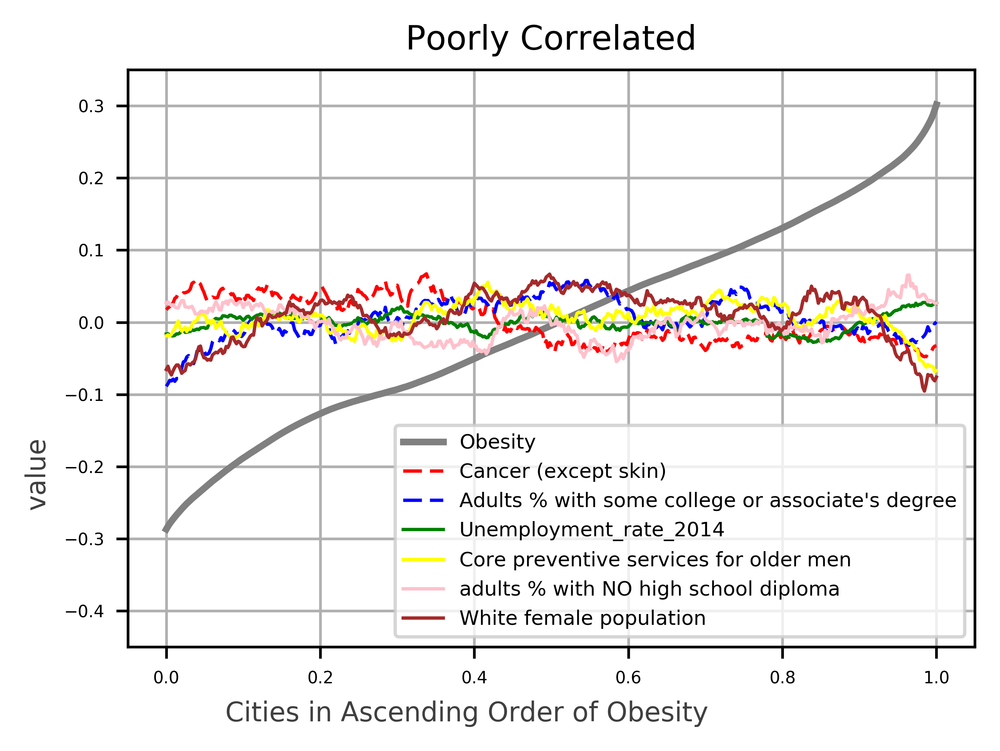

In [743]:

i=1
plotCorr(ZT[0],ZT[IdxSCorr2NP[i]],ZT[IdxSCorr2NP[i+1]],ZT[IdxSCorr2NP[i+2]],ZT[IdxSCorr2NP[i+3]],ZT[IdxSCorr2NP[i+4]], \
    ZT[IdxSCorr2NP[i+5]],L[0],L[IdxSCorr2NP[i]],L[IdxSCorr2NP[i+1]],L[IdxSCorr2NP[i+2]],
    L[IdxSCorr2NP[i+3]],L[IdxSCorr2NP[i+4]],L[IdxSCorr2NP[i+5]],"Very Highly Correlated")

i=7
plotCorr(ZT[0],ZT[IdxSCorr2NP[i]],ZT[IdxSCorr2NP[i+1]],ZT[IdxSCorr2NP[i+2]],ZT[IdxSCorr2NP[i+3]],ZT[IdxSCorr2NP[i+4]], \
    ZT[IdxSCorr2NP[i+5]],L[0],L[IdxSCorr2NP[i]],L[IdxSCorr2NP[i+1]],L[IdxSCorr2NP[i+2]],
    L[IdxSCorr2NP[i+3]],L[IdxSCorr2NP[i+4]],L[IdxSCorr2NP[i+5]],"Highly Correlated")

i=13
plotCorr(ZT[0],ZT[IdxSCorr2NP[i]],ZT[IdxSCorr2NP[i+1]],ZT[IdxSCorr2NP[i+2]],ZT[IdxSCorr2NP[i+3]],ZT[IdxSCorr2NP[i+4]], \
    ZT[IdxSCorr2NP[i+5]],L[0],L[IdxSCorr2NP[i]],L[IdxSCorr2NP[i+1]],L[IdxSCorr2NP[i+2]],
    L[IdxSCorr2NP[i+3]],L[IdxSCorr2NP[i+4]],L[IdxSCorr2NP[i+5]],"Well Correlated")

i=19
plotCorr(ZT[0],ZT[IdxSCorr2NP[i]],ZT[IdxSCorr2NP[i+1]],ZT[IdxSCorr2NP[i+2]],ZT[IdxSCorr2NP[i+3]],ZT[IdxSCorr2NP[i+4]], \
    ZT[IdxSCorr2NP[i+5]],L[0],L[IdxSCorr2NP[i]],L[IdxSCorr2NP[i+1]],L[IdxSCorr2NP[i+2]],
    L[IdxSCorr2NP[i+3]],L[IdxSCorr2NP[i+4]],L[IdxSCorr2NP[i+5]],"Moderately Correlated")
i=25
plotCorr(ZT[0],ZT[IdxSCorr2NP[i]],ZT[IdxSCorr2NP[i+1]],ZT[IdxSCorr2NP[i+2]],ZT[IdxSCorr2NP[i+3]],ZT[IdxSCorr2NP[i+4]], \
    ZT[IdxSCorr2NP[i+5]],L[0],L[IdxSCorr2NP[i]],L[IdxSCorr2NP[i+1]],L[IdxSCorr2NP[i+2]],
    L[IdxSCorr2NP[i+3]],L[IdxSCorr2NP[i+4]],L[IdxSCorr2NP[i+5]],"Moderately Correlated")
i=42
plotCorr(ZT[0],ZT[IdxSCorr2NP[i]],ZT[IdxSCorr2NP[i+1]],ZT[IdxSCorr2NP[i+2]],ZT[IdxSCorr2NP[i+3]],ZT[IdxSCorr2NP[i+4]], \
    ZT[IdxSCorr2NP[i+5]],L[0],L[IdxSCorr2NP[i]],L[IdxSCorr2NP[i+1]],L[IdxSCorr2NP[i+2]],
    L[IdxSCorr2NP[i+3]],L[IdxSCorr2NP[i+4]],L[IdxSCorr2NP[i+5]],"Poorly Correlated")


# Data Unordered by Obesity

In [744]:
A1 = df.reset_index().values
CITY = A1[:,CITY_XLS_CITY_NAME_COL]

# Data Augmentation

In [745]:
for i in range(CITY.shape[0]):
    for j in range(CITY.shape[0]):
        if (CITY[i] == CITY2[j]):
            if (i==0):
                AugD = np.array([AugData[j]])
            else:
                AugD = np.concatenate((AugD, np.array([AugData[j]])), axis=0)
            j+=1
            break
print(AugD.shape)

(500, 21)


In [746]:
print(A1.shape)
print(AugD.shape)

A1=np.concatenate((A1, AugD), axis=1)
print(A1.shape)

(500, 39)
(500, 21)
(500, 60)


# Normalize Population

In [747]:
TOT_POP=47
TOT_M_POP=48
TOT_F_POP=49
POP_END_COL=60
for i in range(A1.shape[0]):
    for j in range(5):
        A1[i][TOT_M_POP+2+j*2]=A1[i][TOT_M_POP+2+j*2]/A1[i][TOT_M_POP]
        A1[i][TOT_F_POP+2+j*2]=A1[i][TOT_F_POP+2+j*2]/A1[i][TOT_F_POP]

for i in range(A1.shape[0]):
    A1[i][TOT_M_POP]=A1[i][TOT_M_POP]/A1[i][TOT_POP]
    A1[i][TOT_F_POP]=A1[i][TOT_F_POP]/A1[i][TOT_POP]
    

In [748]:
AL2=list(df2)
L2=AL2[TRACT_XLS_COL_AUG_DATA-1:]
L=L1+L2

In [749]:
#print(len(L1))
#print(len(L2))
#print(len(L))
#print(L1)
#print(L2)

In [750]:
#X=np.concatenate((A1[:,27:28],A1[:,7:27],A1[:,28:]), axis=1)
X=np.concatenate((A1[:,CITY_XLS_OBESITY_COL:CITY_XLS_OBESITY_COL+1],A1[:,CITY_XLS_DATA_START_COL:CITY_XLS_OBESITY_COL],A1[:,CITY_XLS_OBESITY_COL+1:]), axis=1)
print(X.shape)
print(X[0])

(500, 49)
[31.7 77.3 32.6 11.5 6.1 73.3 3.3 61.1 9.5 29.9 27.3 7.7 11.4 21.9 49.3
 16.2 22.6 45.6 39.7 76.8 17.0 78.6 31.5 18.3 46.5 5.0 81.4 26.1 6.3 48415
 115897 18.0 11.6 26.5 31.2 30.8 660007 0.4730131650118862
 0.5269868349881137 0.5501390170151702 0.5230424219772005
 0.41785503792537926 0.4459324640972931 0.003328080155801558
 0.0030303465922976295 0.016291256662566627 0.016063137012492273
 0.0005957872078720787 0.00047439012118511277]


# Obesity Class Labels

In [751]:
#OBCategory=np.array([20.0, 25.0, 30.0, 50.0])
OBCategory=np.array([20.0, 27.0, 90.0])
#OBCategory=np.array([21.0, 26.0, 90.0])
OBT=np.array(X[:,0:1])
print(X.shape)
print(OBT.shape)
print(np.max(OBT)-np.min(OBT))
print(np.mean(OBT))
OBCL = np.array(OBT)
print(OBCL.shape)

for i in range(X.shape[0]):
    for j in range(OBCategory.shape[0]):
        if (OBCL[i] < OBCategory[j]):
            OBCL[i] = j
            break

# print(np.transpose(OBCL)
OBCLS = np.array(OBCL, dtype=np.int)
temp = np.transpose(OBCLS)
OBCLT=temp[0]
#print(TrOBCLT.shape)

CityDist=np.zeros(OBCLT.shape[0], dtype=np.int)
for j in range(OBCategory.shape[0]):
    CityDist[j]=(OBCLT == j).sum()
    print("Population in Obesity Category {} = {}".format(j, CityDist[j]))

(500, 49)
(500, 1)
26.599999999999998
23.399000000000008
(500, 1)
Population in Obesity Category 0 = 109
Population in Obesity Category 1 = 278
Population in Obesity Category 2 = 113


# Seperate Data into Training and Test data

In [752]:
TRAIN_DATA_SIZE=400
TEST_DATA_SIZE=100
TRAIN_DATA_TIMES_TEST2 = TRAIN_DATA_SIZE/TEST_DATA_SIZE
TRAIN_DATA_TIMES_TEST = int(TRAIN_DATA_TIMES_TEST2)

In [753]:
TrnX = np.array(X[0:TRAIN_DATA_TIMES_TEST,:])
TstX = np.array(X[TRAIN_DATA_TIMES_TEST:TRAIN_DATA_TIMES_TEST+1,:])
TrOBCLI = np.array(OBCL[0:TRAIN_DATA_TIMES_TEST,:])
TsOBCLI = np.array(OBCL[TRAIN_DATA_TIMES_TEST:TRAIN_DATA_TIMES_TEST+1,:])
j=1
#for i in range(TRAIN_DATA_TIMES_TEST+1,XC.shape[0]):
for i in range(4+1,X.shape[0]):
        if (i%5 != 0):
            TrnX=np.concatenate((TrnX, np.array([X[i,:]])), axis=0)
            TrOBCLI=np.concatenate((TrOBCLI, np.array([OBCL[i,:]])), axis=0)
        else:
            TstX=np.concatenate((TstX, np.array([X[i,:]])), axis=0)
            TsOBCLI=np.concatenate((TsOBCLI, np.array([OBCL[i,:]])), axis=0)

print(TrnX.shape)            
print(TstX.shape)            
print(TrOBCLI.shape)            
print(TsOBCLI.shape)            

#X = np.array(TrnX)

TrOBCLK=kesler(TrOBCLI)
TsOBCLK=kesler(TsOBCLI)
#print(OBCL)                                                     
                                                                                                          
TrOBCL = np.array(TrOBCLI, dtype=np.float)
TsOBCL = np.array(TsOBCLI, dtype=np.float)
temp = np.transpose(TrOBCL)
# ground truth for types
TrOBCLT=temp[0]
print(TrOBCLT.shape)
temp1 = np.transpose(TsOBCL)
# ground truth for types
TsOBCLT=temp1[0]
print(TsOBCLT.shape)

CityDist=np.zeros(TrOBCLT.shape[0], dtype=np.int)
for j in range(OBCategory.shape[0]):
    CityDist[j]=(TrOBCLT == j).sum()
    print("Training Population in Obesity Category {} = {}".format(j, CityDist[j]))

CityDist=np.zeros(TsOBCLT.shape[0], dtype=np.int)
for j in range(OBCategory.shape[0]):
    CityDist[j]=(TsOBCLT == j).sum()
    print("Testing Population in Obesity Category {} = {}".format(j, CityDist[j]))



(400, 49)
(100, 49)
(400, 1)
(100, 1)
(400,)
(100,)
Training Population in Obesity Category 0 = 87
Training Population in Obesity Category 1 = 229
Training Population in Obesity Category 2 = 84
Testing Population in Obesity Category 0 = 22
Testing Population in Obesity Category 1 = 49
Testing Population in Obesity Category 2 = 29


# Normalize Data

In [754]:
""" Z """
Trnμ=np.mean(TrnX,axis=0);

In [755]:
TrnZ=TrnX-Trnμ
TrnZ=TrnZ.astype(float)
#ZT = np.transpose(Z)
#for i in range(Z.shape[1]):
#    plottt(ZT[i],ZT[0],L[i],L[0])


In [756]:
Zmin=np.amin(TrnZ, axis=0)
Zmax=np.amax(TrnZ, axis=0)
Zrange=Zmax-Zmin
Zrange[Zrange == 0] = 1
print(Zrange.shape)
TrnZN=TrnZ/Zrange
#ZT = np.transpose(ZN)

#print("CORRELATION Moving Average GRAPH of Features with Obesity")
#for i in range(Z.shape[1]):
#    plottt(ZT[i],ZT[0],L[i],L[0])


(49,)


In [757]:
print(TrnZN.shape)

(400, 49)


# Correlation

In [758]:
CorrNP=np.zeros(TrnZN.shape[1])
CorrNP[0]=1
for i in range(1,TrnZN.shape[1]):
    temp=np.corrcoef(TrnZN[:,i],TrnZN[:,0])
    CorrNP[i]=temp[0,1]

CorrNPAbs=np.absolute(CorrNP)
IdxSCorrNP=sorted(range(len(CorrNPAbs)), key=lambda k: CorrNPAbs[k], reverse=True)
print(IdxSCorrNP)
print(IdxSCorrNP[0])
print('FEATURE CORRELATION with OBESITY from NUMPY Pearsons Correlation\n')
print("{0:6} {1:30} : {2:20}\n".format('Rank','FEATURE','CORRELATION'))
for i in range(1,TrnZN.shape[1]):
    print("{0:5}. {1:30} : {2:20}".format(i,L[IdxSCorrNP[i]],CorrNP[IdxSCorrNP[i]]))
    


[0, 27, 13, 22, 25, 12, 8, 14, 17, 20, 15, 23, 46, 45, 33, 24, 29, 2, 11, 16, 26, 6, 7, 21, 35, 41, 42, 5, 31, 36, 1, 19, 30, 48, 47, 18, 10, 37, 38, 3, 43, 44, 4, 34, 28, 40, 39, 9, 32]
0
FEATURE CORRELATION with OBESITY from NUMPY Pearsons Correlation

Rank   FEATURE                        : CORRELATION         

    1. Teeth Loss                     :   0.7965851155906624
    2. Current Smoking                :   0.7616597882026503
    3. Physical Activity              :   0.6832538626658042
    4. Stroke                         :   0.6650193580315654
    5. Current Asthma                 :   0.6357419828582813
    6. COPD                           :   0.6331081860527926
    7. Dental Visit                   :  -0.6323524207392124
    8. High Blood Pressure            :   0.6251773645663944
    9. Mental Health                  :   0.6161167034785562
   10. Diabetes                       :    0.613352913353773
   11. Physical Health                :   0.5804752193234605
   12. Asian

# TRAINING DATA PREP WITH CORRELATED DATA ONLY

In [759]:
NUM_CORRELATED_FEATURES=31
    
TrXC=np.array((TrnX[:,IdxSCorrNP[1]:IdxSCorrNP[1]+1]))
TrZNC=np.array((TrnZN[:,IdxSCorrNP[1]:IdxSCorrNP[1]+1]))
print(TrXC.shape)
#XC=np.concatenate((XC,X[:,IdxSCorrNP[2]:IdxSCorrNP[2]+1]), axis=1)
LCOR = L[IdxSCorrNP[1]]
for i in range(2,NUM_CORRELATED_FEATURES):
    TrXC = np.concatenate((TrXC, np.array(TrnX[:,IdxSCorrNP[i]:IdxSCorrNP[i]+1])), axis=1)
    TrZNC = np.concatenate((TrZNC, np.array(TrnZN[:,IdxSCorrNP[i]:IdxSCorrNP[i]+1])), axis=1)
    LCOR = LCOR + L[IdxSCorrNP[i]]

print(TrXC.shape)
print(TrXC[0])
print(TrZNC[0])

(400, 1)
(400, 30)
[26.1 21.9 31.5 5.0 11.4 9.5 49.3 45.6 17.0 16.2 18.3 0.016063137012492273
 0.016291256662566627 26.5 46.5 48415 32.6 7.7 22.6 81.4 3.3 61.1 78.6 30.8
 0.41785503792537926 0.4459324640972931 73.3 18.0 660007 77.3]
[ 0.47317814  0.17483645  0.3019697   0.48061111  0.25867089  0.40598214
 -0.35888579  0.51591424  0.43731651  0.45980072  0.51792735 -0.13444898
 -0.14538488  0.06893456  0.42178161 -0.16593923  0.37517336  0.27574324
  0.07117865  0.31149819  0.21116667 -0.00518997 -0.03779    -0.02882979
  0.42246001  0.44363367  0.02722527  0.08776627 -0.0907463   0.29675373]


# TEST DATA PREP WITH CORRELATED DATA ONLY

In [760]:
""" Z """
TstZ=TstX-μ
TstZ=TstZ.astype(float)

In [761]:
TstZN=TstZ/Zrange

In [762]:
TsXC=np.array((TstX[:,IdxSCorrNP[1]:IdxSCorrNP[1]+1]))
TsZNC=np.array((TstZN[:,IdxSCorrNP[1]:IdxSCorrNP[1]+1]))
for i in range(2,NUM_CORRELATED_FEATURES):
    TsXC = np.concatenate((TsXC, np.array(TstX[:,IdxSCorrNP[i]:IdxSCorrNP[i]+1])), axis=1)
    TsZNC = np.concatenate((TsZNC, np.array(TstZN[:,IdxSCorrNP[i]:IdxSCorrNP[i]+1])), axis=1)


# Linear Classifier

In [763]:
TrB = np.ones((TrXC.shape[0],1), dtype=np.float)
TrXA = np.concatenate((TrB,TrXC), axis=1)
TrXA = np.array(TrXA, dtype=np.float)
TrZNA = np.concatenate((TrB,TrZNC), axis=1)
TrZNA = np.array(TrZNA, dtype=np.float)

TsB = np.ones((TsXC.shape[0],1), dtype=np.float)
TsXA = np.concatenate((TsB,TsXC), axis=1)
TsXA = np.array(TsXA, dtype=np.float)
TsZNA = np.concatenate((TsB,TsZNC), axis=1)
TsZNA = np.array(TsZNA, dtype=np.float)

# Linear Classifier with NonLinear Terms

In [764]:
TrB = np.ones((TrXC.shape[0],1), dtype=np.float)
TrXCsq = np.square(TrXC)
TrXCcb = TrXC*TrXCsq

TrXAsq = np.concatenate((np.array(TrB),np.array(TrXC),np.array(TrXCsq)), axis=1)
TrXAsq = np.array(TrXAsq, dtype=np.float)

TrXAcb = np.concatenate((np.array(TrB),np.array(TrXC),np.array(TrXCsq),np.array(TrXCcb)), axis=1)
TrXAcb = np.array(TrXAcb, dtype=np.float)

TsB = np.ones((TsXC.shape[0],1), dtype=np.float)
TsXCsq = np.square(TsXC)
TsXCcb = TsXC*TsXCsq

TsXAsq = np.concatenate((np.array(TsB),np.array(TsXC),np.array(TsXCsq)), axis=1)
TsXAsq = np.array(TsXAsq, dtype=np.float)

TsXAcb = np.concatenate((np.array(TsB),np.array(TsXC),np.array(TsXCsq),np.array(TsXCcb)), axis=1)
TsXAcb = np.array(TsXAcb, dtype=np.float)

print(TrXAsq.shape)
print(TsXAsq.shape)
print(TsXAcb.shape)


(400, 61)
(100, 61)
(100, 91)


In [765]:
#print(TrXC.shape)
#print(TrXCsq.shape)
#print(TrXCcb.shape)
#print(TsXCcb.shape)
#print(TrXAcb.shape)
#print(TsXAcb.shape)
#print(TrXC[0])
#print(TrXCsq[0])
#print(TrXCcb[0])
#print(TsXCcb[0])
#print(TrXAcb[0])
#print(TsXAcb[0])
#print(TrXC.shape)
#print(TrXCsq.shape)
#print(TrXAsq.shape)
#print(TrXAsq[0])


In [766]:
TrB = np.ones((TrXC.shape[0],1), dtype=np.float)
TrZNCsq = np.square(TrZNC)
TrZNCcb = TrZNC*TrZNCsq

TrZNAsq = np.concatenate((np.array(TrB),np.array(TrZNC),np.array(TrZNCsq)), axis=1)
TrZNAsq = np.array(TrZNAsq, dtype=np.float)

TrZNAcb = np.concatenate((np.array(TrB),np.array(TrZNC),np.array(TrZNCsq),np.array(TrZNCcb)), axis=1)
TrZNAcb = np.array(TrZNAcb, dtype=np.float)

TsB = np.ones((TsZNC.shape[0],1), dtype=np.float)
TsZNCsq = np.square(TsZNC)
TsZNCcb = TsZNC*TsZNCsq

TsZNAsq = np.concatenate((np.array(TsB),np.array(TsZNC),np.array(TsZNCsq)), axis=1)
TsZNAsq = np.array(TsZNAsq, dtype=np.float)

TsZNAcb = np.concatenate((np.array(TsB),np.array(TsZNC),np.array(TsZNCsq),np.array(TsZNCcb)), axis=1)
TsZNAcb = np.array(TsZNAcb, dtype=np.float)

print(TrZNAsq.shape)
print(TsZNAsq.shape)
print(TsZNAcb.shape)


(400, 61)
(100, 61)
(100, 91)


# Linear Classification

In [767]:
def ConfMat(t,p):
    c=np.zeros((2,2), dtype=np.int)
    for i in range(t.shape[0]):
        if ((t[i]==-1) and (p[i]==-1)):
            c[0,0]+=1
        if ((t[i]==-1) and (p[i]==1)):
            c[0,1]+=1
        if ((t[i]==1) and (p[i]==-1)):
            c[1,0]+=1
        if ((t[i]==1) and (p[i]==1)):
            c[1,1]+=1
    return c

In [768]:
def ppvcomp(c):
    colsum = np.sum(c, axis=0)
    p=np.zeros((c.shape[1]))   
    r=np.zeros((2,2))   
    for i in range(c.shape[1]):
        p[i] = c[i][i]/colsum[i]
    maxindex=np.argmax(p)
    minindex=np.argmin(p)
    hppv=100.0*p[maxindex]
    lppv=100.0*p[minindex]
    return hppv,maxindex,lppv,minindex
       

In [769]:
def ppvcomp2(c):
    colsum = np.sum(c, axis=0)
    p=np.zeros((c.shape[1]))   
    r=np.zeros((2,2))   
    for i in range(c.shape[1]):
        p[i] = c[i][i]/colsum[i]
    maxindex=np.argmax(p)
    minindex=np.argmin(p)
    hppv=100.0*p[maxindex]
    lppv=100.0*p[minindex]
    return hppv,maxindex,lppv,minindex,p

In [770]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score

def confcalc(t,p):
    mppvarr=precision_score(t,p,average='macro')
    acrarr=accuracy_score(t,p)
    return mppvarr,acrarr


In [771]:
print(TrXA.shape)
print(TsXA.shape)

XaInv = np.linalg.pinv(TrXA)
W = np.dot(XaInv, TrOBCLK)
print(W.shape)

(400, 31)
(100, 31)
(31, 3)


In [772]:
XaInvZN = np.linalg.pinv(TrZNA)
WZN= np.dot(XaInvZN, TrOBCLK)
print(WZN.shape)

(31, 3)


In [773]:
XaInvsq = np.linalg.pinv(TrXAsq)
Wsq = np.dot(XaInvsq, TrOBCLK)
print(Wsq.shape)

(61, 3)


In [774]:
XaInvcb = np.linalg.pinv(TrXAcb)
Wcb = np.dot(XaInvcb, TrOBCLK)
print(Wcb.shape)

(91, 3)


In [775]:
ZNaInvsq = np.linalg.pinv(TrZNAsq)
WZNsq = np.dot(ZNaInvsq, TrOBCLK)
print(WZNsq.shape)

(61, 3)


In [776]:
ZNaInvcb = np.linalg.pinv(TrZNAcb)
WZNcb = np.dot(ZNaInvcb, TrOBCLK)
print(WZNcb.shape)

(91, 3)


# Training Data Test Analysis

NON-NORMALIZED DATA

In [865]:
TTrainType = np.dot(TrXA, W)
maxTrIndex=np.argmax(TTrainType, axis=1)
#print(maxTrindex)

In [866]:
CMTrainType = confusion_matrix(TrOBCLT, maxTrIndex)
print(CMTrainType)

[[ 56  31   0]
 [ 16 200  13]
 [  0  29  55]]


In [867]:
hppv,ppvmaxi,lppv,ppvmini,ppv=ppvcomp2(CMTrainType)
mppv,acr = confcalc(TrOBCLT, maxTrIndex)
print(ppv)
print(mppv,acr)
print(hppv,ppvmaxi,lppv,ppvmini)


[ 0.77777778  0.76923077  0.80882353]
0.785277358807 0.7775
80.8823529412 2 76.9230769231 1


NORMALIZED DATA

In [868]:
TTrainTypeZN = np.dot(TrZNA, WZN)
maxTrIndexZN=np.argmax(TTrainTypeZN, axis=1)
#print(maxTrindex)   

In [869]:
CMTrainTypeZN = confusion_matrix(TrOBCLT, maxTrIndexZN)
print(CMTrainTypeZN)

[[ 56  31   0]
 [ 16 200  13]
 [  0  29  55]]


In [870]:
hppvZN,ppvmaxiZN,lppvZN,ppvminiZN,ppv=ppvcomp2(CMTrainTypeZN)
mppv,acr = confcalc(TrOBCLT, maxTrIndexZN)
print(ppv)
print(mppv,acr)
print(hppvZN,ppvmaxiZN,lppvZN,ppvminiZN)

[ 0.77777778  0.76923077  0.80882353]
0.785277358807 0.7775
80.8823529412 2 76.9230769231 1


ADDITIONAL NON-LINEAR SQUARED DATA

In [871]:
TTrainTypesq = np.dot(TrXAsq, Wsq)
maxTrIndexsq=np.argmax(TTrainTypesq, axis=1)
#print(maxTrindex)

In [872]:
CMTrainTypesq = confusion_matrix(TrOBCLT, maxTrIndexsq)
print(CMTrainTypesq)

[[ 76  11   0]
 [  5 215   9]
 [  0  23  61]]


In [873]:
hppvsq,ppvmaxisq,lppvsq,ppvminisq,ppv=ppvcomp2(CMTrainTypesq)
mppv,acr = confcalc(TrOBCLT, maxTrIndexsq)
print(ppv)
print(mppv,acr)
print(hppvsq,ppvmaxisq,lppvsq,ppvminisq)

[ 0.9382716   0.86345382  0.87142857]
0.891051330543 0.88
93.8271604938 0 86.3453815261 1


ADDITIONAL NORMALIZED NON-LINEAR SQUARED DATA

In [874]:
TTrainTypeZNsq = np.dot(TrZNAsq, WZNsq)
maxTrIndexZNsq=np.argmax(TTrainTypeZNsq, axis=1)
#print(maxTrindex)

In [875]:
CMTrainTypeZNsq = confusion_matrix(TrOBCLT, maxTrIndexZNsq)
print(CMTrainTypeZNsq)

[[ 74  13   0]
 [  4 216   9]
 [  0  23  61]]


In [876]:
hppvsq,ppvmaxisq,lppvsq,ppvminisq,ppv=ppvcomp2(CMTrainTypeZNsq)
mppv,acr = confcalc(TrOBCLT, maxTrIndexZNsq)
print(ppv)
print(mppv,acr)
print(hppvsq,ppvmaxisq,lppvsq,ppvminisq)

[ 0.94871795  0.85714286  0.87142857]
0.89242979243 0.8775
94.8717948718 0 85.7142857143 1


Confusion matrix, without normalization
[[ 74  13   0]
 [  4 216   9]
 [  0  23  61]]


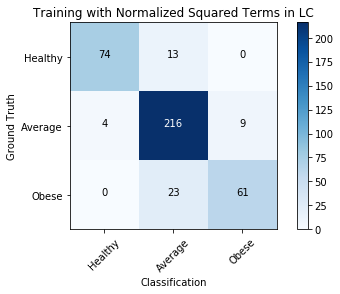

In [889]:
# Plot non-normalized confusion matrix
class_names = ['Healthy', 'Average', 'Obese']
plt.figure()
plot_confusion_matrix(CMTrainTypeZNsq, classes=class_names,
                      title='Training with Normalized Squared Terms in LC')


ADDITIONAL NON-LINEAR SQUARED AND CUBED DATA

In [890]:
TTrainTypecb = np.dot(TrXAcb, Wcb)
maxTrIndexcb=np.argmax(TTrainTypecb, axis=1)
#print(maxTrindex)

In [891]:
CMTrainTypecb = confusion_matrix(TrOBCLT, maxTrIndexcb)
print(CMTrainTypecb)

[[ 30  57   0]
 [ 14 215   0]
 [  1  83   0]]


In [892]:
hppvcb,ppvmaxicb,lppvcb,ppvminicb,ppv=ppvcomp2(CMTrainTypecb)
mppv,acr = confcalc(TrOBCLT, maxTrIndexcb)
print(ppv)
print(mppv,acr)
print(hppvcb,ppvmaxicb,lppvcb,ppvminicb)

[ 0.66666667  0.6056338          nan]
0.424100156495 0.6125
nan 2 nan 2


E:\ProgramData\Anaconda3\lib\site-packages\ipykernel\__main__.py:6: RuntimeWarning: invalid value encountered in long_scalars
E:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1113: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


ADDITIONAL NORMALIZED NON-LINEAR SQUARED AND CUBED DATA

In [893]:
TTrainTypeZNcb = np.dot(TrZNAcb, WZNcb)
maxTrIndexZNcb=np.argmax(TTrainTypeZNcb, axis=1)
#print(maxTrindex)

In [894]:
CMTrainTypeZNcb = confusion_matrix(TrOBCLT, maxTrIndexZNcb)
print(CMTrainTypeZNcb)

[[ 76  11   0]
 [  2 220   7]
 [  0  18  66]]


In [895]:
hppvcb,ppvmaxicb,lppvcb,ppvminicb,ppv=ppvcomp2(CMTrainTypeZNcb)
mppv,acr = confcalc(TrOBCLT, maxTrIndexZNcb)
print(ppv)
print(mppv,acr)
print(hppvcb,ppvmaxicb,lppvcb,ppvminicb)

[ 0.97435897  0.88353414  0.90410959]
0.920667566649 0.905
97.4358974359 0 88.3534136546 1


Confusion matrix, without normalization
[[ 76  11   0]
 [  2 220   7]
 [  0  18  66]]


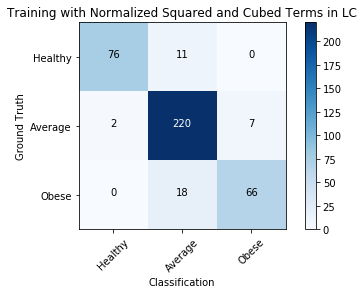

In [896]:
# Plot non-normalized confusion matrix
class_names = ['Healthy', 'Average', 'Obese']
plt.figure()
plot_confusion_matrix(CMTrainTypeZNcb, classes=class_names,
                      title='Training with Normalized Squared and Cubed Terms in LC')
plt.show()

# Testing on Test Data

NON-NORMALIZED DATA

In [897]:
TTestType = np.dot(TsXA, W)
maxTsIndex=np.argmax(TTestType, axis=1)

In [898]:
CMTestType = confusion_matrix(TsOBCLT, maxTsIndex)
print(CMTestType)

[[11 11  0]
 [ 4 43  2]
 [ 0  9 20]]


In [899]:
hppv,ppvmaxi,lppv,ppvmini,ppv=ppvcomp2(CMTestType)
mppv,acr = confcalc(TsOBCLT, maxTsIndex)
print(ppv)
print(mppv,acr)
print(hppv,ppvmaxi,lppv,ppvmini)

[ 0.73333333  0.68253968  0.90909091]
0.774987974988 0.74
90.9090909091 2 68.253968254 1


NORMALIZED DATA

In [900]:
TTestTypeZN = np.dot(TsZNA, WZN)
maxTsIndexZN=np.argmax(TTestTypeZN, axis=1)

In [901]:
CMTestTypeZN = confusion_matrix(TsOBCLT, maxTsIndexZN)
print(CMTestTypeZN)

[[11 11  0]
 [ 4 43  2]
 [ 0  9 20]]


In [902]:
hppvZN,ppvmaxiZN,lppvZN,ppvminiZN,ppv=ppvcomp2(CMTestTypeZN)
mppv,acr = confcalc(TsOBCLT, maxTsIndexZN)
print(ppv)
print(mppv,acr)
print(hppvZN,ppvmaxiZN,lppvZN,ppvminiZN)

[ 0.73333333  0.68253968  0.90909091]
0.774987974988 0.74
90.9090909091 2 68.253968254 1


ADDITIONAL NON-LINEAR SQUARED DATA

In [903]:
TTestTypesq = np.dot(TsXAsq, Wsq)
maxTsIndexsq=np.argmax(TTestTypesq, axis=1)

In [904]:
CMTestTypesq = confusion_matrix(TsOBCLT, maxTsIndexsq)
print(CMTestTypesq)

[[17  5  0]
 [ 2 47  0]
 [ 0  9 20]]


In [905]:
hppvsq,ppvmaxisq,lppvsq,ppvminisq,ppv=ppvcomp2(CMTestTypesq)
mppv,acr = confcalc(TsOBCLT, maxTsIndexsq)
print(ppv)
print(mppv,acr)
print(hppvsq,ppvmaxisq,lppvsq,ppvminisq)

[ 0.89473684  0.7704918   1.        ]
0.888409548461 0.84
100.0 2 77.0491803279 1


ADDITIONAL NORMALIZED NON-LINEAR SQUARED DATA

In [906]:
TTestTypeZNsq = np.dot(TsZNAsq, WZNsq)
maxTsIndexZNsq=np.argmax(TTestTypeZNsq, axis=1)

In [907]:
CMTestTypeZNsq = confusion_matrix(TsOBCLT, maxTsIndexZNsq)
print(CMTestTypeZNsq)

[[17  5  0]
 [ 2 47  0]
 [ 0  9 20]]


In [908]:
hppvsq,ppvmaxisq,lppvsq,ppvminisq,ppv=ppvcomp2(CMTestTypeZNsq)
mppv,acr = confcalc(TsOBCLT, maxTsIndexZNsq)
print(ppv)
print(mppv,acr)
print(hppvsq,ppvmaxisq,lppvsq,ppvminisq)

[ 0.89473684  0.7704918   1.        ]
0.888409548461 0.84
100.0 2 77.0491803279 1


Confusion matrix, without normalization
[[17  5  0]
 [ 2 47  0]
 [ 0  9 20]]


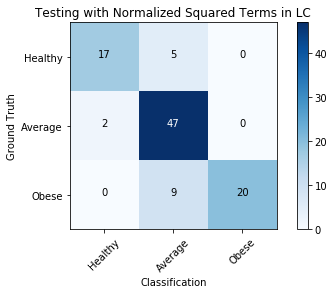

In [909]:
# Plot non-normalized confusion matrix
class_names = ['Healthy', 'Average', 'Obese']
plt.figure()
plot_confusion_matrix(CMTestTypeZNsq, classes=class_names,
                      title='Testing with Normalized Squared Terms in LC')
plt.show()

ADDITIONAL NON-LINEAR SQUARED AND CUBED DATA

In [910]:
TTestTypecb = np.dot(TsXAcb, Wcb)
maxTsIndexcb=np.argmax(TTestTypecb, axis=1)

In [911]:
CMTestTypecb = confusion_matrix(TsOBCLT, maxTsIndexcb)
print(CMTestTypecb)

[[ 4 18  0]
 [ 4 45  0]
 [ 1 28  0]]


In [912]:
hppvcb,ppvmaxicb,lppvcb,ppvminicb,ppv=ppvcomp2(CMTestTypecb)
mppv,acr = confcalc(TsOBCLT, maxTsIndexcb)
print(ppv)
print(mppv,acr)
print(hppvcb,ppvmaxicb,lppvcb,ppvminicb)

[ 0.44444444  0.49450549         nan]
0.312983312983 0.49
nan 2 nan 2


E:\ProgramData\Anaconda3\lib\site-packages\ipykernel\__main__.py:6: RuntimeWarning: invalid value encountered in long_scalars
E:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1113: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


ADDITIONAL NORMALIZED NON-LINEAR SQUARED AND CUBED DATA

In [913]:
TTestTypeZNcb = np.dot(TsZNAcb, WZNcb)
maxTsIndexZNcb=np.argmax(TTestTypeZNcb, axis=1)

In [914]:
CMTestTypeZNcb = confusion_matrix(TsOBCLT, maxTsIndexZNcb)
print(CMTestTypeZNcb)

[[17  5  0]
 [ 3 46  0]
 [ 0 12 17]]


In [915]:
hppvcb,ppvmaxicb,lppvcb,ppvminicb,ppv=ppvcomp2(CMTestTypeZNcb)
mppv,acr = confcalc(TsOBCLT, maxTsIndexZNcb)
print(ppv)
print(mppv,acr)
print(hppvcb,ppvmaxicb,lppvcb,ppvminicb)

[ 0.85        0.73015873  1.        ]
0.860052910053 0.8
100.0 2 73.0158730159 1


Confusion matrix, without normalization
[[17  5  0]
 [ 3 46  0]
 [ 0 12 17]]


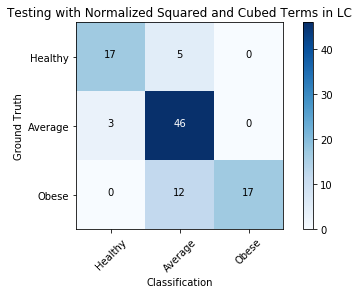

In [916]:
# Plot non-normalized confusion matrix
class_names = ['Healthy', 'Average', 'Obese']
plt.figure()
plot_confusion_matrix(CMTestTypeZNcb, classes=class_names,
                      title='Testing with Normalized Squared and Cubed Terms in LC')
plt.show()

# ITERATIVE LOOP FOR LINEAR CLASSIFICATION

In [813]:
NUM_CORRELATED_FEATURES_NUM = 31
NUM_CORRELATED_FEATURES_ARR_SZ=NUM_CORRELATED_FEATURES_NUM+1

In [814]:
MAspan = 3
def plotLC(arr1, arr2, label1, label2):
    x = np.linspace(0, 1, NUM_CORRELATED_FEATURES_NUM-MAspan+1)
    arr1ma = running_mean(arr1, MAspan)
    arr2ma = running_mean(arr2, MAspan)
#    dashes = [10, 5, 100, 5]  # 10 points on, 5 off, 100 on, 5 off
    fig, ax = plt.subplots()
    line1, = ax.plot(x, arr1ma, '--', linewidth=2,label=label1)
#    line1.set_dashes(dashes)

#    line2, = ax.plot(x, arr2ma, dashes=[30, 5, 10, 5], label=label2)
    line2, = ax.plot(x, arr2ma, linewidth=2, label=label2)
    ax.legend(loc='lower right')
    plt.show()

In [815]:
# create plotting arrays
NUM_CLASSES=3

ppvarr=np.zeros((NUM_CORRELATED_FEATURES_ARR_SZ,NUM_CLASSES), dtype=np.float)
mppvarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
acrarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
hppvarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
ppvmaxiarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
lppvarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
ppvminiarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)

ppvZNarr=np.zeros((NUM_CORRELATED_FEATURES_ARR_SZ,NUM_CLASSES), dtype=np.float)
mppvZNarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
acrZNarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
hppvZNarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
ppvmaxiZNarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
lppvZNarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
ppvminiZNarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)

ppvsqarr=np.zeros((NUM_CORRELATED_FEATURES_ARR_SZ,NUM_CLASSES), dtype=np.float)
mppvsqarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
acrsqarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
hppvsqarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
ppvmaxisqarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
lppvsqarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
ppvminisqarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)

ppvZNsqarr=np.zeros((NUM_CORRELATED_FEATURES_ARR_SZ,NUM_CLASSES), dtype=np.float)
mppvZNsqarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
acrZNsqarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
hppvZNsqarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
ppvmaxiZNsqarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
lppvZNsqarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
ppvminiZNsqarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)

ppvcbarr=np.zeros((NUM_CORRELATED_FEATURES_ARR_SZ,NUM_CLASSES), dtype=np.float)
mppvcbarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
acrcbarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
hppvcbarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
ppvmaxicbarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
lppvcbarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
ppvminicbarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)

ppvZNcbarr=np.zeros((NUM_CORRELATED_FEATURES_ARR_SZ,NUM_CLASSES), dtype=np.float)
mppvZNcbarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
acrZNcbarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
hppvZNcbarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
ppvmaxiZNcbarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
lppvZNcbarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
ppvminiZNcbarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)

Tppvarr=np.zeros((NUM_CORRELATED_FEATURES_ARR_SZ,NUM_CLASSES), dtype=np.float)
Tmppvarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
Tacrarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
Thppvarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
Tppvmaxiarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
Tlppvarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
Tppvminiarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)

TppvZNarr=np.zeros((NUM_CORRELATED_FEATURES_ARR_SZ,NUM_CLASSES), dtype=np.float)
TmppvZNarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
TacrZNarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
ThppvZNarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
TppvmaxiZNarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
TlppvZNarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
TppvminiZNarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)

Tppvsqarr=np.zeros((NUM_CORRELATED_FEATURES_ARR_SZ,NUM_CLASSES), dtype=np.float)
Tmppvsqarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
Tacrsqarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
Thppvsqarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
Tppvmaxisqarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
Tlppvsqarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
Tppvminisqarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)

TppvZNsqarr=np.zeros((NUM_CORRELATED_FEATURES_ARR_SZ,NUM_CLASSES), dtype=np.float)
TmppvZNsqarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
TacrZNsqarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
ThppvZNsqarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
TppvmaxiZNsqarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
TlppvZNsqarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
TppvminiZNsqarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)

Tppvcbarr=np.zeros((NUM_CORRELATED_FEATURES_ARR_SZ,NUM_CLASSES), dtype=np.float)
Tmppvcbarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
Tacrcbarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
Thppvcbarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
Tppvmaxicbarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
Tlppvcbarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
Tppvminicbarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)

TppvZNcbarr=np.zeros((NUM_CORRELATED_FEATURES_ARR_SZ,NUM_CLASSES), dtype=np.float)
TmppvZNcbarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
TacrZNcbarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
ThppvZNcbarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
TppvmaxiZNcbarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
TlppvZNcbarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)
TppvminiZNcbarr=np.zeros(NUM_CORRELATED_FEATURES_ARR_SZ, dtype=np.float)

In [816]:
for NUM_CORRELATED_FEATURES in range(1,NUM_CORRELATED_FEATURES_NUM):

    # TRAINING DATA PREP WITH CORRELATED DATA ONLY

    TrXC = np.array((TrnX[:, IdxSCorrNP[1]:IdxSCorrNP[1] + 1]))
    TrZNC = np.array((TrnZN[:, IdxSCorrNP[1]:IdxSCorrNP[1] + 1]))
    print(TrXC.shape)
    # XC=np.concatenate((XC,X[:,IdxSCorrNP[2]:IdxSCorrNP[2]+1]), axis=1)
    LCOR = L[IdxSCorrNP[1]]
    for i in range(2, NUM_CORRELATED_FEATURES):
        TrXC = np.concatenate((TrXC, np.array(TrnX[:, IdxSCorrNP[i]:IdxSCorrNP[i] + 1])), axis=1)
        TrZNC = np.concatenate((TrZNC, np.array(TrnZN[:, IdxSCorrNP[i]:IdxSCorrNP[i] + 1])), axis=1)
        LCOR = LCOR + L[IdxSCorrNP[i]]

    # TEST DATA PREP WITH CORRELATED DATA ONLY

    """ Z """
    TstZ = TstX - μ
    TstZ = TstZ.astype(float)

    TstZN = TstZ / Zrange

    TsXC = np.array((TstX[:, IdxSCorrNP[1]:IdxSCorrNP[1] + 1]))
    TsZNC = np.array((TstZN[:, IdxSCorrNP[1]:IdxSCorrNP[1] + 1]))
    for i in range(2, NUM_CORRELATED_FEATURES):
        TsXC = np.concatenate((TsXC, np.array(TstX[:, IdxSCorrNP[i]:IdxSCorrNP[i] + 1])), axis=1)
        TsZNC = np.concatenate((TsZNC, np.array(TstZN[:, IdxSCorrNP[i]:IdxSCorrNP[i] + 1])), axis=1)

    # Linear Classifier

    TrB = np.ones((TrXC.shape[0], 1), dtype=np.float)
    TrXA = np.concatenate((TrB, TrXC), axis=1)
    TrXA = np.array(TrXA, dtype=np.float)
    TrZNA = np.concatenate((TrB, TrZNC), axis=1)
    TrZNA = np.array(TrZNA, dtype=np.float)

    TsB = np.ones((TsXC.shape[0], 1), dtype=np.float)
    TsXA = np.concatenate((TsB, TsXC), axis=1)
    TsXA = np.array(TsXA, dtype=np.float)
    TsZNA = np.concatenate((TsB, TsZNC), axis=1)
    TsZNA = np.array(TsZNA, dtype=np.float)

    # Linear Classifier with NonLinear Terms

    TrB = np.ones((TrXC.shape[0], 1), dtype=np.float)
    TrXCsq = np.square(TrXC)
    TrXCcb = TrXC * TrXCsq

    TrXAsq = np.concatenate((np.array(TrB), np.array(TrXC), np.array(TrXCsq)), axis=1)
    TrXAsq = np.array(TrXAsq, dtype=np.float)

    TrXAcb = np.concatenate((np.array(TrB), np.array(TrXC), np.array(TrXCsq), np.array(TrXCcb)), axis=1)
    TrXAcb = np.array(TrXAcb, dtype=np.float)

    TsB = np.ones((TsXC.shape[0], 1), dtype=np.float)
    TsXCsq = np.square(TsXC)
    TsXCcb = TsXC * TsXCsq

    TsXAsq = np.concatenate((np.array(TsB), np.array(TsXC), np.array(TsXCsq)), axis=1)
    TsXAsq = np.array(TsXAsq, dtype=np.float)

    TsXAcb = np.concatenate((np.array(TsB), np.array(TsXC), np.array(TsXCsq), np.array(TsXCcb)), axis=1)
    TsXAcb = np.array(TsXAcb, dtype=np.float)

    #### For Normalized Features

    TrB = np.ones((TrXC.shape[0], 1), dtype=np.float)
    TrZNCsq = np.square(TrZNC)
    TrZNCcb = TrZNC * TrZNCsq

    TrZNAsq = np.concatenate((np.array(TrB), np.array(TrZNC), np.array(TrZNCsq)), axis=1)
    TrZNAsq = np.array(TrZNAsq, dtype=np.float)

    TrZNAcb = np.concatenate((np.array(TrB), np.array(TrZNC), np.array(TrZNCsq), np.array(TrZNCcb)), axis=1)
    TrZNAcb = np.array(TrZNAcb, dtype=np.float)

    TsB = np.ones((TsZNC.shape[0], 1), dtype=np.float)
    TsZNCsq = np.square(TsZNC)
    TsZNCcb = TsZNC * TsZNCsq

    TsZNAsq = np.concatenate((np.array(TsB), np.array(TsZNC), np.array(TsZNCsq)), axis=1)
    TsZNAsq = np.array(TsZNAsq, dtype=np.float)

    TsZNAcb = np.concatenate((np.array(TsB), np.array(TsZNC), np.array(TsZNCsq), np.array(TsZNCcb)), axis=1)
    TsZNAcb = np.array(TsZNAcb, dtype=np.float)

    # Linear Classification

    XaInv = np.linalg.pinv(TrXA)
    W = np.dot(XaInv, TrOBCLK)

    XaInvZN = np.linalg.pinv(TrZNA)
    WZN = np.dot(XaInvZN, TrOBCLK)

    XaInvsq = np.linalg.pinv(TrXAsq)
    Wsq = np.dot(XaInvsq, TrOBCLK)

    XaInvcb = np.linalg.pinv(TrXAcb)
    Wcb = np.dot(XaInvcb, TrOBCLK)

    ZNaInvsq = np.linalg.pinv(TrZNAsq)
    WZNsq = np.dot(ZNaInvsq, TrOBCLK)

    ZNaInvcb = np.linalg.pinv(TrZNAcb)
    WZNcb = np.dot(ZNaInvcb, TrOBCLK)

    # Training Data Test Analysis

    # NON-NORMALIZED DATA
    TTrainType = np.dot(TrXA, W)
    maxTrIndex = np.argmax(TTrainType, axis=1)

    CMTrainType = confusion_matrix(TrOBCLT, maxTrIndex)
    hppv, ppvmaxi, lppv, ppvmini, ppv = ppvcomp2(CMTrainType)

    mppv,acr = confcalc(TrOBCLT, maxTrIndex)
    ppvarr[NUM_CORRELATED_FEATURES] = ppv
    mppvarr[NUM_CORRELATED_FEATURES] = mppv
    acrarr[NUM_CORRELATED_FEATURES] = acr
    
    hppvarr[NUM_CORRELATED_FEATURES] = hppv
    ppvmaxiarr[NUM_CORRELATED_FEATURES] = ppvmaxi
    lppvarr[NUM_CORRELATED_FEATURES] = lppv
    ppvminiarr[NUM_CORRELATED_FEATURES] = ppvmini

    # NORMALIZED DATA
    TTrainTypeZN = np.dot(TrZNA, WZN)
    maxTrIndexZN = np.argmax(TTrainTypeZN, axis=1)

    CMTrainTypeZN = confusion_matrix(TrOBCLT, maxTrIndexZN)

    hppvZN, ppvmaxiZN, lppvZN, ppvminiZN, ppv = ppvcomp2(CMTrainTypeZN)

    mppv,acr = confcalc(TrOBCLT, maxTrIndexZN)
    ppvZNarr[NUM_CORRELATED_FEATURES] = ppv
    mppvZNarr[NUM_CORRELATED_FEATURES] = mppv
    acrZNarr[NUM_CORRELATED_FEATURES] = acr

    hppvZNarr[NUM_CORRELATED_FEATURES] = hppvZN
    ppvmaxiZNarr[NUM_CORRELATED_FEATURES] = ppvmaxiZN
    lppvZNarr[NUM_CORRELATED_FEATURES] = lppvZN
    ppvminiZNarr[NUM_CORRELATED_FEATURES] = ppvminiZN

    # ADDITIONAL NON-LINEAR SQUARED DATA

    TTrainTypesq = np.dot(TrXAsq, Wsq)
    maxTrIndexsq = np.argmax(TTrainTypesq, axis=1)
    CMTrainTypesq = confusion_matrix(TrOBCLT, maxTrIndexsq)

    hppvsq, ppvmaxisq, lppvsq, ppvminisq, ppv = ppvcomp2(CMTrainTypesq)

    mppv,acr = confcalc(TrOBCLT, maxTrIndexsq)
    ppvsqarr[NUM_CORRELATED_FEATURES] = ppv
    mppvsqarr[NUM_CORRELATED_FEATURES] = mppv
    acrsqarr[NUM_CORRELATED_FEATURES] = acr

    hppvsqarr[NUM_CORRELATED_FEATURES] = hppvsq
    ppvmaxisqarr[NUM_CORRELATED_FEATURES] = ppvmaxisq
    lppvsqarr[NUM_CORRELATED_FEATURES] = lppvsq
    ppvminisqarr[NUM_CORRELATED_FEATURES] = ppvminisq

    # ADDITIONAL NORMALIZED NON-LINEAR SQUARED DATA

    TTrainTypeZNsq = np.dot(TrZNAsq, WZNsq)
    maxTrIndexZNsq = np.argmax(TTrainTypeZNsq, axis=1)
    CMTrainTypeZNsq = confusion_matrix(TrOBCLT, maxTrIndexZNsq)

    hppvsq, ppvmaxisq, lppvsq, ppvminisq, ppv = ppvcomp2(CMTrainTypeZNsq)
    mppv,acr = confcalc(TrOBCLT, maxTrIndexZNsq)
    ppvZNsqarr[NUM_CORRELATED_FEATURES] = ppv
    mppvZNsqarr[NUM_CORRELATED_FEATURES] = mppv
    acrZNsqarr[NUM_CORRELATED_FEATURES] = acr

    hppvZNsqarr[NUM_CORRELATED_FEATURES] = hppvsq
    ppvmaxiZNsqarr[NUM_CORRELATED_FEATURES] = ppvmaxisq
    lppvZNsqarr[NUM_CORRELATED_FEATURES] = lppvsq
    ppvminiZNsqarr[NUM_CORRELATED_FEATURES] = ppvminisq

    # ADDITIONAL NON-LINEAR SQUARED AND CUBED DATA

    TTrainTypecb = np.dot(TrXAcb, Wcb)
    maxTrIndexcb = np.argmax(TTrainTypecb, axis=1)
    CMTrainTypecb = confusion_matrix(TrOBCLT, maxTrIndexcb)

    hppvcb, ppvmaxicb, lppvcb, ppvminicb, ppv = ppvcomp2(CMTrainTypecb)
    mppv,acr = confcalc(TrOBCLT, maxTrIndexcb)
    ppvcbarr[NUM_CORRELATED_FEATURES] = ppv
    mppvcbarr[NUM_CORRELATED_FEATURES] = mppv
    acrcbarr[NUM_CORRELATED_FEATURES] = acr

    hppvcbarr[NUM_CORRELATED_FEATURES] = hppvcb
    ppvmaxicbarr[NUM_CORRELATED_FEATURES] = ppvmaxicb
    lppvcbarr[NUM_CORRELATED_FEATURES] = lppvcb
    ppvminicbarr[NUM_CORRELATED_FEATURES] = ppvminicb

    # ADDITIONAL NORMALIZED NON-LINEAR SQUARED AND CUBED DATA

    TTrainTypeZNcb = np.dot(TrZNAcb, WZNcb)
    maxTrIndexZNcb = np.argmax(TTrainTypeZNcb, axis=1)
    CMTrainTypeZNcb = confusion_matrix(TrOBCLT, maxTrIndexZNcb)
    hppvcb, ppvmaxicb, lppvcb, ppvminicb, ppv = ppvcomp2(CMTrainTypeZNcb)
    mppv,acr = confcalc(TrOBCLT, maxTrIndexZNcb)
    ppvZNcbarr[NUM_CORRELATED_FEATURES] = ppv
    mppvZNcbarr[NUM_CORRELATED_FEATURES] = mppv
    acrZNcbarr[NUM_CORRELATED_FEATURES] = acr

    hppvZNcbarr[NUM_CORRELATED_FEATURES] = hppvcb
    ppvmaxiZNcbarr[NUM_CORRELATED_FEATURES] = ppvmaxicb
    lppvZNcbarr[NUM_CORRELATED_FEATURES] = lppvcb
    ppvminiZNcbarr[NUM_CORRELATED_FEATURES] = ppvminicb

    # # Testing on Test Data

    # NON-NORMALIZED DATA
    TTestType = np.dot(TsXA, W)
    maxTsIndex = np.argmax(TTestType, axis=1)
    CMTestType = confusion_matrix(TsOBCLT, maxTsIndex)
    hppv, ppvmaxi, lppv, ppvmini, ppv = ppvcomp2(CMTestType)
    mppv,acr = confcalc(TsOBCLT, maxTsIndex)
    Tppvarr[NUM_CORRELATED_FEATURES] = ppv
    Tmppvarr[NUM_CORRELATED_FEATURES] = mppv
    Tacrarr[NUM_CORRELATED_FEATURES] = acr

    Thppvarr[NUM_CORRELATED_FEATURES] = hppv
    Tppvmaxiarr[NUM_CORRELATED_FEATURES] = ppvmaxi
    Tlppvarr[NUM_CORRELATED_FEATURES] = lppv
    Tppvminiarr[NUM_CORRELATED_FEATURES] = ppvmini

    # NORMALIZED DATA
    TTestTypeZN = np.dot(TsZNA, WZN)
    maxTsIndexZN = np.argmax(TTestTypeZN, axis=1)
    CMTestTypeZN = confusion_matrix(TsOBCLT, maxTsIndexZN)
    hppvZN, ppvmaxiZN, lppvZN, ppvminiZN, ppv = ppvcomp2(CMTestTypeZN)
    mppv,acr = confcalc(TsOBCLT, maxTsIndexZN)
    TppvZNarr[NUM_CORRELATED_FEATURES] = ppv
    TmppvZNarr[NUM_CORRELATED_FEATURES] = mppv
    TacrZNarr[NUM_CORRELATED_FEATURES] = acr
    ThppvZNarr[NUM_CORRELATED_FEATURES] = hppvZN
    TppvmaxiZNarr[NUM_CORRELATED_FEATURES] = ppvmaxiZN
    TlppvZNarr[NUM_CORRELATED_FEATURES] = lppvZN
    TppvminiZNarr[NUM_CORRELATED_FEATURES] = ppvminiZN

    # ADDITIONAL NON-LINEAR SQUARED DATA
    TTestTypesq = np.dot(TsXAsq, Wsq)
    maxTsIndexsq = np.argmax(TTestTypesq, axis=1)
    CMTestTypesq = confusion_matrix(TsOBCLT, maxTsIndexsq)
    hppvsq, ppvmaxisq, lppvsq, ppvminisq, ppv = ppvcomp2(CMTestTypesq)
    mppv,acr = confcalc(TsOBCLT, maxTsIndexsq)
    Tppvsqarr[NUM_CORRELATED_FEATURES] = ppv
    Tmppvsqarr[NUM_CORRELATED_FEATURES] = mppv
    Tacrsqarr[NUM_CORRELATED_FEATURES] = acr
    Thppvsqarr[NUM_CORRELATED_FEATURES] = hppvsq
    Tppvmaxisqarr[NUM_CORRELATED_FEATURES] = ppvmaxisq
    Tlppvsqarr[NUM_CORRELATED_FEATURES] = lppvsq
    Tppvminisqarr[NUM_CORRELATED_FEATURES] = ppvminisq

    # ADDITIONAL NORMALIZED NON-LINEAR SQUARED DATA
    TTestTypeZNsq = np.dot(TsZNAsq, WZNsq)
    maxTsIndexZNsq = np.argmax(TTestTypeZNsq, axis=1)
    CMTestTypeZNsq = confusion_matrix(TsOBCLT, maxTsIndexZNsq)
    hppvsq, ppvmaxisq, lppvsq, ppvminisq, ppv = ppvcomp2(CMTestTypeZNsq)
    mppv,acr = confcalc(TsOBCLT, maxTsIndexZNsq)
    TppvZNsqarr[NUM_CORRELATED_FEATURES] = ppv
    TmppvZNsqarr[NUM_CORRELATED_FEATURES] = mppv
    TacrZNsqarr[NUM_CORRELATED_FEATURES] = acr
    ThppvZNsqarr[NUM_CORRELATED_FEATURES] = hppvsq
    TppvmaxiZNsqarr[NUM_CORRELATED_FEATURES] = ppvmaxisq
    TlppvZNsqarr[NUM_CORRELATED_FEATURES] = lppvsq
    TppvminiZNsqarr[NUM_CORRELATED_FEATURES] = ppvminisq

    # ADDITIONAL NON-LINEAR SQUARED AND CUBED DATA
    TTestTypecb = np.dot(TsXAcb, Wcb)
    maxTsIndexcb = np.argmax(TTestTypecb, axis=1)
    CMTestTypecb = confusion_matrix(TsOBCLT, maxTsIndexcb)
    hppvcb, ppvmaxicb, lppvcb, ppvminicb, ppv = ppvcomp2(CMTestTypecb)
    mppv,acr = confcalc(TsOBCLT, maxTsIndexcb)
    Tppvcbarr[NUM_CORRELATED_FEATURES] = ppv
    Tmppvcbarr[NUM_CORRELATED_FEATURES] = mppv
    Tacrcbarr[NUM_CORRELATED_FEATURES] = acr
    Thppvcbarr[NUM_CORRELATED_FEATURES] = hppvcb
    Tppvmaxicbarr[NUM_CORRELATED_FEATURES] = ppvmaxicb
    Tlppvcbarr[NUM_CORRELATED_FEATURES] = lppvcb
    Tppvminicbarr[NUM_CORRELATED_FEATURES] = ppvminicb

    # ADDITIONAL NORMALIZED NON-LINEAR SQUARED AND CUBED DATA
    TTestTypeZNcb = np.dot(TsZNAcb, WZNcb)
    maxTsIndexZNcb = np.argmax(TTestTypeZNcb, axis=1)
    CMTestTypeZNcb = confusion_matrix(TsOBCLT, maxTsIndexZNcb)
    hppvcb, ppvmaxicb, lppvcb, ppvminicb, ppv = ppvcomp2(CMTestTypeZNcb)
    mppv,acr = confcalc(TsOBCLT, maxTsIndexZNcb)
    TppvZNcbarr[NUM_CORRELATED_FEATURES] = ppv
    TmppvZNcbarr[NUM_CORRELATED_FEATURES] = mppv
    TacrZNcbarr[NUM_CORRELATED_FEATURES] = acr
    ThppvZNcbarr[NUM_CORRELATED_FEATURES] = hppvcb
    TppvmaxiZNcbarr[NUM_CORRELATED_FEATURES] = ppvmaxicb
    TlppvZNcbarr[NUM_CORRELATED_FEATURES] = lppvcb
    TppvminiZNcbarr[NUM_CORRELATED_FEATURES] = ppvminicb



(400, 1)
(400, 1)
(400, 1)
(400, 1)
(400, 1)
(400, 1)
(400, 1)
(400, 1)
(400, 1)
(400, 1)
(400, 1)
(400, 1)
(400, 1)
(400, 1)
(400, 1)
(400, 1)
(400, 1)
(400, 1)
(400, 1)
(400, 1)
(400, 1)
(400, 1)
(400, 1)
(400, 1)
(400, 1)
(400, 1)
(400, 1)
(400, 1)
(400, 1)
(400, 1)


E:\ProgramData\Anaconda3\lib\site-packages\ipykernel\__main__.py:6: RuntimeWarning: invalid value encountered in long_scalars
E:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1113: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [817]:
print(NUM_CORRELATED_FEATURES_ARR_SZ)
print(hppvarr[1:-1].shape)

32
(30,)


In [818]:
def plotLC(arr1, arr2, label1, label2):
    x = np.linspace(0, 1, NUM_CORRELATED_FEATURES_ARR_SZ-4)
#    arr1ma = running_mean(arr1, MAspan)
#    arr2ma = running_mean(arr2, MAspan)
#    dashes = [10, 5, 100, 5]  # 10 points on, 5 off, 100 on, 5 off
    fig, ax = plt.subplots()
    line1, = ax.plot(x, arr1, '--', linewidth=2,label=label1)
#    line1.set_dashes(dashes)

#    line2, = ax.plot(x, arr2ma, dashes=[30, 5, 10, 5], label=label2)
    line2, = ax.plot(x, arr2, linewidth=2, label=label2)
    ax.legend(loc='lower right')
    plt.show()

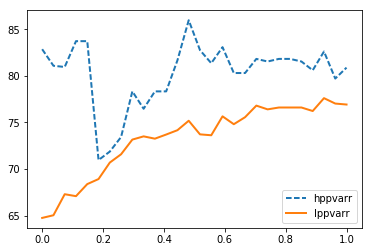

In [819]:
plotLC(hppvarr[3:-1], lppvarr[3:-1], "hppvarr", "lppvarr")

In [820]:
def plotLC5(arr1, arr2, arr3, arr4, label1, label2, label3, label4, title):
    x = np.linspace(1, NUM_CORRELATED_FEATURES_ARR_SZ-3, NUM_CORRELATED_FEATURES_ARR_SZ-4)
    y = np.linspace(0, 100, 100)
    fig, ax = plt.subplots()
    line1, = ax.plot(x, arr1, '--', linewidth=2,label=label1)
    line2, = ax.plot(x, arr2, linewidth=2, label=label2)
    line3, = ax.plot(x, arr3, '--', linewidth=2,label=label3)
    line4, = ax.plot(x, arr4, linewidth=2, label=label4)
    ax.legend(loc='lower right')
    plt.show()

In [921]:
import pylab as plb

def plotLC3(arr1, arr2, arr3, label1, label2, label3, title):
    # 10. Create a figure, give it a 4tle and specify your own size and dpi
    plb.figure(figsize=(9,6), dpi=600)

    # 11. Plot the sin of D, in the (2,1,1) loca4on of the figure
    x = np.linspace(1, NUM_CORRELATED_FEATURES_ARR_SZ-3, NUM_CORRELATED_FEATURES_ARR_SZ-4)
    plb.subplot(2,2,1)
    plb.plot(x, arr1, color="black", linewidth=0.7, linestyle="-")
    plb.subplot(2,2,1)
    plb.plot(x, arr2, color="green", linewidth=1.0, linestyle="-")
    plb.subplot(2,2,1)
    plb.plot(x, arr3, color="BLUE", linewidth=1.0, linestyle=":")
    # 13. Create some space on top and bottom of the plot (on the y axis) and show the grid
    plb.xlim(-2,31)
    plb.ylim(50, 100 * 1.01)
    plb.xticks(fontsize = 5)
    plb.yticks(fontsize = 5)
#    plb.xticks([-plb.pi*3, -5*plb.pi/2, -plb.pi*2, -3*plb.pi/2, -plb.pi, -plb.pi/2, 0, plb.pi/2, plb.pi, 3*plb.pi/2, plb.pi*2], \
#        ['$-3\pi$', '$-5\pi/2$', '$-2\pi$', '$-3\pi/2$',  '$-\pi$', '$-\pi/2$', '$0$', '$1\pi/2$',  '$\pi$', '$3\pi/2$',  '$2\pi$'])                                                     
#    plb.yticks([-1, 0, 1], \
#        ['$-1$', '$0$', '$+1$'])
    plb.grid()

    # 14. Specify the following: title, Y-axis label and legend to fit in the best way
    #fig = plb.gcf()
    #fig.canvas.set_window_title('Sin and Cos')
    plb.title(title, fontsize = 7)
    plb.xlabel('number of features', fontsize = 8, position=(0.4,0), color='black', alpha=0.95)
    plb.ylabel('percentage', fontsize = 8, position=(0, 0.3), color='black', alpha=0.95)
    plb.legend([label1, label2, label3], fontsize = 7, loc='lower right')
    #fig.canvas.draw()

    plb.show()


In [822]:
import pylab as plb

def plotLC4(arr1, arr2, arr3, arr4, label1, label2, label3, label4, title):
    # 10. Create a figure, give it a 4tle and specify your own size and dpi
    plb.figure(figsize=(10,7), dpi=600)

    # 11. Plot the sin of D, in the (2,1,1) loca4on of the figure
    x = np.linspace(1, NUM_CORRELATED_FEATURES_ARR_SZ-3, NUM_CORRELATED_FEATURES_ARR_SZ-4)
    plb.subplot(2,2,1)
    plb.plot(x, arr1, color="blue", linewidth=0.7)

    # 12. Overlay a plot of cos using D, with different color, thickness and type of line
    plb.subplot(2,2,1)
    plb.plot(x, arr2, color="blue", linewidth=0.7, linestyle="--")
    plb.subplot(2,2,1)
    plb.plot(x, arr3, color="green", linewidth=0.7)
    plb.subplot(2,2,1)
    plb.plot(x, arr4, color="green", linewidth=0.7, linestyle="--")
    # 13. Create some space on top and bottom of the plot (on the y axis) and show the grid
    plb.xlim(-2,31)
    plb.ylim(60, 100 * 1.01)
    plb.xticks(fontsize = 5)
    plb.yticks(fontsize = 5)
#    plb.xticks([-plb.pi*3, -5*plb.pi/2, -plb.pi*2, -3*plb.pi/2, -plb.pi, -plb.pi/2, 0, plb.pi/2, plb.pi, 3*plb.pi/2, plb.pi*2], \
#        ['$-3\pi$', '$-5\pi/2$', '$-2\pi$', '$-3\pi/2$',  '$-\pi$', '$-\pi/2$', '$0$', '$1\pi/2$',  '$\pi$', '$3\pi/2$',  '$2\pi$'])                                                     
#    plb.yticks([-1, 0, 1], \
#        ['$-1$', '$0$', '$+1$'])
    plb.grid()

    # 14. Specify the following: title, Y-axis label and legend to fit in the best way
    #fig = plb.gcf()
    #fig.canvas.set_window_title('Sin and Cos')
    plb.title(title, fontsize = 10)
    plb.xlabel('number of features', fontsize = 8, position=(0.4,0), color='black', alpha=0.75)
    plb.ylabel('percentage', fontsize = 8, position=(0, 0.3), color='black', alpha=0.75)
    plb.legend([label1, label2, label3, label4], fontsize = 7, loc='lower right')
    #fig.canvas.draw()

    plb.show()


In [823]:
import pylab as plb

def plotLC6(arr1, arr2, arr3, arr4, arr5, arr6, label1, label2, label3, label4, label5, label6, title):
    # 10. Create a figure, give it a 4tle and specify your own size and dpi
    plb.figure(figsize=(13,10), dpi=600)

    # 11. Plot the sin of D, in the (2,1,1) loca4on of the figure
    x = np.linspace(1, NUM_CORRELATED_FEATURES_ARR_SZ-3, NUM_CORRELATED_FEATURES_ARR_SZ-4)
    plb.subplot(2,2,1)
    plb.plot(x, arr1, color="brown", linewidth=0.7)

    # 12. Overlay a plot of cos using D, with different color, thickness and type of line
    plb.subplot(2,2,1)
    plb.plot(x, arr2, color="brown", linewidth=0.7, linestyle="--")
    plb.subplot(2,2,1)
    plb.plot(x, arr3, color="green", linewidth=0.7)
    plb.subplot(2,2,1)
    plb.plot(x, arr4, color="green", linewidth=0.7, linestyle="--")
    plb.subplot(2,2,1)
    plb.plot(x, arr5, color="cyan", linewidth=0.9)
    plb.subplot(2,2,1)
    plb.plot(x, arr6, color="cyan", linewidth=0.9, linestyle="--")
    # 13. Create some space on top and bottom of the plot (on the y axis) and show the grid
    plb.xlim(-2,31)
    plb.ylim(50, 100 * 1.01)
    plb.xticks(fontsize = 5)
    plb.yticks(fontsize = 5)
#    plb.xticks([-plb.pi*3, -5*plb.pi/2, -plb.pi*2, -3*plb.pi/2, -plb.pi, -plb.pi/2, 0, plb.pi/2, plb.pi, 3*plb.pi/2, plb.pi*2], \
#        ['$-3\pi$', '$-5\pi/2$', '$-2\pi$', '$-3\pi/2$',  '$-\pi$', '$-\pi/2$', '$0$', '$1\pi/2$',  '$\pi$', '$3\pi/2$',  '$2\pi$'])                                                     
#    plb.yticks([-1, 0, 1], \
#        ['$-1$', '$0$', '$+1$'])
    plb.grid()

    # 14. Specify the following: title, Y-axis label and legend to fit in the best way
    #fig = plb.gcf()
    #fig.canvas.set_window_title('Sin and Cos')
    plb.title(title, fontsize = 10)
    plb.xlabel('number of features', fontsize = 8, position=(0.4,0), color='black', alpha=0.75)
    plb.ylabel('percentage', fontsize = 8, position=(0, 0.3), color='black', alpha=0.75)
    plb.legend([label1, label2, label3, label4, label5, label6], fontsize = 8, loc='lower right')
    #fig.canvas.draw()

    plb.show()


In [824]:
import pylab as plb

def plotLC8(arr1, arr2, arr3, arr4, arr5, arr6, arr7, arr8, label1, label2, label3, label4, label5, label6, label7, label8, title):
    # 10. Create a figure, give it a 4tle and specify your own size and dpi
    plb.figure(figsize=(11,8), dpi=600)

    # 11. Plot the sin of D, in the (2,1,1) loca4on of the figure
    x = np.linspace(1, NUM_CORRELATED_FEATURES_ARR_SZ-3, NUM_CORRELATED_FEATURES_ARR_SZ-4)
    plb.subplot(2,2,1)
    plb.plot(x, arr1*100, color="brown", linewidth=0.7, linestyle="-")
    plb.subplot(2,2,1)
    plb.plot(x, arr2*100, color="brown", linewidth=0.7, linestyle=":")
    plb.subplot(2,2,1)
    plb.plot(x, arr3*100, color="brown", linewidth=0.7, linestyle="-.")
    plb.subplot(2,2,1)
    plb.plot(x, arr4*100, color="brown", linewidth=0.7, linestyle="--")
    plb.subplot(2,2,1)
    plb.plot(x, arr5*100, color="blue", linewidth=0.7, linestyle="-")
    plb.subplot(2,2,1)
    plb.plot(x, arr6*100, color="blue", linewidth=0.7, linestyle=":")
    plb.subplot(2,2,1)
    plb.plot(x, arr7*100, color="blue", linewidth=0.7, linestyle="-.")
    plb.subplot(2,2,1)
    plb.plot(x, arr8*100, color="blue", linewidth=0.7, linestyle="--")
    # 13. Create some space on top and bottom of the plot (on the y axis) and show the grid
    plb.xlim(-2,31)
    plb.ylim(45, 100 * 1.01)
    plb.xticks(fontsize = 5)
    plb.yticks(fontsize = 5)
#    plb.xticks([-plb.pi*3, -5*plb.pi/2, -plb.pi*2, -3*plb.pi/2, -plb.pi, -plb.pi/2, 0, plb.pi/2, plb.pi, 3*plb.pi/2, plb.pi*2], \
#        ['$-3\pi$', '$-5\pi/2$', '$-2\pi$', '$-3\pi/2$',  '$-\pi$', '$-\pi/2$', '$0$', '$1\pi/2$',  '$\pi$', '$3\pi/2$',  '$2\pi$'])                                                     
#    plb.yticks([-1, 0, 1], \
#        ['$-1$', '$0$', '$+1$'])
    plb.grid()

    # 14. Specify the following: title, Y-axis label and legend to fit in the best way
    #fig = plb.gcf()
    #fig.canvas.set_window_title('Sin and Cos')
    plb.title(title, fontsize = 10)
    plb.xlabel('number of features', fontsize = 8, position=(0.4,0), color='black', alpha=0.75)
    plb.ylabel('percentage', fontsize = 8, position=(0, 0.3), color='black', alpha=0.75)
    plb.legend([label1, label2, label3, label4, label5, label6, label7, label8], fontsize = 6, loc='lower right')
    #fig.canvas.draw()

    plb.show()


In [926]:
import pylab as plb

def plotLC8b(arr1, arr2, arr3, arr4, arr5, arr6, arr7, arr8, label1, label2, label3, label4, label5, label6, label7, label8, title):
    # 10. Create a figure, give it a 4tle and specify your own size and dpi
    plb.figure(figsize=(11,8), dpi=600)

    # 11. Plot the sin of D, in the (2,1,1) loca4on of the figure
    x = np.linspace(1, NUM_CORRELATED_FEATURES_ARR_SZ-3, NUM_CORRELATED_FEATURES_ARR_SZ-4)
    plb.subplot(2,2,1)
    plb.plot(x, arr1*100, color="black", linewidth=1.5, linestyle=":")
    plb.subplot(2,2,1)
    plb.plot(x, arr2*100, color="green", linewidth=0.7, linestyle=":")
    plb.subplot(2,2,1)
    plb.plot(x, arr3*100, color="cyan", linewidth=0.7, linestyle=":")
    plb.subplot(2,2,1)
    plb.plot(x, arr4*100, color="red", linewidth=0.7, linestyle=":")
    plb.subplot(2,2,1)
    plb.plot(x, arr5*100, color="black", linewidth=0.7, linestyle="-")
    plb.subplot(2,2,1)
    plb.plot(x, arr6*100, color="green", linewidth=0.7, linestyle="-")
    plb.subplot(2,2,1)
    plb.plot(x, arr7*100, color="cyan", linewidth=0.7, linestyle="-")
    plb.subplot(2,2,1)
    plb.plot(x, arr8*100, color="red", linewidth=0.7, linestyle="-")
    # 13. Create some space on top and bottom of the plot (on the y axis) and show the grid
    plb.xlim(-2,31)
    plb.ylim(45, 100 * 1.01)
    plb.xticks(fontsize = 5)
    plb.yticks(fontsize = 5)
#    plb.xticks([-plb.pi*3, -5*plb.pi/2, -plb.pi*2, -3*plb.pi/2, -plb.pi, -plb.pi/2, 0, plb.pi/2, plb.pi, 3*plb.pi/2, plb.pi*2], \
#        ['$-3\pi$', '$-5\pi/2$', '$-2\pi$', '$-3\pi/2$',  '$-\pi$', '$-\pi/2$', '$0$', '$1\pi/2$',  '$\pi$', '$3\pi/2$',  '$2\pi$'])                                                     
#    plb.yticks([-1, 0, 1], \
#        ['$-1$', '$0$', '$+1$'])
    plb.grid()

    # 14. Specify the following: title, Y-axis label and legend to fit in the best way
    #fig = plb.gcf()
    #fig.canvas.set_window_title('Sin and Cos')
    plb.title(title, fontsize = 10)
    plb.xlabel('number of features', fontsize = 8, position=(0.4,0), color='black', alpha=0.75)
    plb.ylabel('percentage', fontsize = 8, position=(0, 0.3), color='black', alpha=0.75)
    plb.legend([label1, label2, label3, label4, label5, label6, label7, label8], fontsize = 6, loc='lower right')
    #fig.canvas.draw()

    plb.show()


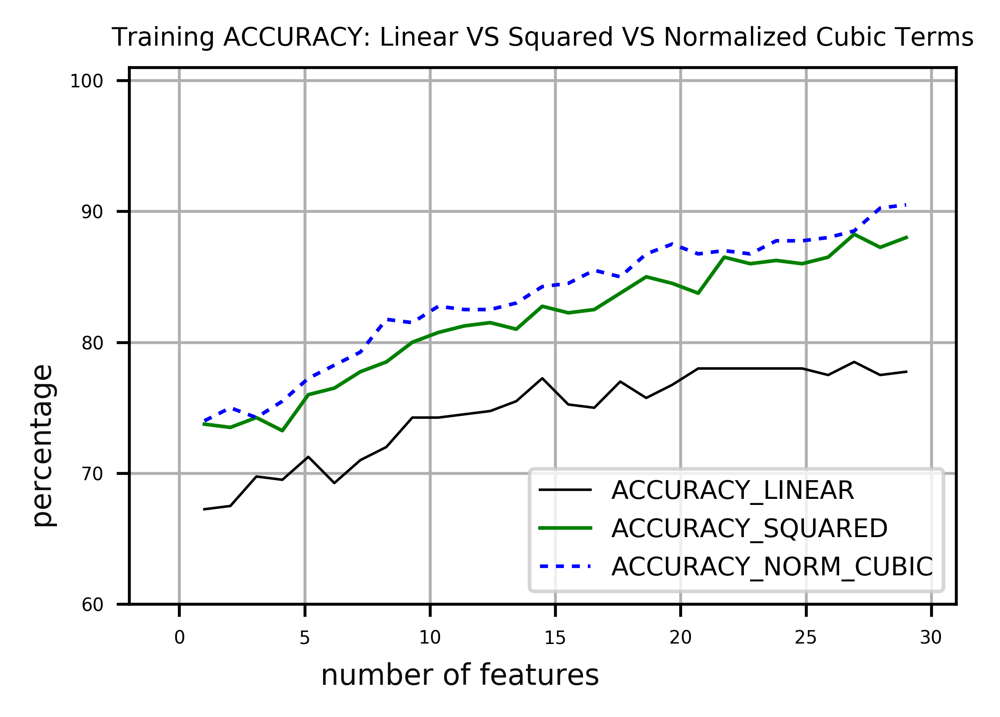

In [826]:
plotLC3(acrarr[3:-1]*100, acrsqarr[3:-1]*100, acrZNcbarr[3:-1]*100, \
        "ACCURACY_LINEAR", "ACCURACY_SQUARED", "ACCURACY_NORM_CUBIC", \
        "Training ACCURACY: Linear VS Squared VS Normalized Cubic Terms")

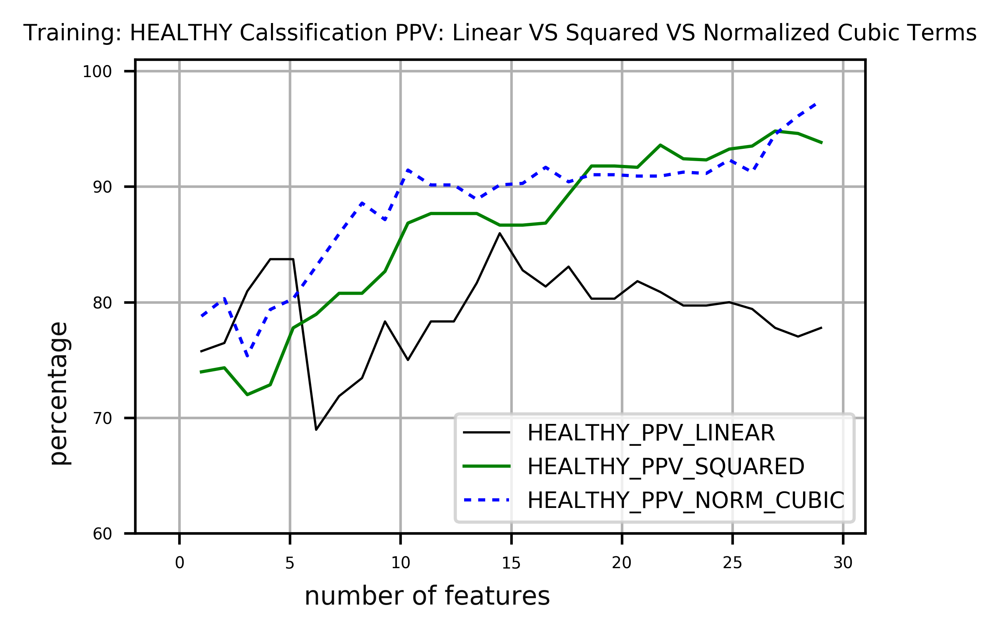

In [827]:
plotLC3(ppvarr[3:-1,0]*100, ppvsqarr[3:-1,0]*100, ppvZNcbarr[3:-1,0]*100, \
        "HEALTHY_PPV_LINEAR", "HEALTHY_PPV_SQUARED", "HEALTHY_PPV_NORM_CUBIC", \
        "Training: HEALTHY Calssification PPV: Linear VS Squared VS Normalized Cubic Terms")

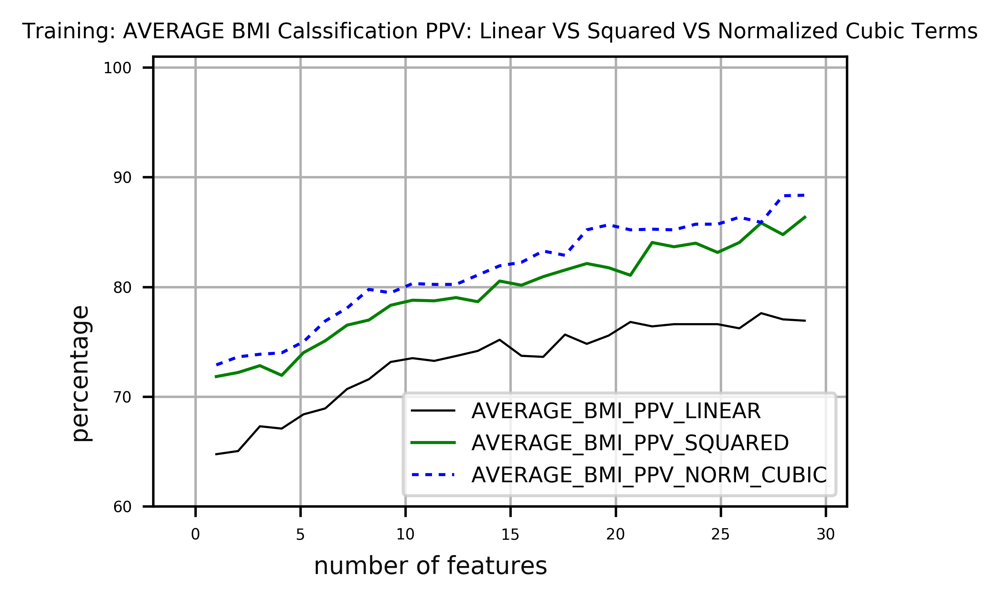

In [917]:
plotLC3(ppvarr[3:-1,1]*100, ppvsqarr[3:-1,1]*100, ppvZNcbarr[3:-1,1]*100, \
        "AVERAGE_BMI_PPV_LINEAR", "AVERAGE_BMI_PPV_SQUARED", "AVERAGE_BMI_PPV_NORM_CUBIC", \
        "Training: AVERAGE BMI Calssification PPV: Linear VS Squared VS Normalized Cubic Terms")

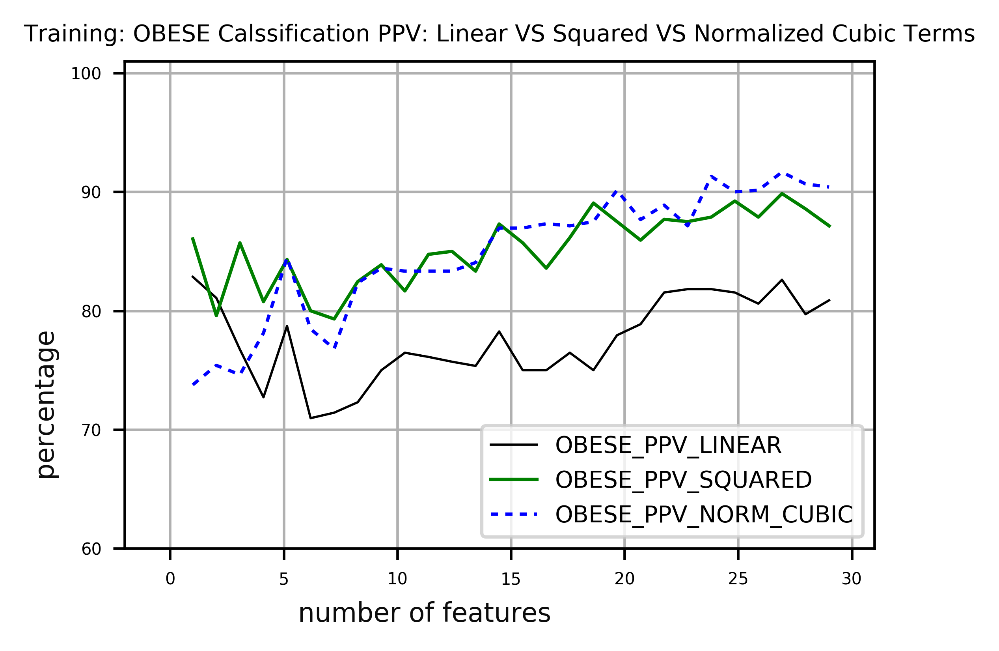

In [829]:
plotLC3(ppvarr[3:-1,2]*100, ppvsqarr[3:-1,2]*100, ppvZNcbarr[3:-1,2]*100, \
        "OBESE_PPV_LINEAR", "OBESE_PPV_SQUARED", "OBESE_PPV_NORM_CUBIC", \
        "Training: OBESE Calssification PPV: Linear VS Squared VS Normalized Cubic Terms")

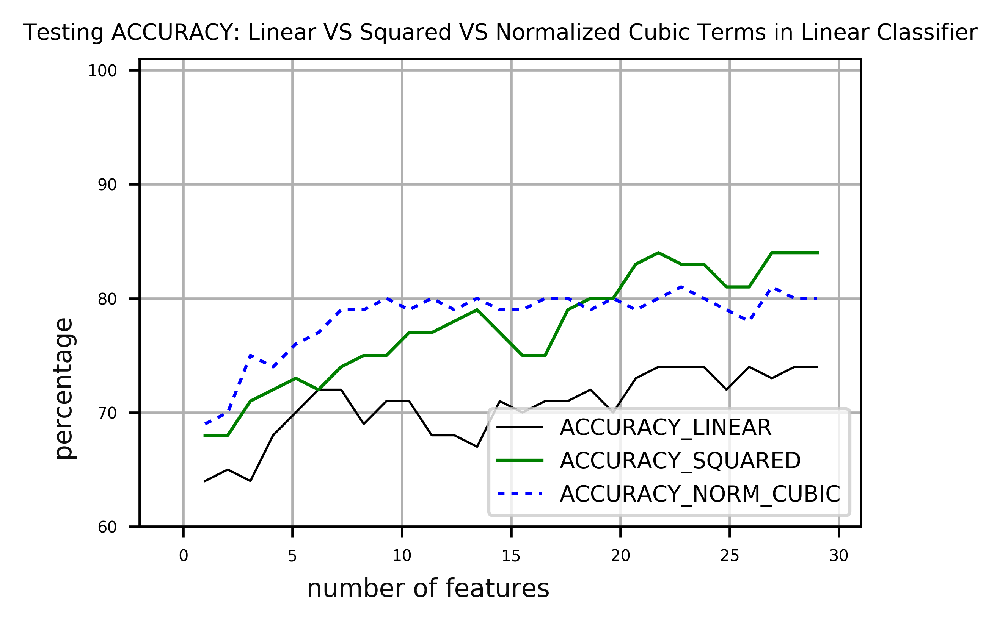

In [830]:
plotLC3(Tacrarr[3:-1]*100, Tacrsqarr[3:-1]*100, TacrZNcbarr[3:-1]*100, \
        "ACCURACY_LINEAR", "ACCURACY_SQUARED", "ACCURACY_NORM_CUBIC", \
        "Testing ACCURACY: Linear VS Squared VS Normalized Cubic Terms in Linear Classifier")

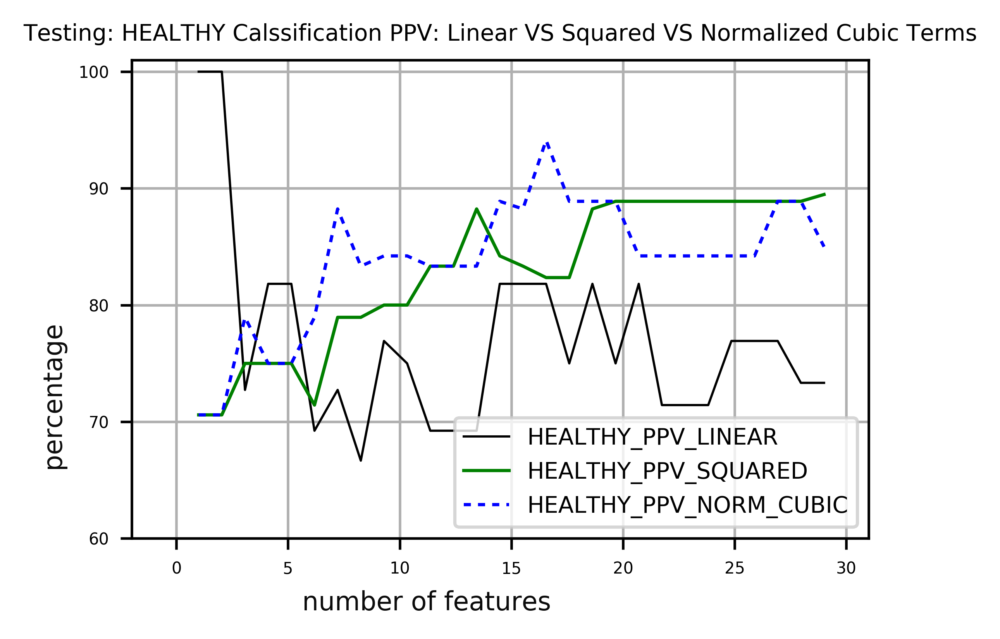

In [831]:
plotLC3(Tppvarr[3:-1,0]*100, Tppvsqarr[3:-1,0]*100, TppvZNcbarr[3:-1,0]*100, \
        "HEALTHY_PPV_LINEAR", "HEALTHY_PPV_SQUARED", "HEALTHY_PPV_NORM_CUBIC", \
        "Testing: HEALTHY Calssification PPV: Linear VS Squared VS Normalized Cubic Terms")

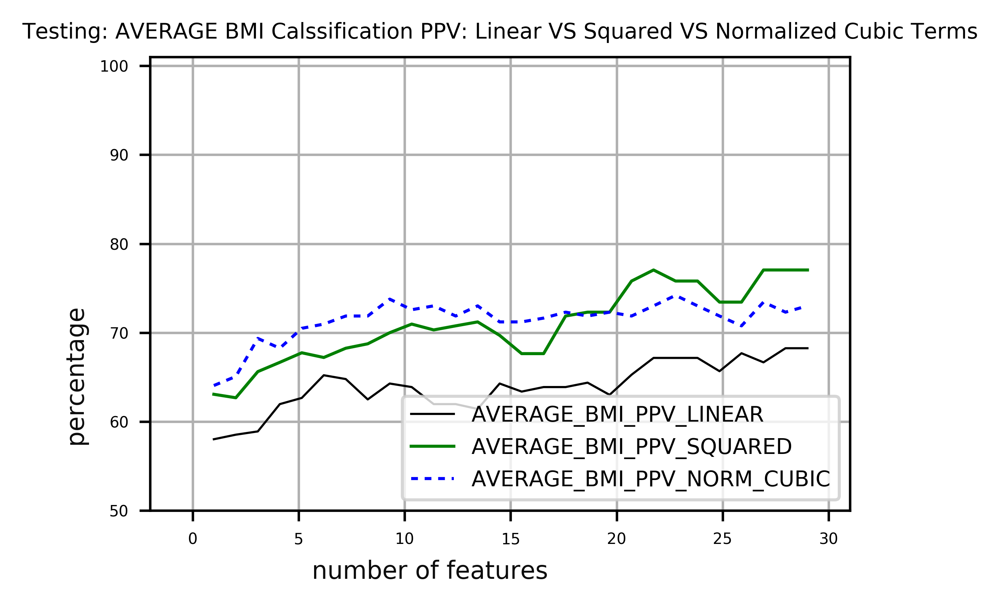

In [922]:
plotLC3(Tppvarr[3:-1,1]*100, Tppvsqarr[3:-1,1]*100, TppvZNcbarr[3:-1,1]*100, \
        "AVERAGE_BMI_PPV_LINEAR", "AVERAGE_BMI_PPV_SQUARED", "AVERAGE_BMI_PPV_NORM_CUBIC", \
        "Testing: AVERAGE BMI Calssification PPV: Linear VS Squared VS Normalized Cubic Terms")

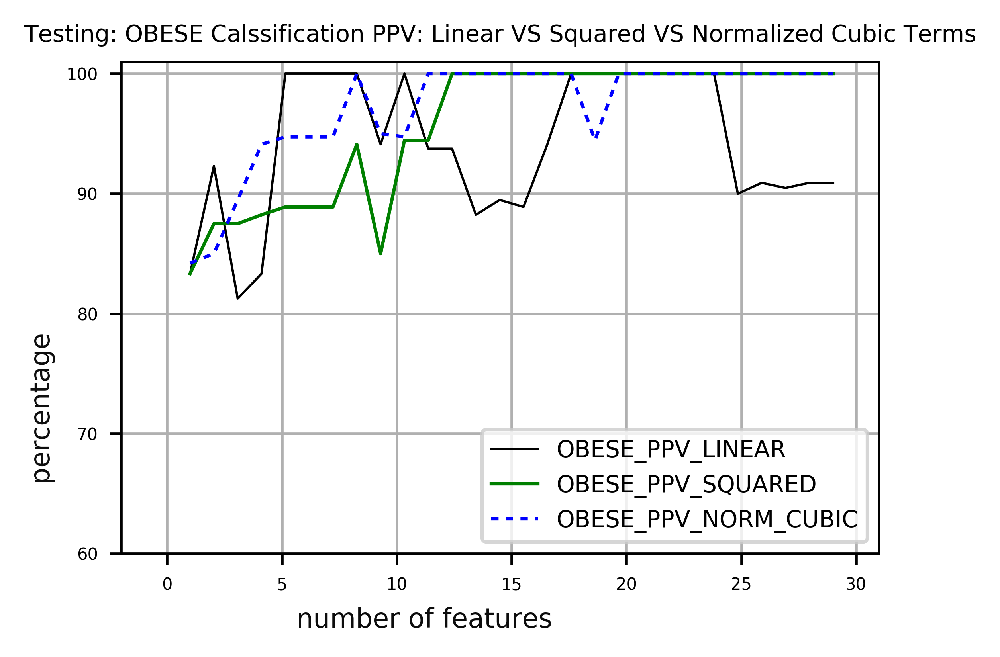

In [833]:
plotLC3(Tppvarr[3:-1,2]*100, Tppvsqarr[3:-1,2]*100, TppvZNcbarr[3:-1,2]*100, \
        "OBESE_PPV_LINEAR", "OBESE_PPV_SQUARED", "OBESE_PPV_NORM_CUBIC", \
        "Testing: OBESE Calssification PPV: Linear VS Squared VS Normalized Cubic Terms")

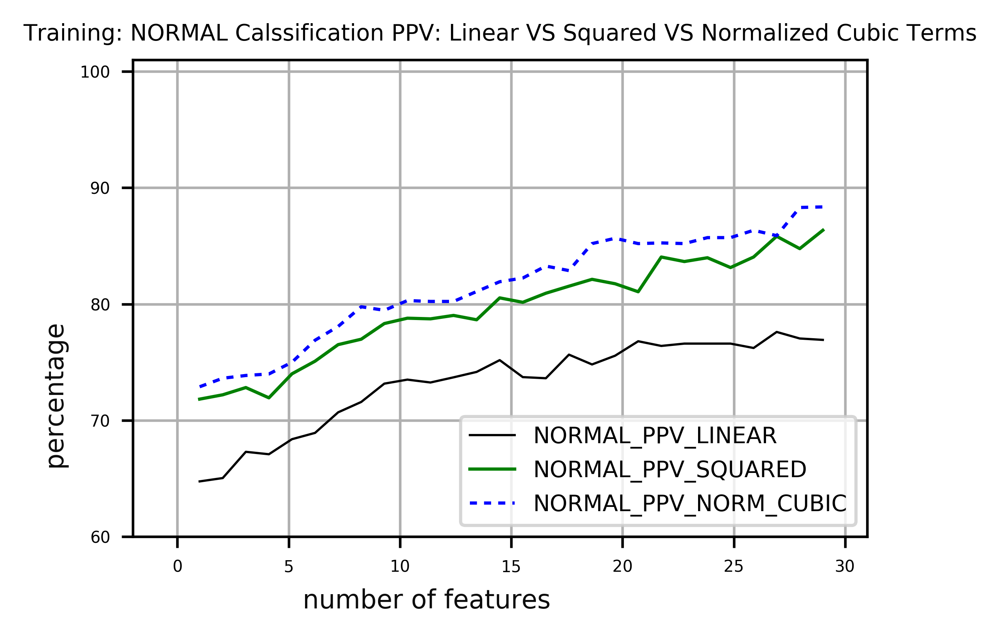

In [834]:
plotLC3(ppvarr[3:-1,1]*100, ppvsqarr[3:-1,1]*100, ppvZNcbarr[3:-1,1]*100, \
        "NORMAL_PPV_LINEAR", "NORMAL_PPV_SQUARED", "NORMAL_PPV_NORM_CUBIC", \
        "Training: NORMAL Calssification PPV: Linear VS Squared VS Normalized Cubic Terms")

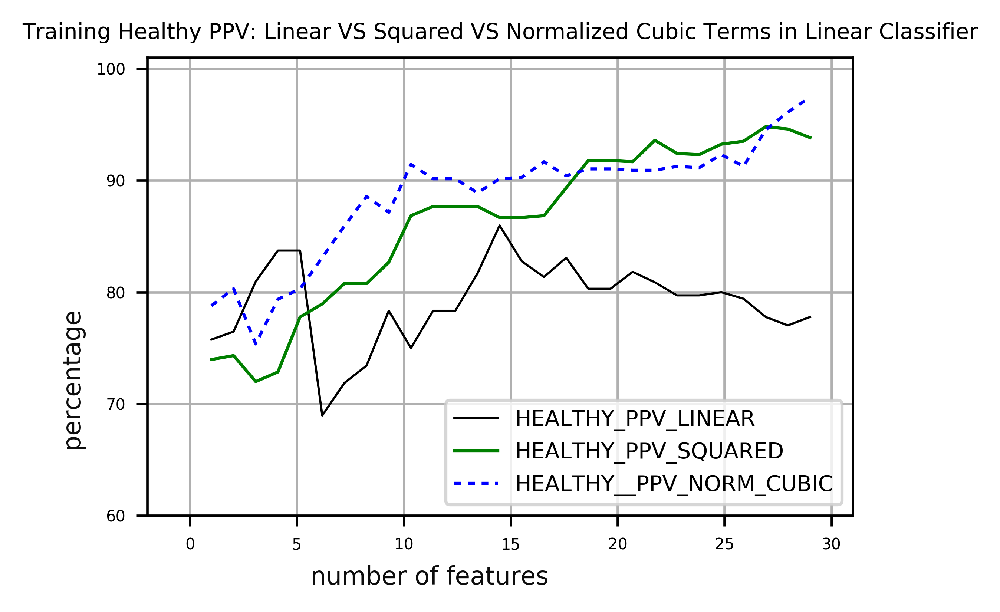

In [835]:
plotLC3(ppvarr[3:-1,0]*100, ppvsqarr[3:-1,0]*100, ppvZNcbarr[3:-1,0]*100, \
        "HEALTHY_PPV_LINEAR", "HEALTHY_PPV_SQUARED", "HEALTHY__PPV_NORM_CUBIC", \
        "Training Healthy PPV: Linear VS Squared VS Normalized Cubic Terms in Linear Classifier")

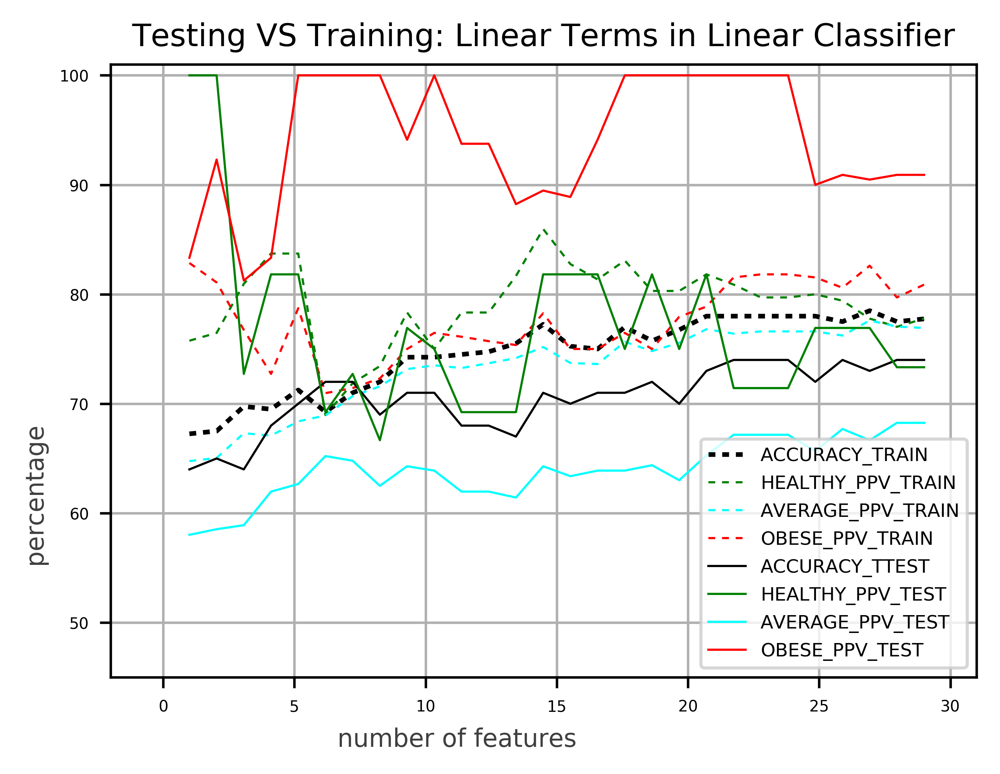

In [934]:
plotLC8b(acrarr[3:-1], ppvarr[3:-1,0], ppvarr[3:-1,1], ppvarr[3:-1,2],Tacrarr[3:-1], Tppvarr[3:-1,0], Tppvarr[3:-1,1], Tppvarr[3:-1,2],\
        "ACCURACY_TRAIN", "HEALTHY_PPV_TRAIN", "AVERAGE_PPV_TRAIN", "OBESE_PPV_TRAIN", \
        "ACCURACY_TTEST", "HEALTHY_PPV_TEST", "AVERAGE_PPV_TEST", "OBESE_PPV_TEST", \
        "Testing VS Training: Linear Terms in Linear Classifier")

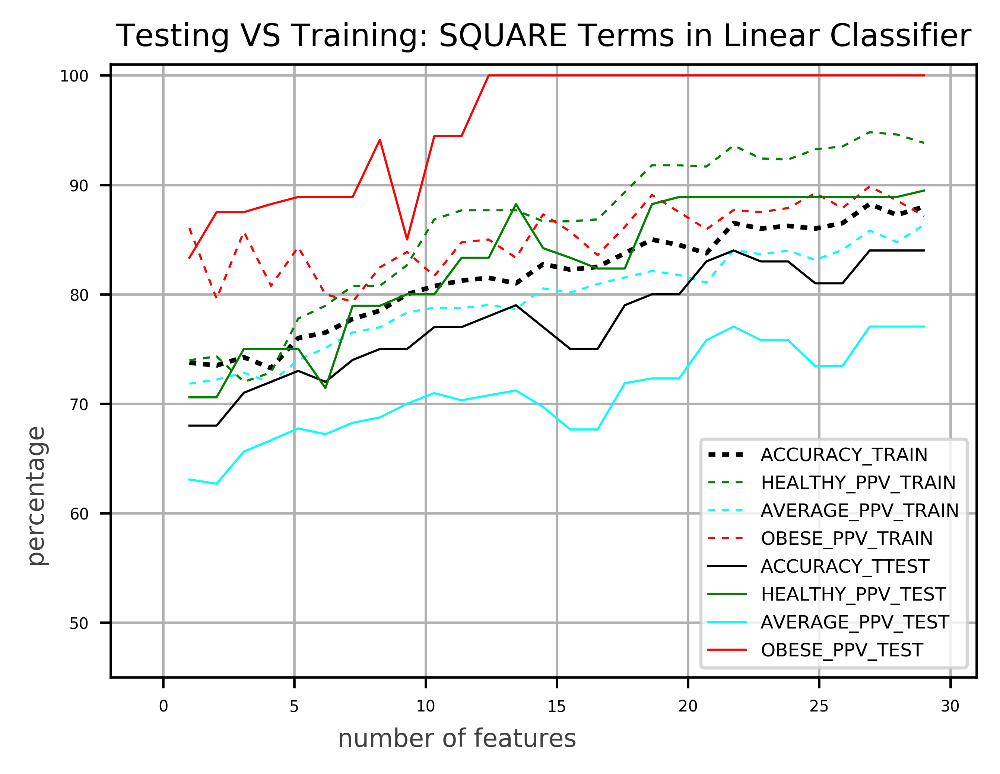

In [928]:
plotLC8b(acrsqarr[3:-1], ppvsqarr[3:-1,0], ppvsqarr[3:-1,1], ppvsqarr[3:-1,2],Tacrsqarr[3:-1], Tppvsqarr[3:-1,0], Tppvsqarr[3:-1,1], Tppvsqarr[3:-1,2],\
        "ACCURACY_TRAIN", "HEALTHY_PPV_TRAIN", "AVERAGE_PPV_TRAIN", "OBESE_PPV_TRAIN", \
        "ACCURACY_TTEST", "HEALTHY_PPV_TEST", "AVERAGE_PPV_TEST", "OBESE_PPV_TEST", \
        "Testing VS Training: SQUARE Terms in Linear Classifier")

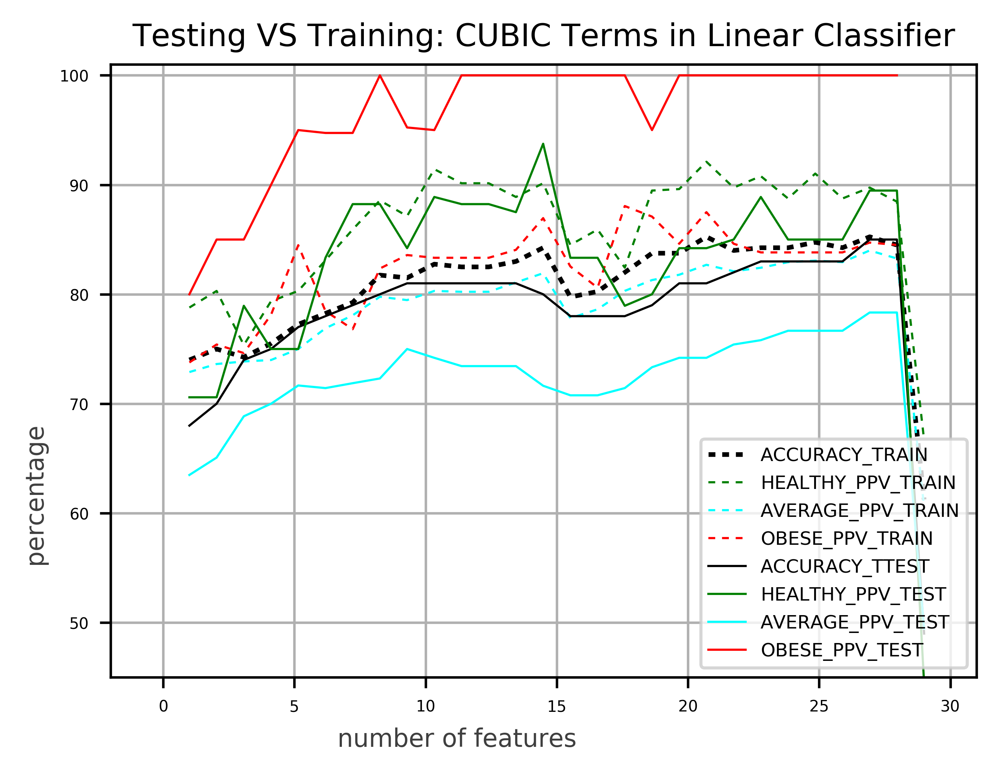

In [929]:
plotLC8b(acrcbarr[3:-1], ppvcbarr[3:-1,0], ppvcbarr[3:-1,1], ppvcbarr[3:-1,2],Tacrcbarr[3:-1], Tppvcbarr[3:-1,0], \
         Tppvcbarr[3:-1,1], Tppvcbarr[3:-1,2],\
        "ACCURACY_TRAIN", "HEALTHY_PPV_TRAIN", "AVERAGE_PPV_TRAIN", "OBESE_PPV_TRAIN", \
        "ACCURACY_TTEST", "HEALTHY_PPV_TEST", "AVERAGE_PPV_TEST", "OBESE_PPV_TEST", \
        "Testing VS Training: CUBIC Terms in Linear Classifier")

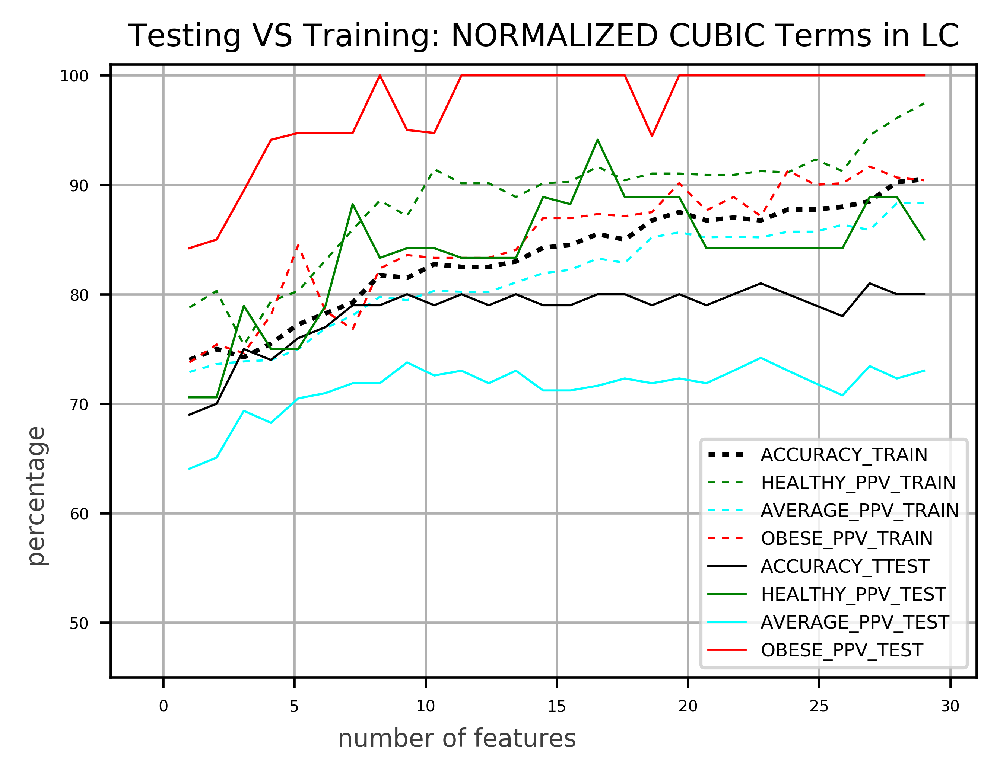

In [935]:
plotLC8b(acrZNcbarr[3:-1], ppvZNcbarr[3:-1,0], ppvZNcbarr[3:-1,1], ppvZNcbarr[3:-1,2],TacrZNcbarr[3:-1], TppvZNcbarr[3:-1,0], \
         TppvZNcbarr[3:-1,1], TppvZNcbarr[3:-1,2],\
        "ACCURACY_TRAIN", "HEALTHY_PPV_TRAIN", "AVERAGE_PPV_TRAIN", "OBESE_PPV_TRAIN", \
        "ACCURACY_TTEST", "HEALTHY_PPV_TEST", "AVERAGE_PPV_TEST", "OBESE_PPV_TEST", \
        "Testing VS Training: NORMALIZED CUBIC Terms in LC")

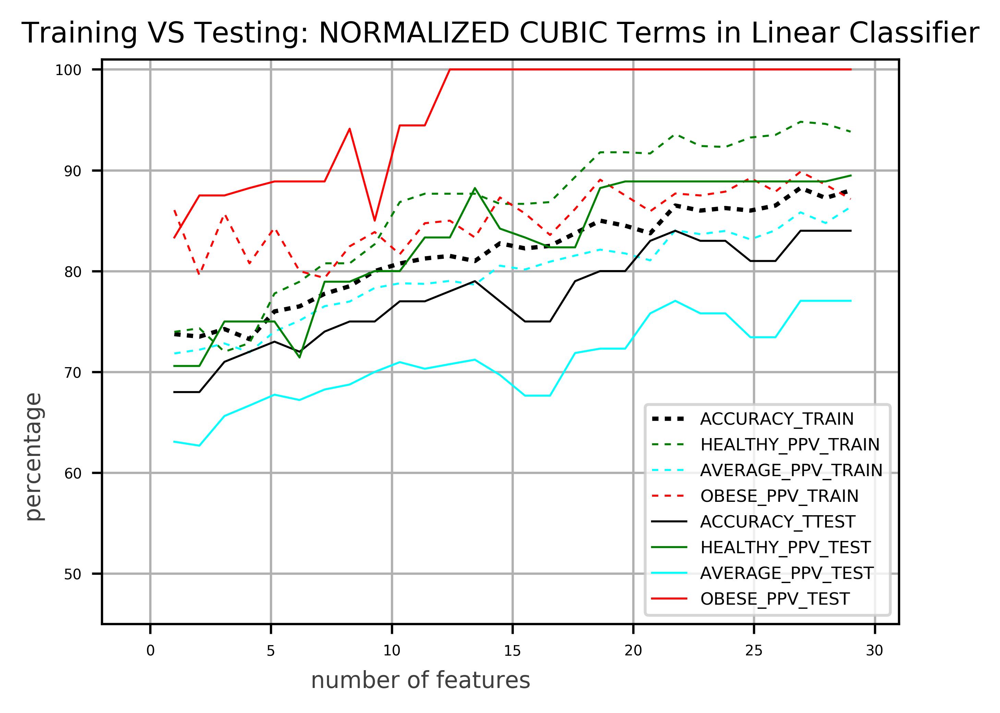

In [932]:
plotLC8b(acrsqarr[3:-1], ppvsqarr[3:-1,0], ppvsqarr[3:-1,1], ppvsqarr[3:-1,2],Tacrsqarr[3:-1], Tppvsqarr[3:-1,0], Tppvsqarr[3:-1,1], Tppvsqarr[3:-1,2],\
        "ACCURACY_TRAIN", "HEALTHY_PPV_TRAIN", "AVERAGE_PPV_TRAIN", "OBESE_PPV_TRAIN", \
        "ACCURACY_TTEST", "HEALTHY_PPV_TEST", "AVERAGE_PPV_TEST", "OBESE_PPV_TEST", \
        "Training VS Testing: NORMALIZED CUBIC Terms in Linear Classifier")

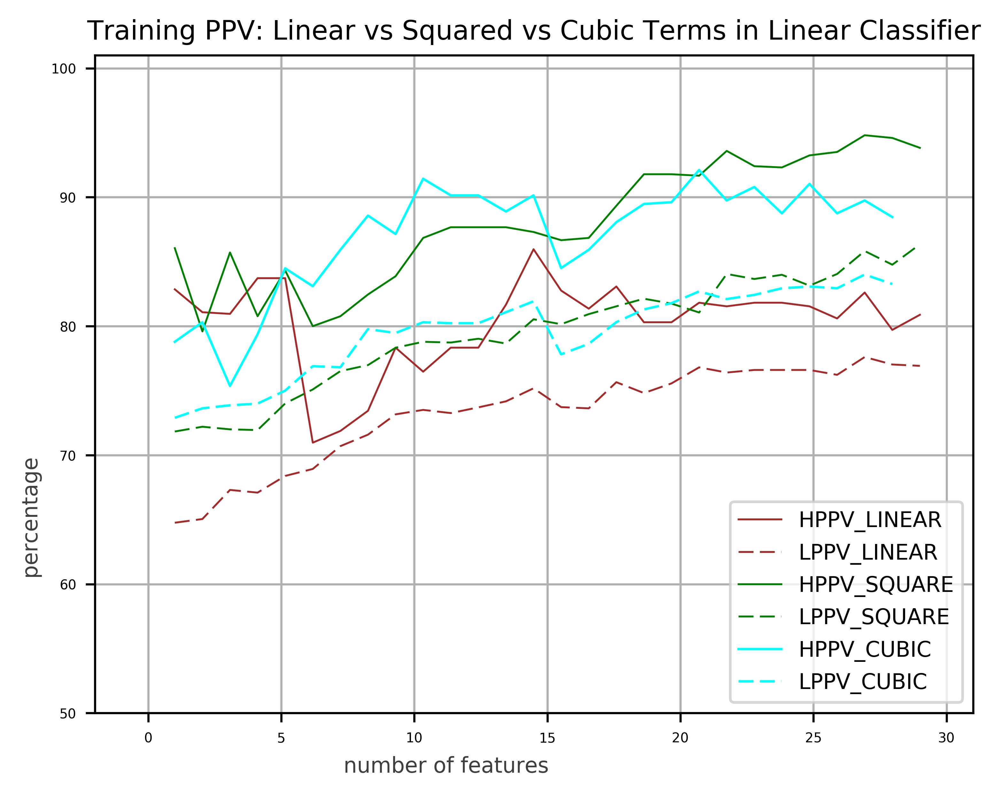

In [933]:
plotLC6(hppvarr[3:-1], lppvarr[3:-1], hppvsqarr[3:-1], lppvsqarr[3:-1], hppvcbarr[3:-1], lppvcbarr[3:-1], \
        "HPPV_LINEAR", "LPPV_LINEAR", "HPPV_SQUARE", "LPPV_SQUARE", "HPPV_CUBIC", "LPPV_CUBIC", \
        "Training PPV: Linear vs Squared vs Cubic Terms in Linear Classifier")

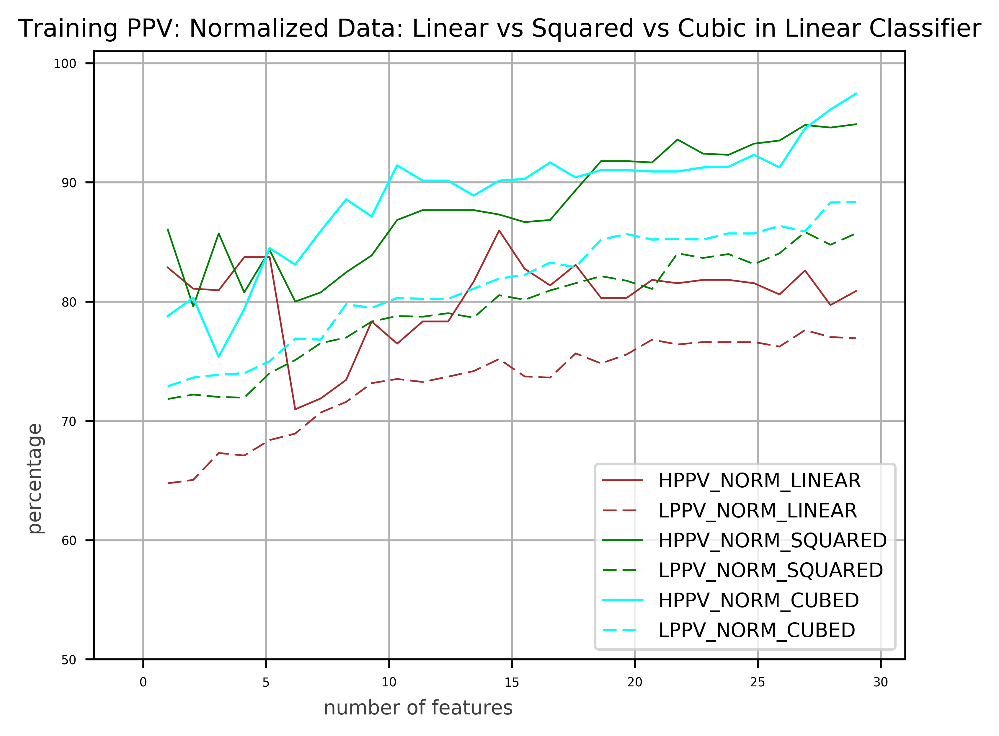

In [842]:
plotLC6(hppvZNarr[3:-1], lppvZNarr[3:-1], hppvZNsqarr[3:-1], lppvZNsqarr[3:-1], hppvZNcbarr[3:-1], lppvZNcbarr[3:-1], \
        "HPPV_NORM_LINEAR", "LPPV_NORM_LINEAR", "HPPV_NORM_SQUARED", "LPPV_NORM_SQUARED", "HPPV_NORM_CUBED", \
        "LPPV_NORM_CUBED", "Training PPV: Normalized Data: Linear vs Squared vs Cubic in Linear Classifier")

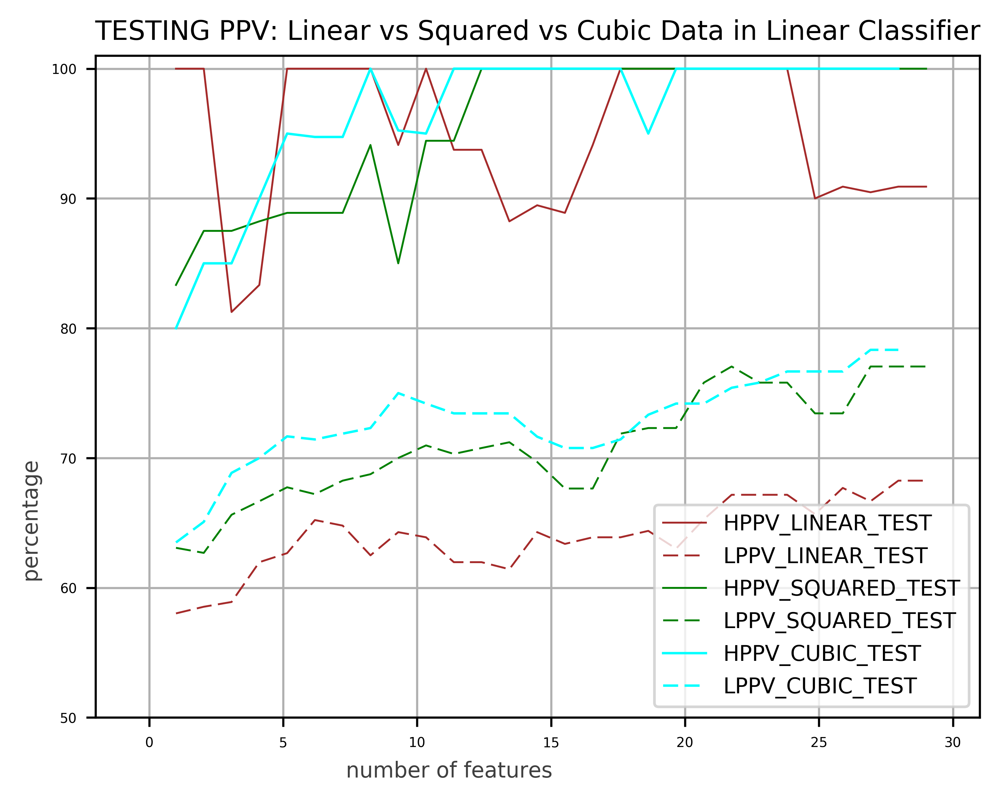

In [843]:
plotLC6(Thppvarr[3:-1], Tlppvarr[3:-1], Thppvsqarr[3:-1], Tlppvsqarr[3:-1], Thppvcbarr[3:-1], Tlppvcbarr[3:-1], \
        "HPPV_LINEAR_TEST", "LPPV_LINEAR_TEST", \
        "HPPV_SQUARED_TEST", "LPPV_SQUARED_TEST", "HPPV_CUBIC_TEST", "LPPV_CUBIC_TEST", \
        "TESTING PPV: Linear vs Squared vs Cubic Data in Linear Classifier")

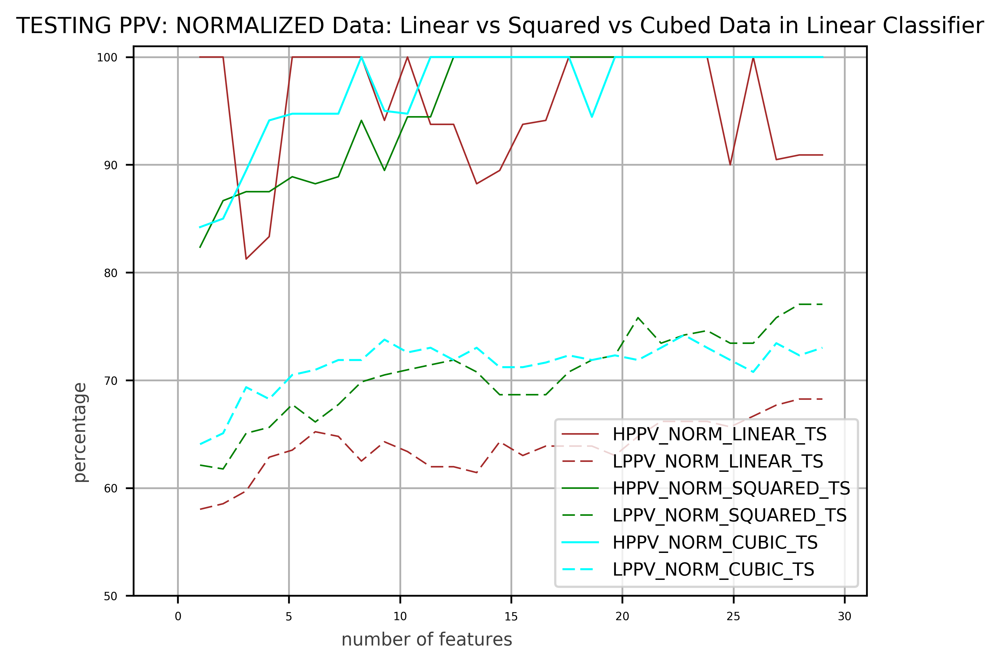

In [844]:
plotLC6(ThppvZNarr[3:-1], TlppvZNarr[3:-1], ThppvZNsqarr[3:-1], TlppvZNsqarr[3:-1], ThppvZNcbarr[3:-1], TlppvZNcbarr[3:-1], \
        "HPPV_NORM_LINEAR_TS", "LPPV_NORM_LINEAR_TS",\
        "HPPV_NORM_SQUARED_TS", "LPPV_NORM_SQUARED_TS", "HPPV_NORM_CUBIC_TS", "LPPV_NORM_CUBIC_TS", \
        "TESTING PPV: NORMALIZED Data: Linear vs Squared vs Cubed Data in Linear Classifier")

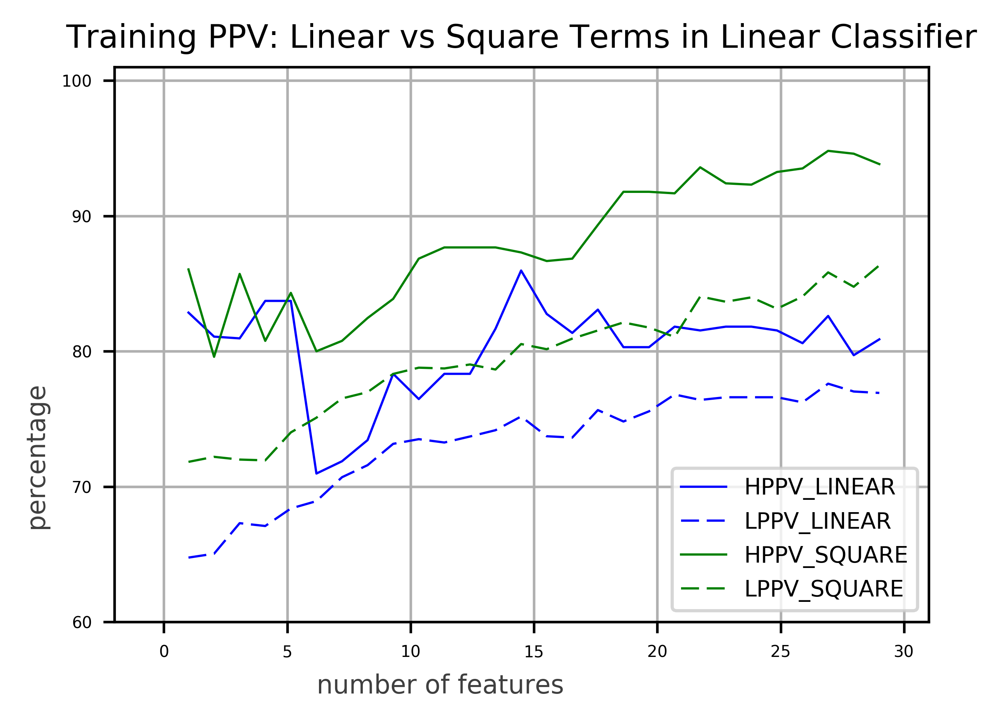

In [845]:
plotLC4(hppvarr[3:-1], lppvarr[3:-1], hppvsqarr[3:-1], lppvsqarr[3:-1], "HPPV_LINEAR", "LPPV_LINEAR", "HPPV_SQUARE",\
        "LPPV_SQUARE", "Training PPV: Linear vs Square Terms in Linear Classifier")

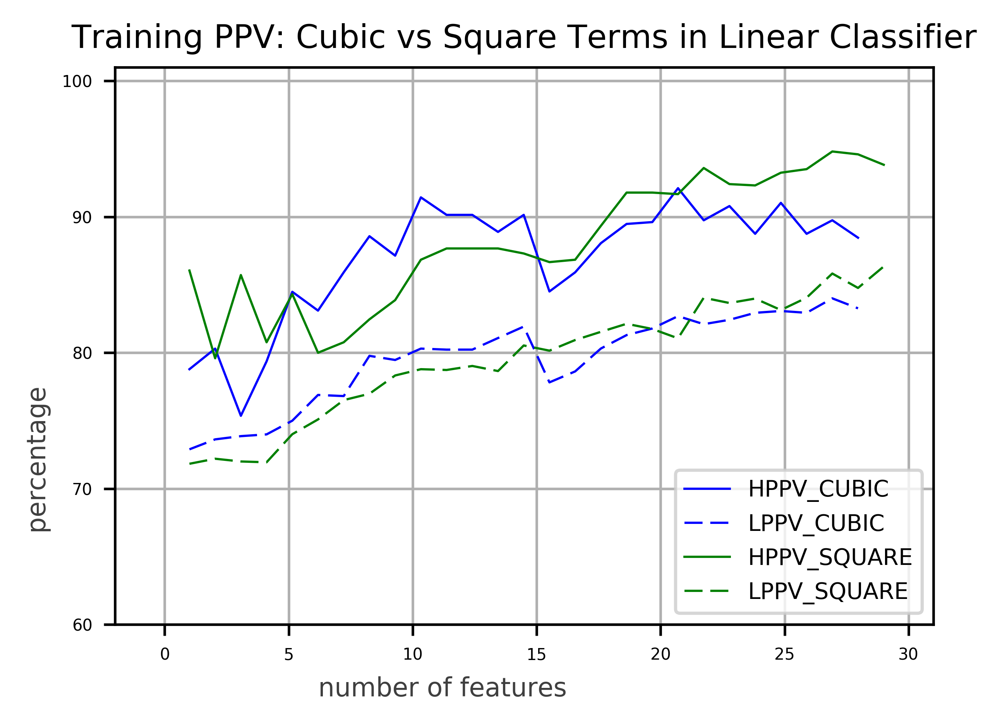

In [846]:
plotLC4(hppvcbarr[3:-1], lppvcbarr[3:-1], hppvsqarr[3:-1], lppvsqarr[3:-1], "HPPV_CUBIC", "LPPV_CUBIC", \
        "HPPV_SQUARE", "LPPV_SQUARE", "Training PPV: Cubic vs Square Terms in Linear Classifier")

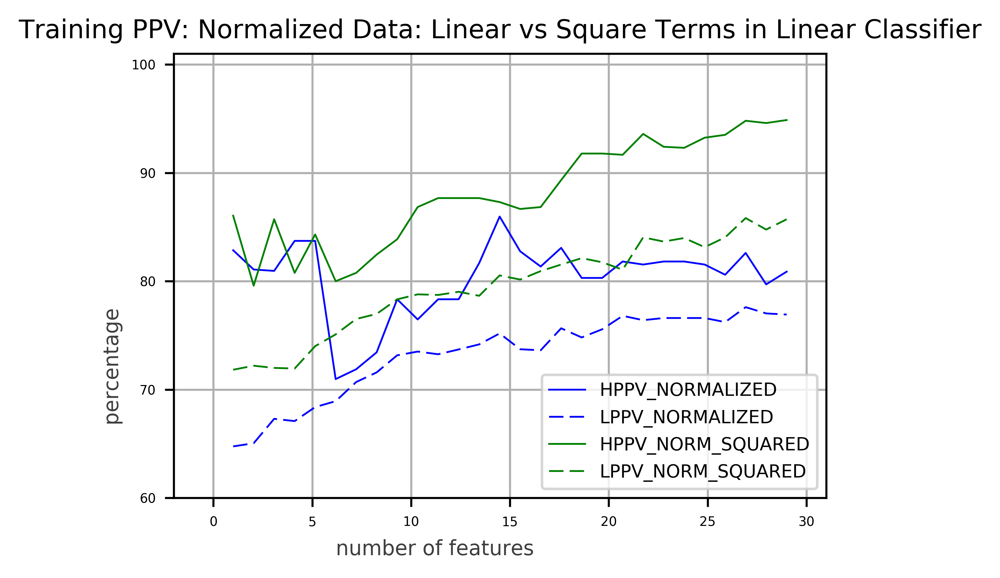

In [847]:
plotLC4(hppvZNarr[3:-1], lppvZNarr[3:-1], hppvZNsqarr[3:-1], lppvZNsqarr[3:-1], "HPPV_NORMALIZED", "LPPV_NORMALIZED", "HPPV_NORM_SQUARED", \
        "LPPV_NORM_SQUARED", "Training PPV: Normalized Data: Linear vs Square Terms in Linear Classifier")

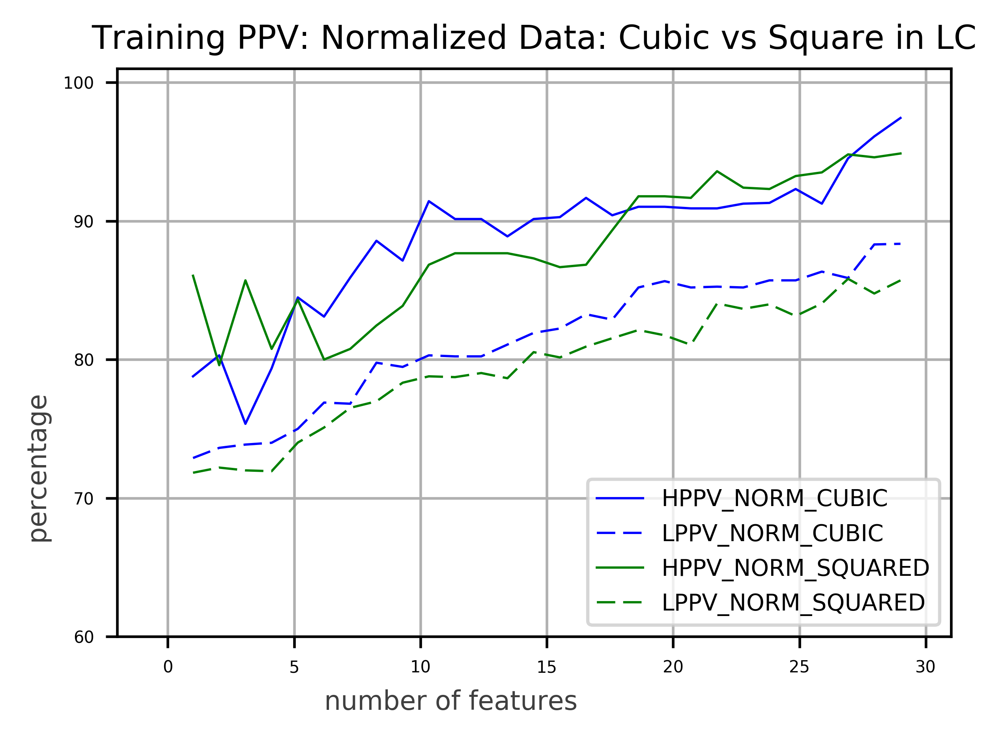

In [848]:
plotLC4(hppvZNcbarr[3:-1], lppvZNcbarr[3:-1], hppvZNsqarr[3:-1], lppvZNsqarr[3:-1], "HPPV_NORM_CUBIC", "LPPV_NORM_CUBIC", \
        "HPPV_NORM_SQUARED", "LPPV_NORM_SQUARED", "Training PPV: Normalized Data: Cubic vs Square in LC")

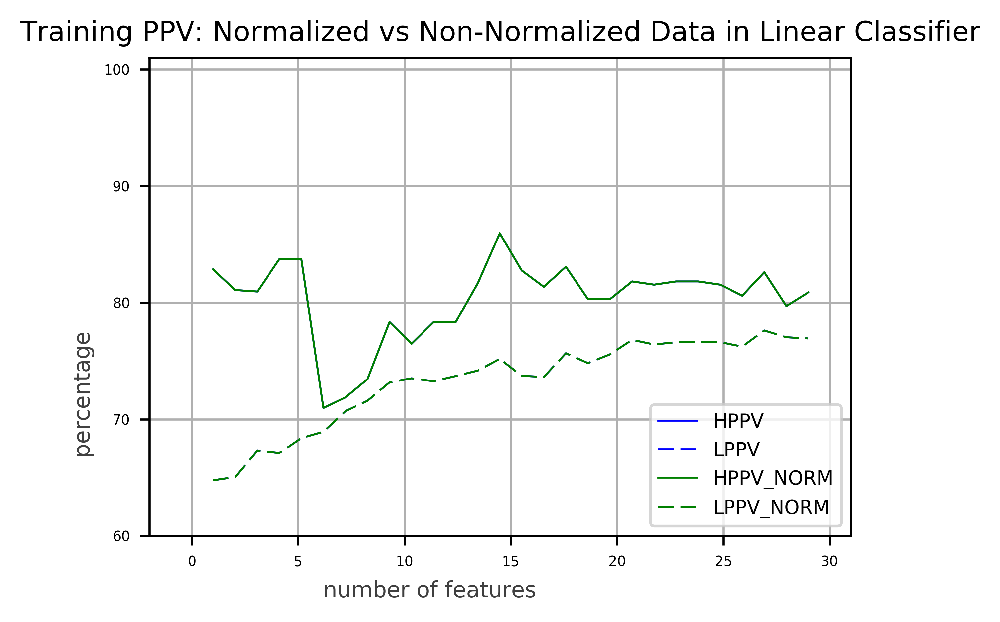

In [849]:
plotLC4(hppvarr[3:-1], lppvarr[3:-1], hppvZNarr[3:-1], lppvZNarr[3:-1], "HPPV", "LPPV", "HPPV_NORM", \
        "LPPV_NORM", "Training PPV: Normalized vs Non-Normalized Data in Linear Classifier")

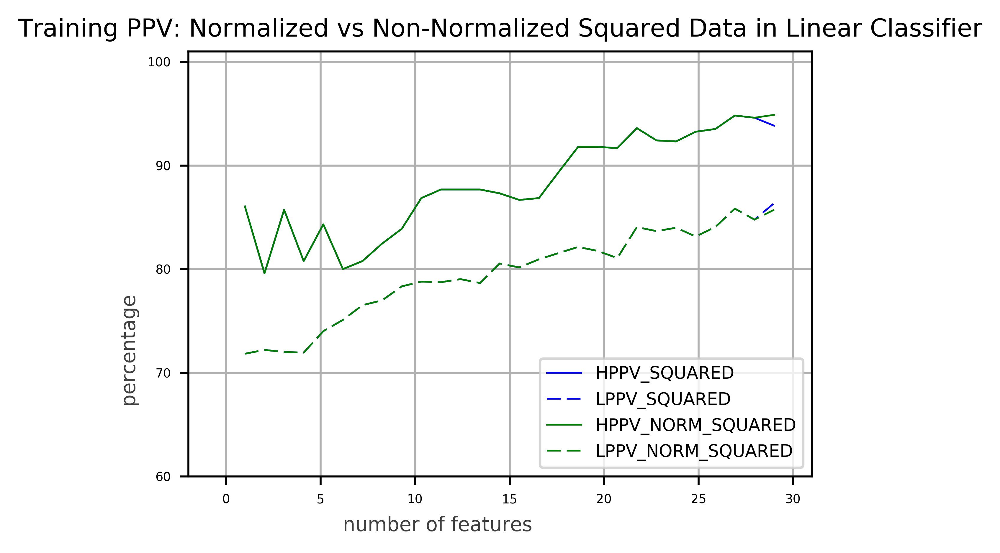

In [850]:
plotLC4(hppvsqarr[3:-1], lppvsqarr[3:-1], hppvZNsqarr[3:-1], lppvZNsqarr[3:-1], "HPPV_SQUARED", "LPPV_SQUARED", "HPPV_NORM_SQUARED", \
        "LPPV_NORM_SQUARED", "Training PPV: Normalized vs Non-Normalized Squared Data in Linear Classifier")

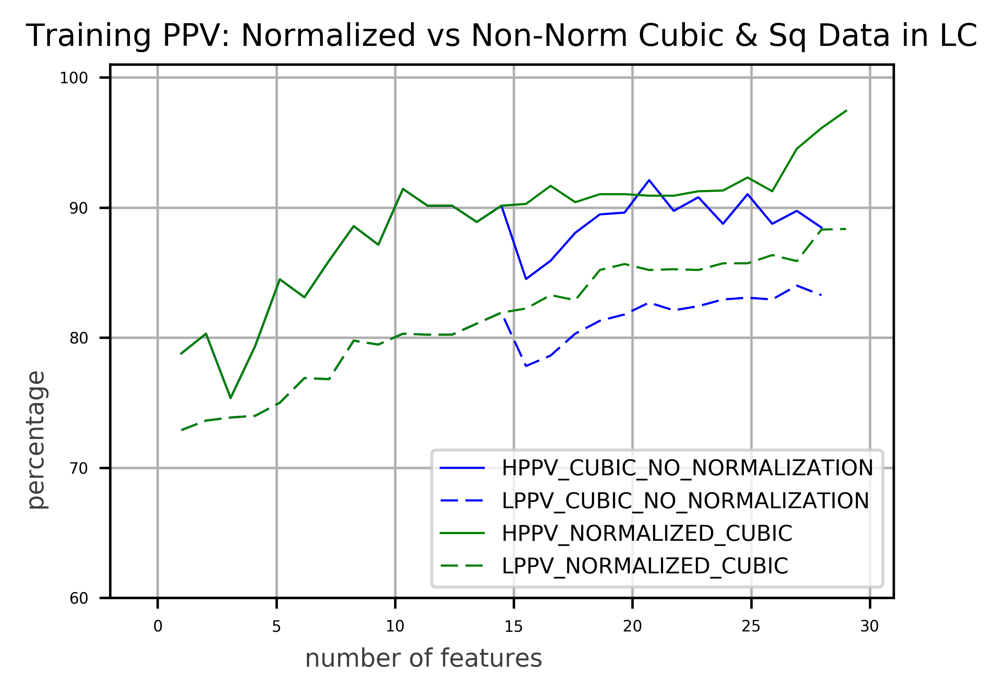

In [937]:
plotLC4(hppvcbarr[3:-1], lppvcbarr[3:-1], hppvZNcbarr[3:-1], lppvZNcbarr[3:-1], "HPPV_CUBIC_NO_NORMALIZATION", \
        "LPPV_CUBIC_NO_NORMALIZATION", "HPPV_NORMALIZED_CUBIC", \
        "LPPV_NORMALIZED_CUBIC", "Training PPV: Normalized vs Non-Norm Cubic & Sq Data in LC")

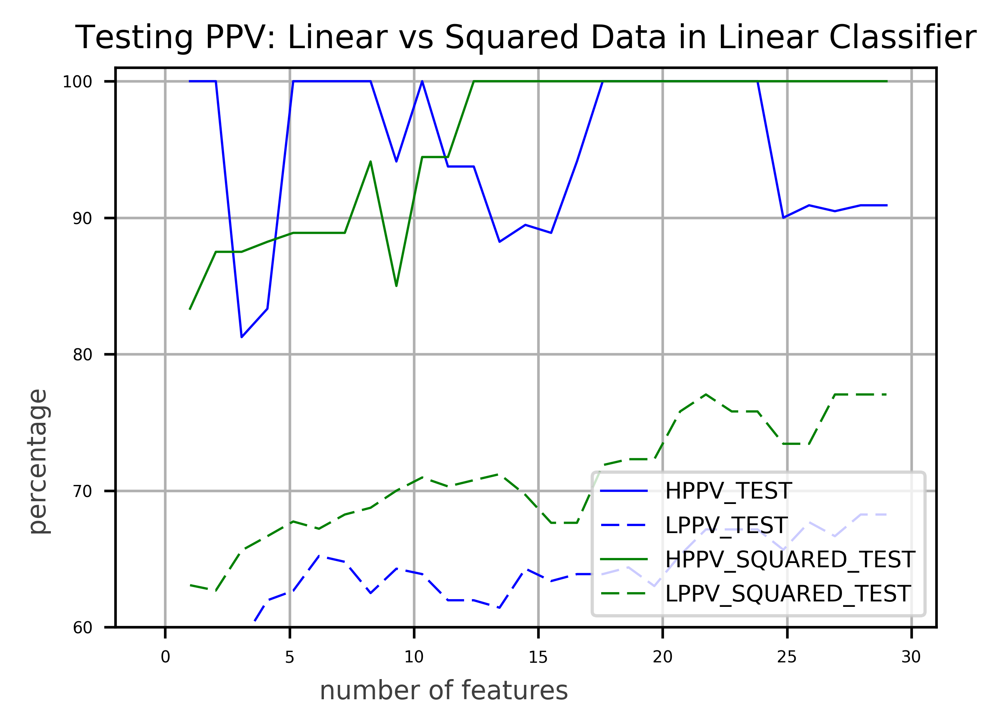

In [852]:
plotLC4(Thppvarr[3:-1], Tlppvarr[3:-1], Thppvsqarr[3:-1], Tlppvsqarr[3:-1], "HPPV_TEST", "LPPV_TEST", \
        "HPPV_SQUARED_TEST", "LPPV_SQUARED_TEST", "Testing PPV: Linear vs Squared Data in Linear Classifier")

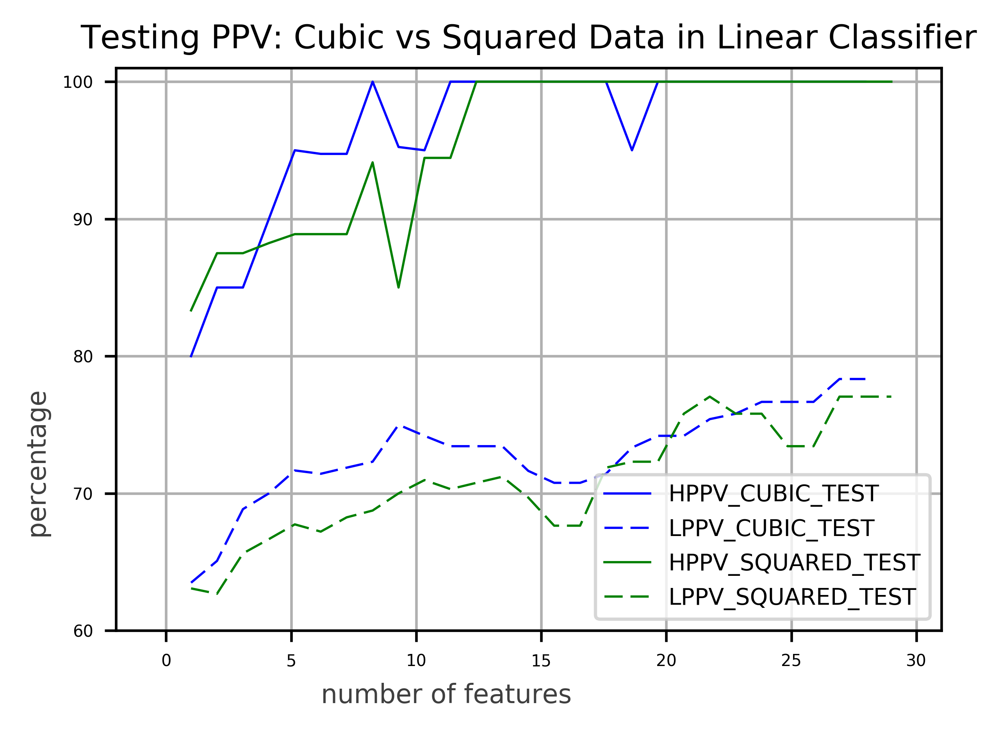

In [853]:
plotLC4(Thppvcbarr[3:-1], Tlppvcbarr[3:-1], Thppvsqarr[3:-1], Tlppvsqarr[3:-1], "HPPV_CUBIC_TEST", "LPPV_CUBIC_TEST", \
        "HPPV_SQUARED_TEST", "LPPV_SQUARED_TEST", "Testing PPV: Cubic vs Squared Data in Linear Classifier")

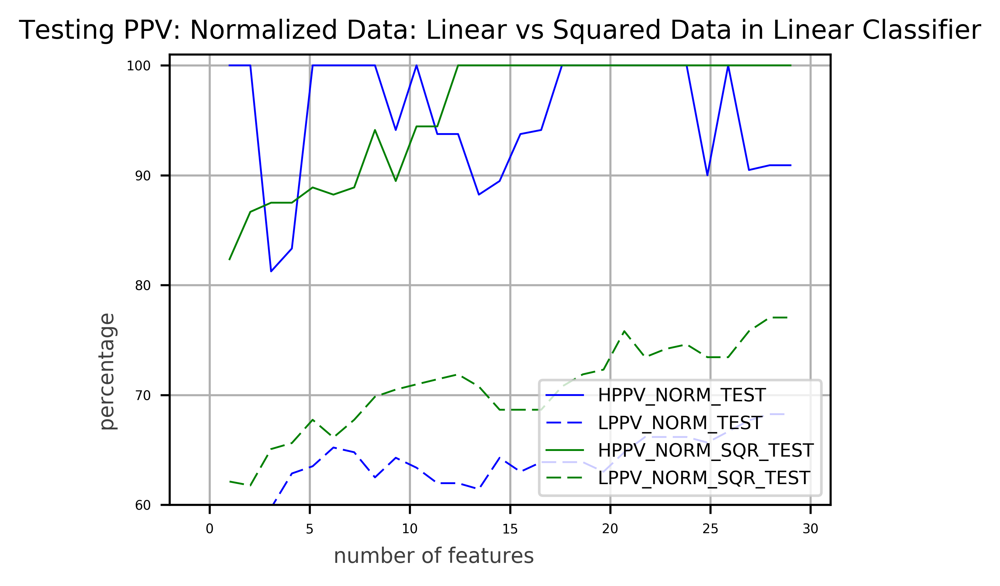

In [854]:
plotLC4(ThppvZNarr[3:-1], TlppvZNarr[3:-1], ThppvZNsqarr[3:-1], TlppvZNsqarr[3:-1], "HPPV_NORM_TEST", "LPPV_NORM_TEST", \
        "HPPV_NORM_SQR_TEST", "LPPV_NORM_SQR_TEST", "Testing PPV: Normalized Data: Linear vs Squared Data in Linear Classifier")

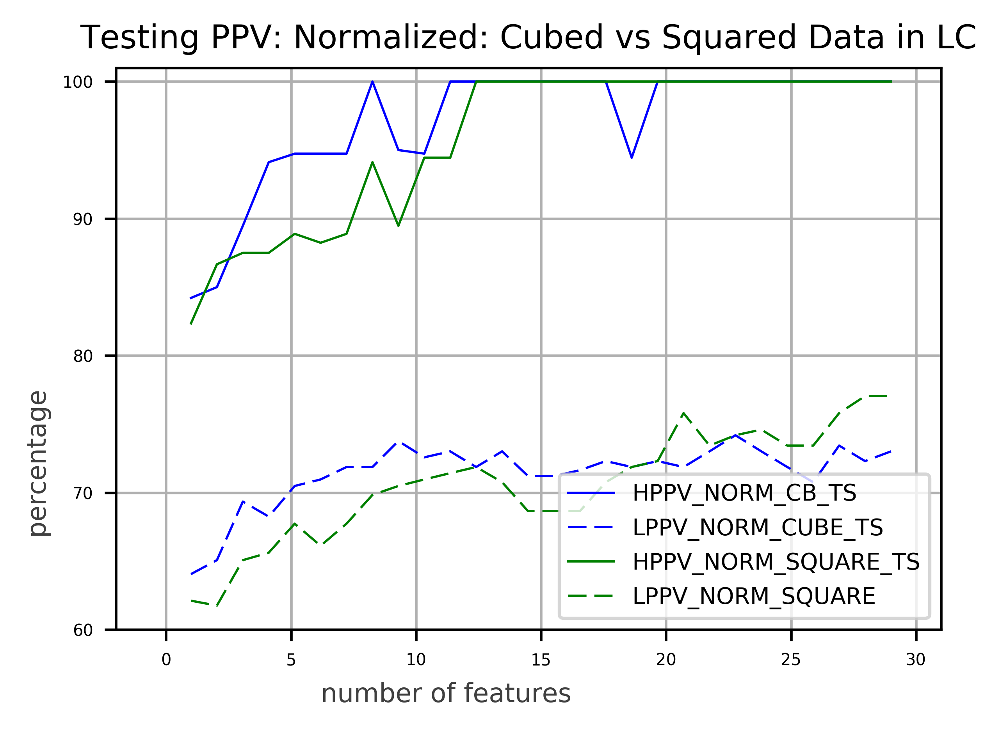

In [855]:
plotLC4(ThppvZNcbarr[3:-1], TlppvZNcbarr[3:-1], ThppvZNsqarr[3:-1], TlppvZNsqarr[3:-1], "HPPV_NORM_CB_TS", "LPPV_NORM_CUBE_TS",\
        "HPPV_NORM_SQUARE_TS", "LPPV_NORM_SQUARE", "Testing PPV: Normalized: Cubed vs Squared Data in LC")

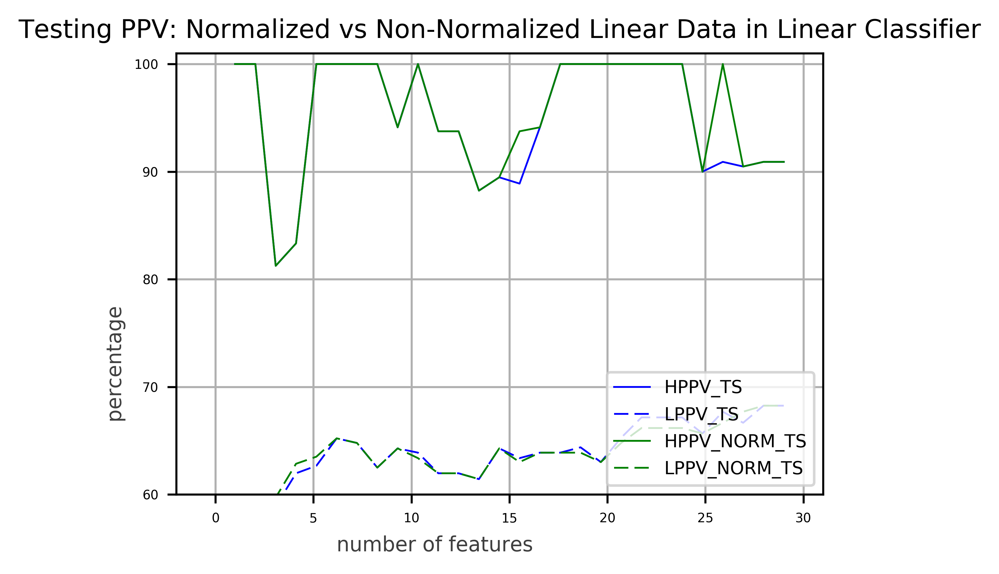

In [856]:
plotLC4(Thppvarr[3:-1], Tlppvarr[3:-1], ThppvZNarr[3:-1], TlppvZNarr[3:-1], "HPPV_TS", "LPPV_TS", \
        "HPPV_NORM_TS", "LPPV_NORM_TS", "Testing PPV: Normalized vs Non-Normalized Linear Data in Linear Classifier")

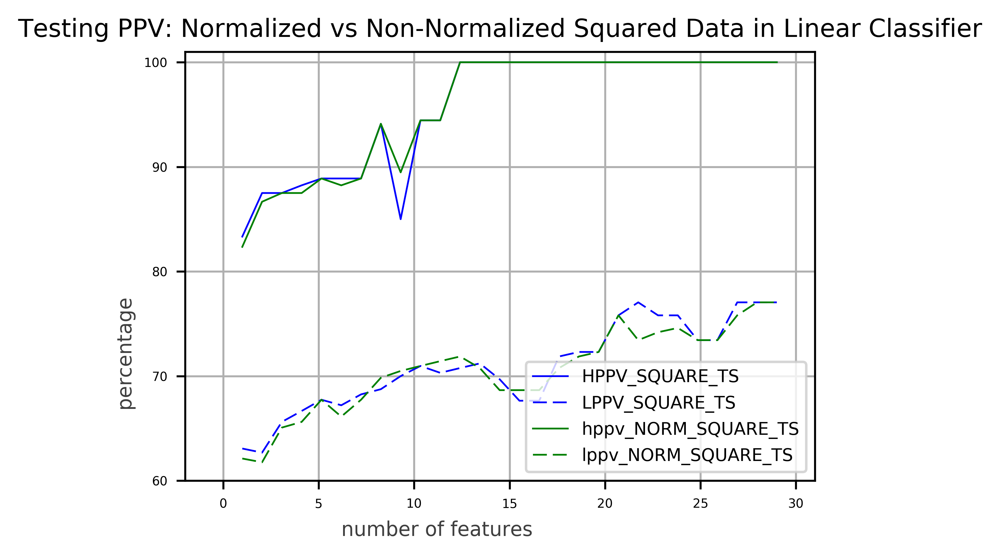

In [857]:
plotLC4(Thppvsqarr[3:-1], Tlppvsqarr[3:-1], ThppvZNsqarr[3:-1], TlppvZNsqarr[3:-1], "HPPV_SQUARE_TS", "LPPV_SQUARE_TS", \
        "hppv_NORM_SQUARE_TS", "lppv_NORM_SQUARE_TS", "Testing PPV: Normalized vs Non-Normalized Squared Data in Linear Classifier")

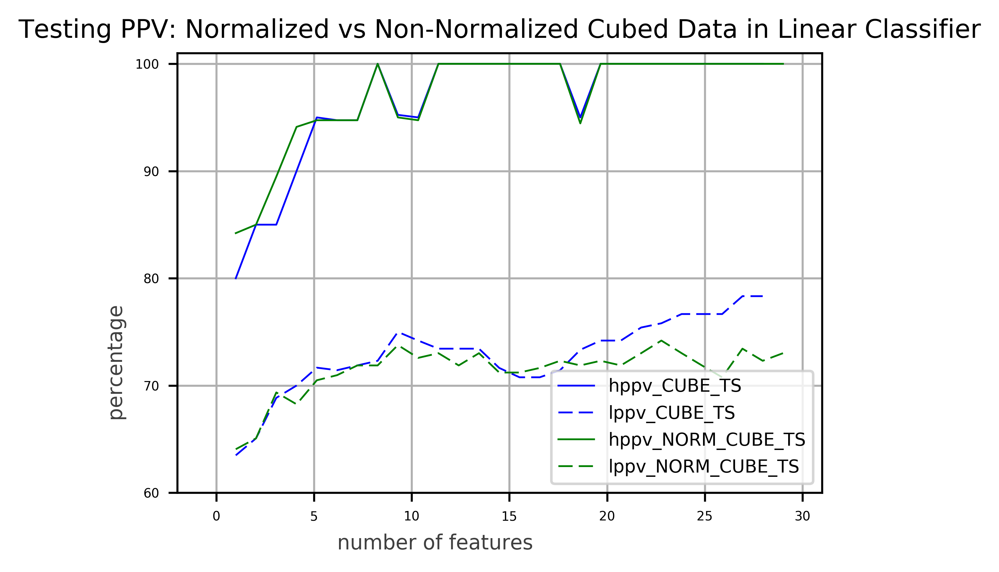

In [858]:
plotLC4(Thppvcbarr[3:-1], Tlppvcbarr[3:-1], ThppvZNcbarr[3:-1], TlppvZNcbarr[3:-1], "hppv_CUBE_TS", "lppv_CUBE_TS", \
        "hppv_NORM_CUBE_TS", "lppv_NORM_CUBE_TS", "Testing PPV: Normalized vs Non-Normalized Cubed Data in Linear Classifier")

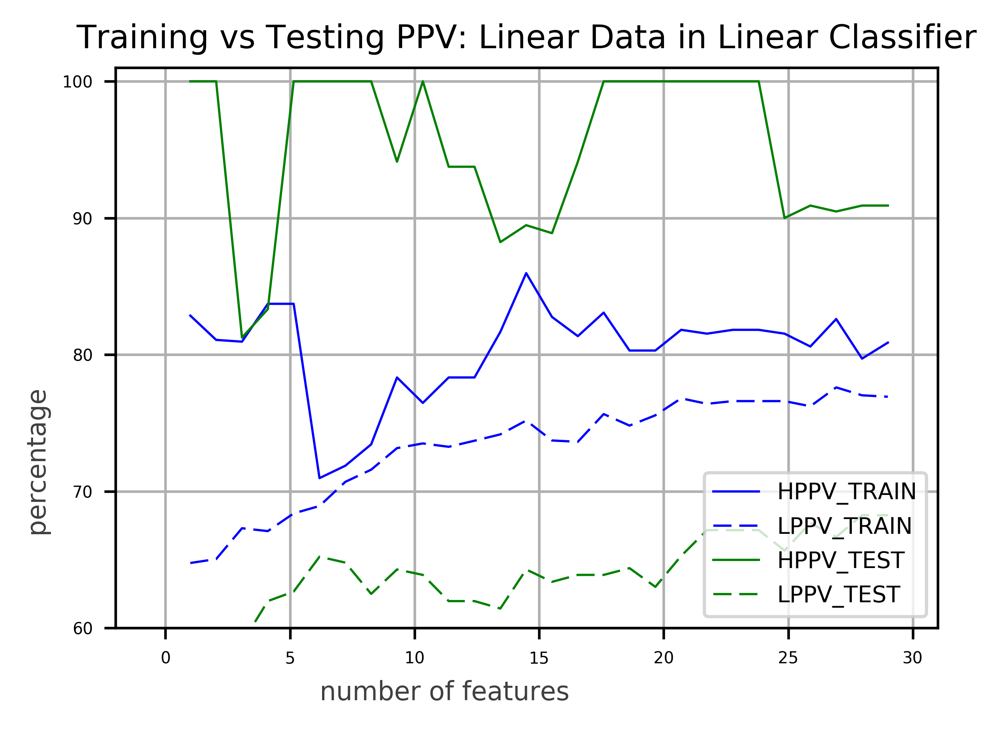

In [859]:
plotLC4(hppvarr[3:-1], lppvarr[3:-1], Thppvarr[3:-1], Tlppvarr[3:-1], "HPPV_TRAIN", "LPPV_TRAIN", "HPPV_TEST", "LPPV_TEST", \
        "Training vs Testing PPV: Linear Data in Linear Classifier")

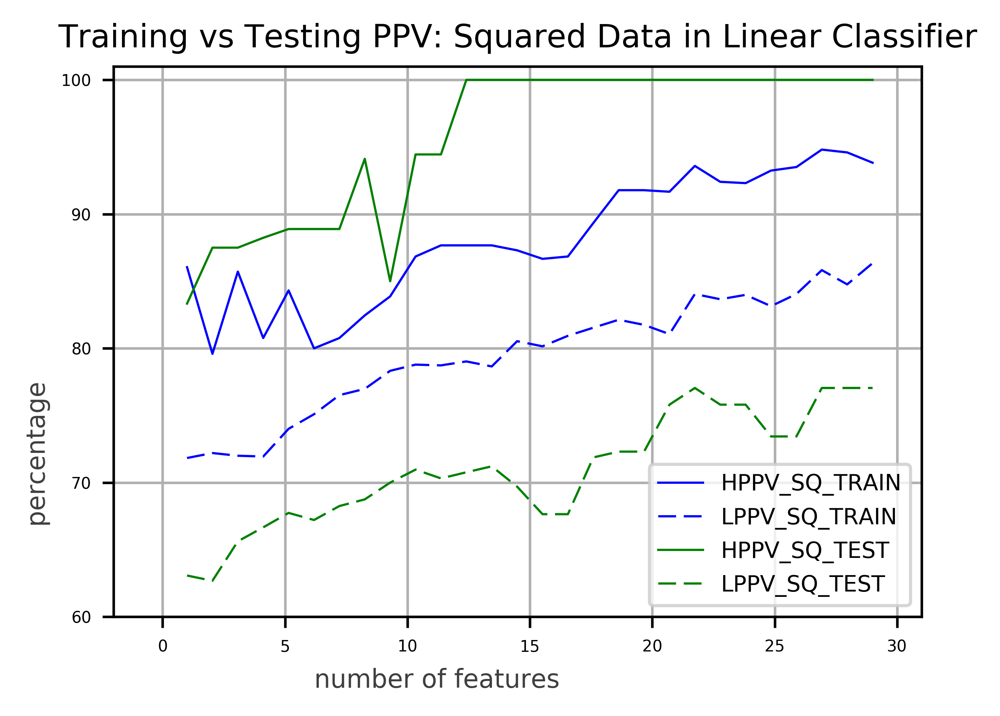

In [860]:
plotLC4(hppvsqarr[3:-1], lppvsqarr[3:-1], Thppvsqarr[3:-1], Tlppvsqarr[3:-1], "HPPV_SQ_TRAIN", "LPPV_SQ_TRAIN", "HPPV_SQ_TEST", \
        "LPPV_SQ_TEST", "Training vs Testing PPV: Squared Data in Linear Classifier")

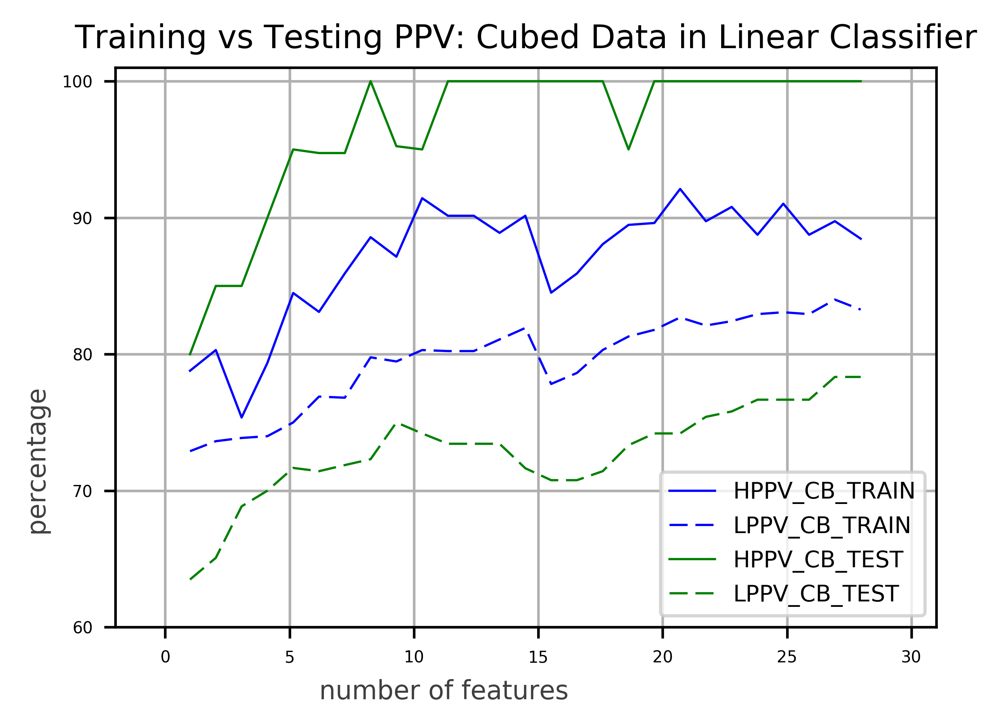

In [861]:
plotLC4(hppvcbarr[3:-1], lppvcbarr[3:-1], Thppvcbarr[3:-1], Tlppvcbarr[3:-1], "HPPV_CB_TRAIN", "LPPV_CB_TRAIN", "HPPV_CB_TEST", \
        "LPPV_CB_TEST", "Training vs Testing PPV: Cubed Data in Linear Classifier")

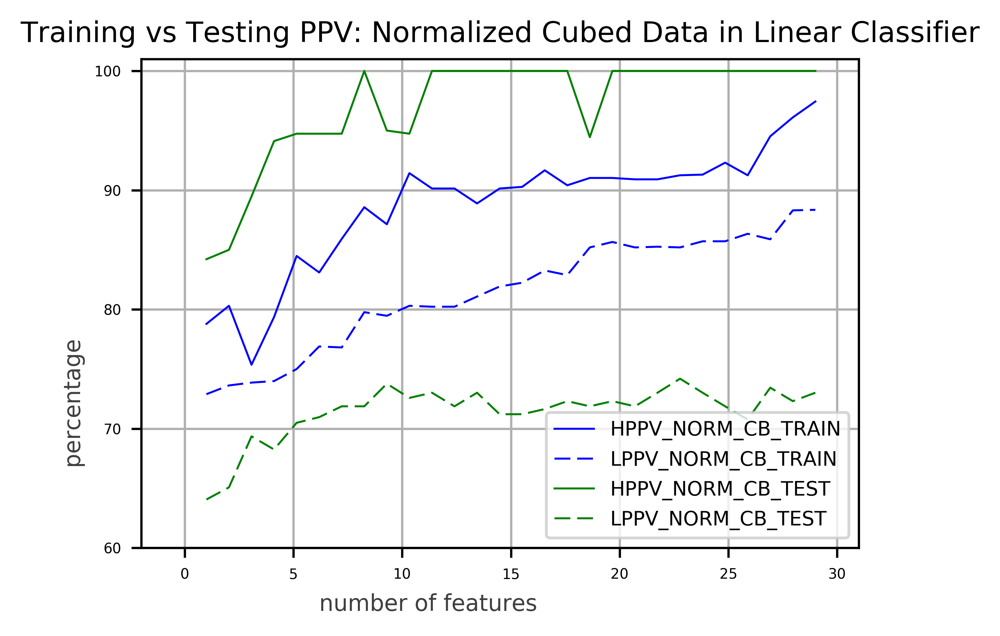

In [862]:
plotLC4(hppvZNcbarr[3:-1], lppvZNcbarr[3:-1], ThppvZNcbarr[3:-1], TlppvZNcbarr[3:-1], "HPPV_NORM_CB_TRAIN", "LPPV_NORM_CB_TRAIN", \
        "HPPV_NORM_CB_TEST", "LPPV_NORM_CB_TEST", "Training vs Testing PPV: Normalized Cubed Data in Linear Classifier")

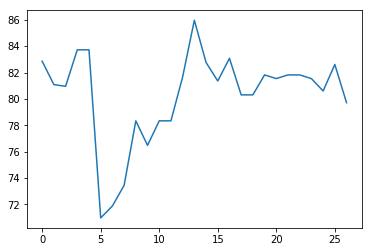

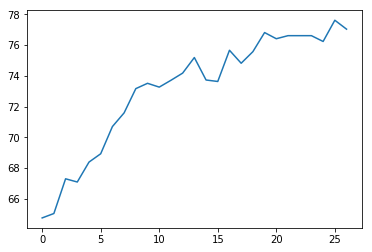

In [863]:
plott(hppvarr[3:-2])
plott(lppvarr[3:-2])


In [864]:
#plotLC(hppvarr, lppvarr, "hppvarr", "lppvarr")


# Principal Component Analysis